In [1]:
# Import Required Libraries
import numpy as np
import scipy.io as sio
import matplotlib.pyplot as plt

In [2]:
# Define Shifted Sphere Function
def shifted_sphere(x, o, f_bias):
    """
    Shifted Sphere Function
    :param x: Input vector (numpy array)
    :param o: Shifted global optimum (numpy array)
    :param f_bias: Bias value (scalar)
    :return: Function value
    """
    # Compute the sum of squared differences between the input vector x and the shift vector o.
    # Then, add the bias value to the result.
    return np.sum((x - o)**2) + f_bias


In [3]:
# Define the Shifted Rastrigin Function
def shifted_rastrigin(x, o, f_bias=0):
    """
    Shifted Rastrigin Function
    :param x: Input vector (numpy array)
    :param o: Shifted global optimum (numpy array)
    :param f_bias: Bias value (scalar)
    :return: Function value
    """
    A = 10  # Rastrigin constant
    n = len(x)
    shifted_x = x - o[:n]  # Shift the input by the global optimum
    return A * n + np.sum(shifted_x**2 - A * np.cos(2 * np.pi * shifted_x)) + f_bias

In [4]:
# Create Ant Colony Optimizer Class
class AntColonyOptimizer:
    def __init__(self, num_ants, num_iterations, bounds, alpha=1, beta=2, evaporation_rate=0.5, q=1.0):
        self.num_ants = num_ants
        self.num_iterations = num_iterations
        self.bounds = bounds
        self.alpha = alpha  # Influence of pheromone
        self.beta = beta    # Influence of heuristic information
        self.evaporation_rate = evaporation_rate
        self.q = q          # Pheromone intensity
        self.dimension = len(bounds)

    def optimize(self, func, o, f_bias=0):
        pheromone = np.ones((self.dimension,))  # Pheromone matrix for each dimension
        best_solution = None
        best_value = float('inf')
        
        for iteration in range(self.num_iterations):
            solutions = []
            values = []

            # Generate solutions by ants
            for _ in range(self.num_ants):
                solution = np.array([np.random.uniform(low, high) for low, high in self.bounds])
                solutions.append(solution)
                values.append(func(solution, o, f_bias))

            # Update best solution
            for i in range(len(values)):
                if values[i] < best_value:
                    best_solution = solutions[i]
                    best_value = values[i]

            # Update pheromone
            pheromone *= (1 - self.evaporation_rate)  # Evaporation
            for i in range(self.num_ants):
                pheromone += self.q / (values[i] + 1e-6)  # Deposit pheromone

            print(f"Iteration {iteration + 1}/{self.num_iterations}: Best Value = {best_value}")

        return best_solution, best_value

In [5]:
# Define Particle Swarm Optimizer Class
class ParticleSwarmOptimizer:
    def __init__(self, num_particles, num_iterations, bounds, w=0.5, c1=2, c2=2):
        """
        PSO Algorithm Initialization
        :param num_particles: Number of particles in the swarm
        :param num_iterations: Number of iterations
        :param bounds: Bounds for each dimension [(min, max), (min, max), ...]
        :param w: Inertia weight
        :param c1: Cognitive component coefficient
        :param c2: Social component coefficient
        """
        self.num_particles = num_particles
        self.num_iterations = num_iterations
        self.bounds = bounds
        self.w = w  # Inertia weight
        self.c1 = c1  # Personal best weight
        self.c2 = c2  # Global best weight
        self.dimension = len(bounds)

        # Initialize particles
        self.particles = np.random.uniform(
            [b[0] for b in bounds], [b[1] for b in bounds], (num_particles, self.dimension)
        )
        self.velocities = np.zeros((num_particles, self.dimension))
        self.personal_best_positions = self.particles.copy()
        self.personal_best_values = np.full(num_particles, float('inf'))
        self.global_best_position = None
        self.global_best_value = float('inf')

    def optimize(self, func, o, f_bias=0):
        for iteration in range(self.num_iterations):
            # Evaluate fitness of each particle
            for i in range(self.num_particles):
                value = func(self.particles[i], o, f_bias)
                if value < self.personal_best_values[i]:
                    self.personal_best_values[i] = value
                    self.personal_best_positions[i] = self.particles[i].copy()

                if value < self.global_best_value:
                    self.global_best_value = value
                    self.global_best_position = self.particles[i].copy()

            # Update velocities and positions
            for i in range(self.num_particles):
                r1, r2 = np.random.rand(self.dimension), np.random.rand(self.dimension)
                self.velocities[i] = (
                    self.w * self.velocities[i]
                    + self.c1 * r1 * (self.personal_best_positions[i] - self.particles[i])
                    + self.c2 * r2 * (self.global_best_position - self.particles[i])
                )
                self.particles[i] = self.particles[i] + self.velocities[i]

                # Apply boundary constraints
                self.particles[i] = np.clip(self.particles[i], [b[0] for b in self.bounds], [b[1] for b in self.bounds])

            print(f"Iteration {iteration + 1}/{self.num_iterations}: Global Best Value = {self.global_best_value:.4f}")

        return self.global_best_position, self.global_best_value

In [6]:
def run_aco_sphere(dimension):
    """
    Run ACO optimization for the Shifted Rastrigin function with dynamic dimensions.
    :param dimension: Number of dimensions (e.g., 2, 10, etc.)
    """
    # Load Data for rastrigin function
    data = sio.loadmat('./matlab/sphere_func_data.mat')
    o = data['o'][0]  # Extracting 'o' values from the loaded MATLAB file

   # Set ACO parameters
    num_ants = 20
    num_iterations = 50
    bounds = [(-100, 100) for _ in range(dimension)]  # For visualization, assume 2 dimensions
    f_bias = 10  # Example bias value

    # Instantiate the optimizer
    aco = AntColonyOptimizer(num_ants, num_iterations, bounds)

    # Run the optimization
    best_solution, best_value = aco.optimize(shifted_sphere, o[:dimension], f_bias)
    print("\n=== Optimization Results ===")
    print("Best Solution:", best_solution)
    print("Best Value:", best_value)

    print("\n=== Optimization Results ===")
    print("Best Solution:", best_solution)
    print("Best Value:", best_value)

    x = np.linspace(bounds[0][0], bounds[0][1], 200)
    y = np.linspace(bounds[1][0], bounds[1][1], 200)
    X, Y = np.meshgrid(x, y)
    Z = np.array([[shifted_sphere(np.array([X[i, j], Y[i, j]]), o[:2], f_bias) for j in range(X.shape[1])] for i in range(X.shape[0])])

    fig = plt.figure(figsize=(10, 7))
    ax = fig.add_subplot(111, projection='3d')

    # Plot the surface
    surf = ax.plot_surface(X, Y, Z, cmap='viridis', alpha=0.8)
    fig.colorbar(surf, ax=ax, shrink=0.5, aspect=5)

    # Plot the best solution
    ax.scatter(best_solution[0], best_solution[1], best_value, color='red', s=100, label='Best Solution')

    # Customize the plot
    ax.set_title("Shifted Sphere Function Landscape with Best Solution (f_bias Included)")
    ax.set_xlabel('X-axis')
    ax.set_ylabel('Y-axis')
    ax.set_zlabel('Function Value (Z)')
    ax.legend()

    plt.show()
    return {"best_solution":best_solution, "best_value":best_value}

Iteration 1/50: Best Value = 164.6753590979194
Iteration 2/50: Best Value = 164.6753590979194
Iteration 3/50: Best Value = 164.6753590979194
Iteration 4/50: Best Value = 164.6753590979194
Iteration 5/50: Best Value = 164.6753590979194
Iteration 6/50: Best Value = 164.6753590979194
Iteration 7/50: Best Value = 164.6753590979194
Iteration 8/50: Best Value = 164.6753590979194
Iteration 9/50: Best Value = 164.6753590979194
Iteration 10/50: Best Value = 164.6753590979194
Iteration 11/50: Best Value = 140.41900999220138
Iteration 12/50: Best Value = 140.41900999220138
Iteration 13/50: Best Value = 140.41900999220138
Iteration 14/50: Best Value = 140.41900999220138
Iteration 15/50: Best Value = 140.41900999220138
Iteration 16/50: Best Value = 140.41900999220138
Iteration 17/50: Best Value = 140.41900999220138
Iteration 18/50: Best Value = 140.41900999220138
Iteration 19/50: Best Value = 140.41900999220138
Iteration 20/50: Best Value = 140.41900999220138
Iteration 21/50: Best Value = 140.41900

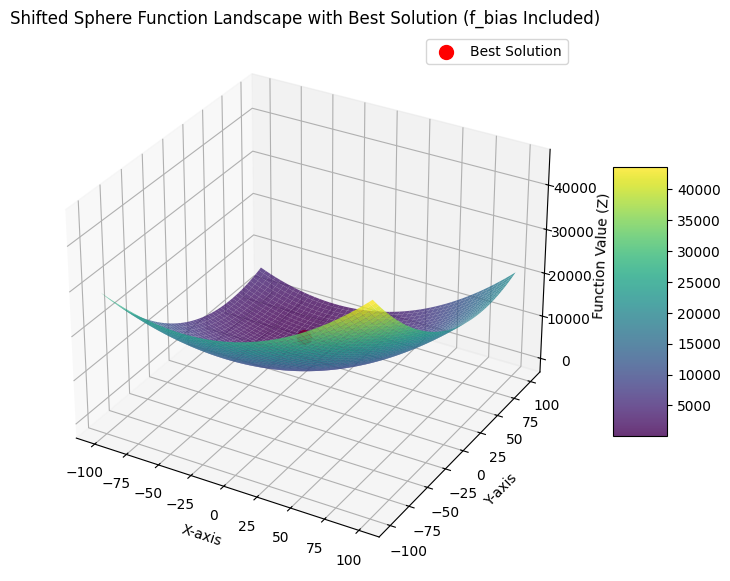

0
best 11.256673096161126
Iteration 1/50: Best Value = 928.8994810102671
Iteration 2/50: Best Value = 583.4555135964877
Iteration 3/50: Best Value = 198.437434990839
Iteration 4/50: Best Value = 198.437434990839
Iteration 5/50: Best Value = 198.437434990839
Iteration 6/50: Best Value = 198.437434990839
Iteration 7/50: Best Value = 198.437434990839
Iteration 8/50: Best Value = 83.47165266622764
Iteration 9/50: Best Value = 83.47165266622764
Iteration 10/50: Best Value = 83.47165266622764
Iteration 11/50: Best Value = 83.47165266622764
Iteration 12/50: Best Value = 41.437867224410766
Iteration 13/50: Best Value = 41.437867224410766
Iteration 14/50: Best Value = 41.437867224410766
Iteration 15/50: Best Value = 41.437867224410766
Iteration 16/50: Best Value = 26.923896482731326
Iteration 17/50: Best Value = 26.923896482731326
Iteration 18/50: Best Value = 26.923896482731326
Iteration 19/50: Best Value = 26.923896482731326
Iteration 20/50: Best Value = 26.923896482731326
Iteration 21/50: Be

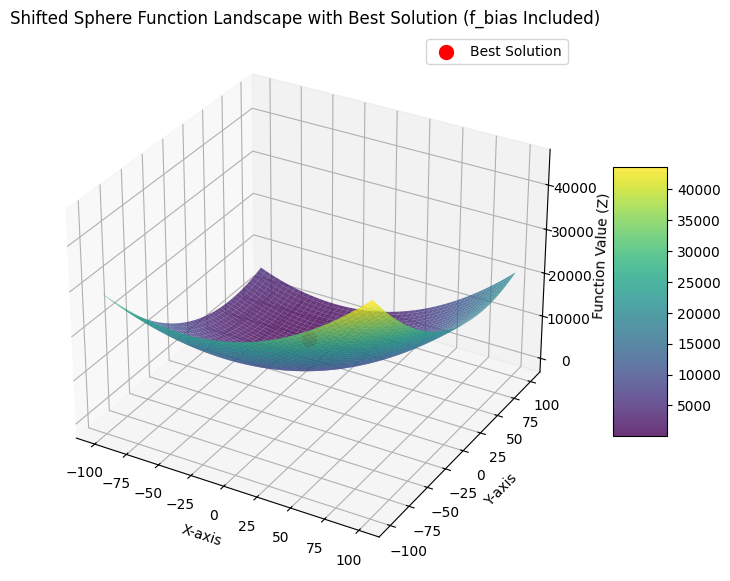

1
best 22.146632696767277
Iteration 1/50: Best Value = 164.1707916923612
Iteration 2/50: Best Value = 17.2950274484216
Iteration 3/50: Best Value = 17.2950274484216
Iteration 4/50: Best Value = 17.2950274484216
Iteration 5/50: Best Value = 17.2950274484216
Iteration 6/50: Best Value = 17.2950274484216
Iteration 7/50: Best Value = 17.2950274484216
Iteration 8/50: Best Value = 17.2950274484216
Iteration 9/50: Best Value = 17.2950274484216
Iteration 10/50: Best Value = 17.2950274484216
Iteration 11/50: Best Value = 17.2950274484216
Iteration 12/50: Best Value = 17.2950274484216
Iteration 13/50: Best Value = 17.2950274484216
Iteration 14/50: Best Value = 17.2950274484216
Iteration 15/50: Best Value = 17.2950274484216
Iteration 16/50: Best Value = 17.2950274484216
Iteration 17/50: Best Value = 17.2950274484216
Iteration 18/50: Best Value = 17.2950274484216
Iteration 19/50: Best Value = 17.2950274484216
Iteration 20/50: Best Value = 17.2950274484216
Iteration 21/50: Best Value = 17.295027448

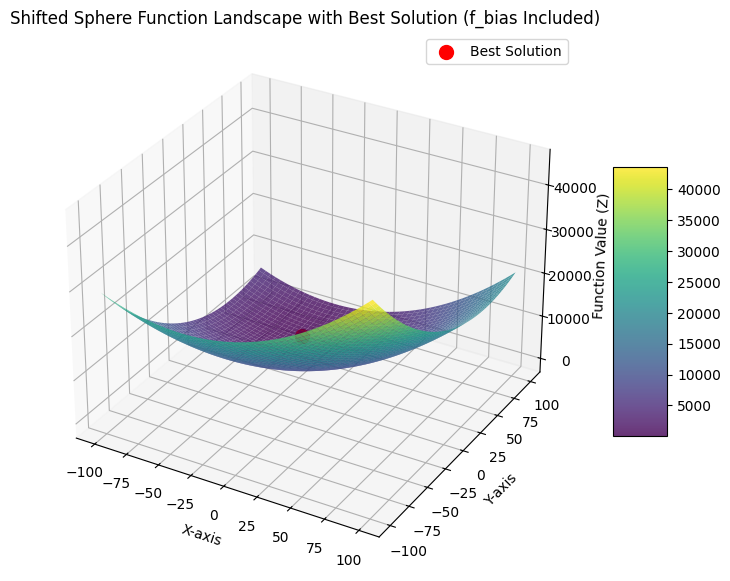

2
best 17.2950274484216
Iteration 1/50: Best Value = 239.1747780481773
Iteration 2/50: Best Value = 239.1747780481773
Iteration 3/50: Best Value = 173.4643661747046
Iteration 4/50: Best Value = 173.4643661747046
Iteration 5/50: Best Value = 173.4643661747046
Iteration 6/50: Best Value = 173.4643661747046
Iteration 7/50: Best Value = 173.4643661747046
Iteration 8/50: Best Value = 27.908829630863266
Iteration 9/50: Best Value = 27.908829630863266
Iteration 10/50: Best Value = 27.908829630863266
Iteration 11/50: Best Value = 27.908829630863266
Iteration 12/50: Best Value = 27.908829630863266
Iteration 13/50: Best Value = 27.908829630863266
Iteration 14/50: Best Value = 27.908829630863266
Iteration 15/50: Best Value = 27.908829630863266
Iteration 16/50: Best Value = 27.908829630863266
Iteration 17/50: Best Value = 27.908829630863266
Iteration 18/50: Best Value = 27.908829630863266
Iteration 19/50: Best Value = 27.908829630863266
Iteration 20/50: Best Value = 27.908829630863266
Iteration 21

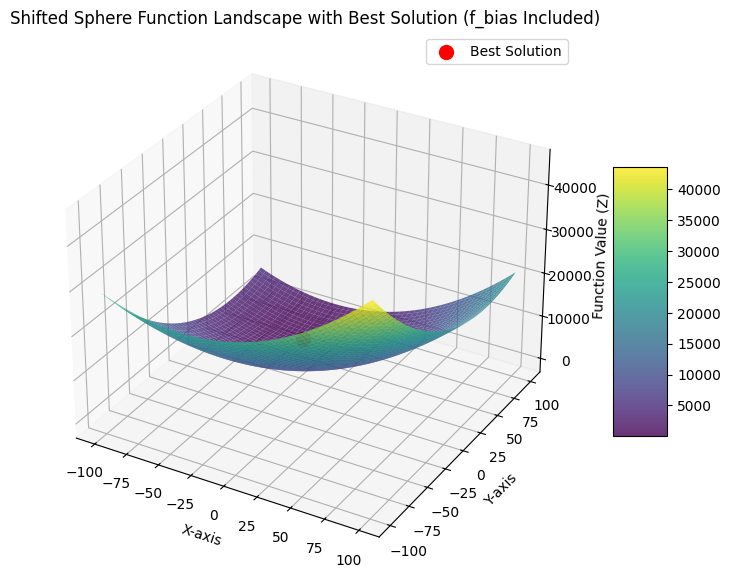

3
best 19.93810116414378
Iteration 1/50: Best Value = 1067.9570130514257
Iteration 2/50: Best Value = 576.9014516652069
Iteration 3/50: Best Value = 576.9014516652069
Iteration 4/50: Best Value = 576.9014516652069
Iteration 5/50: Best Value = 122.35691658997645
Iteration 6/50: Best Value = 73.33464092286556
Iteration 7/50: Best Value = 73.33464092286556
Iteration 8/50: Best Value = 44.215995016182916
Iteration 9/50: Best Value = 44.215995016182916
Iteration 10/50: Best Value = 44.215995016182916
Iteration 11/50: Best Value = 44.215995016182916
Iteration 12/50: Best Value = 44.215995016182916
Iteration 13/50: Best Value = 44.215995016182916
Iteration 14/50: Best Value = 44.215995016182916
Iteration 15/50: Best Value = 44.215995016182916
Iteration 16/50: Best Value = 44.215995016182916
Iteration 17/50: Best Value = 44.215995016182916
Iteration 18/50: Best Value = 44.215995016182916
Iteration 19/50: Best Value = 44.215995016182916
Iteration 20/50: Best Value = 44.215995016182916
Iteration

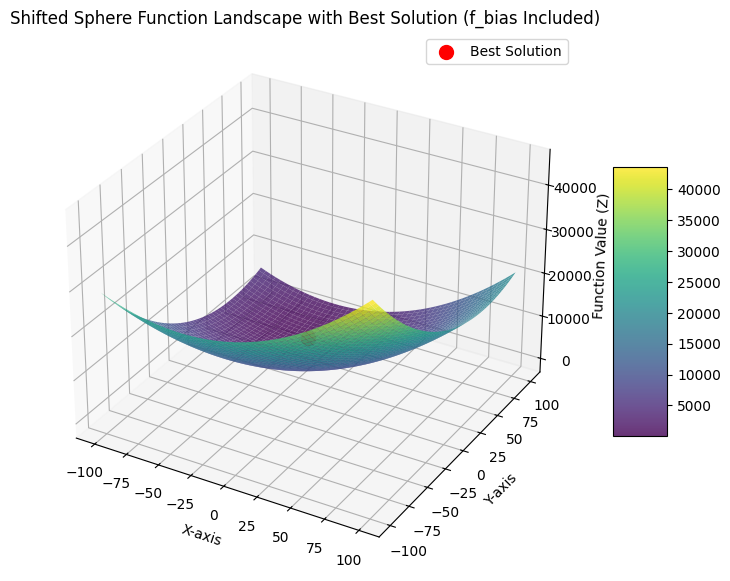

4
best 12.710625032315711
Iteration 1/50: Best Value = 558.1778765235889
Iteration 2/50: Best Value = 273.47825503064297
Iteration 3/50: Best Value = 273.47825503064297
Iteration 4/50: Best Value = 208.4059022577748
Iteration 5/50: Best Value = 140.10436783373837
Iteration 6/50: Best Value = 140.10436783373837
Iteration 7/50: Best Value = 140.10436783373837
Iteration 8/50: Best Value = 140.10436783373837
Iteration 9/50: Best Value = 140.10436783373837
Iteration 10/50: Best Value = 140.10436783373837
Iteration 11/50: Best Value = 140.10436783373837
Iteration 12/50: Best Value = 140.10436783373837
Iteration 13/50: Best Value = 140.10436783373837
Iteration 14/50: Best Value = 140.10436783373837
Iteration 15/50: Best Value = 140.10436783373837
Iteration 16/50: Best Value = 140.10436783373837
Iteration 17/50: Best Value = 140.10436783373837
Iteration 18/50: Best Value = 140.10436783373837
Iteration 19/50: Best Value = 140.10436783373837
Iteration 20/50: Best Value = 140.10436783373837
Itera

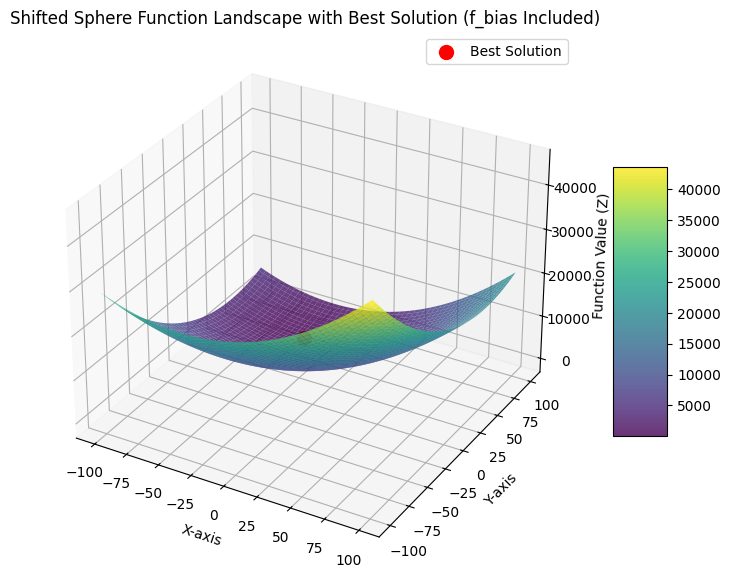

5
best 14.148147698158898
Iteration 1/50: Best Value = 558.3901291024823
Iteration 2/50: Best Value = 63.79210302217976
Iteration 3/50: Best Value = 63.79210302217976
Iteration 4/50: Best Value = 63.79210302217976
Iteration 5/50: Best Value = 63.79210302217976
Iteration 6/50: Best Value = 16.158750801959716
Iteration 7/50: Best Value = 16.158750801959716
Iteration 8/50: Best Value = 16.158750801959716
Iteration 9/50: Best Value = 16.158750801959716
Iteration 10/50: Best Value = 16.158750801959716
Iteration 11/50: Best Value = 16.158750801959716
Iteration 12/50: Best Value = 16.158750801959716
Iteration 13/50: Best Value = 16.158750801959716
Iteration 14/50: Best Value = 16.158750801959716
Iteration 15/50: Best Value = 16.158750801959716
Iteration 16/50: Best Value = 16.158750801959716
Iteration 17/50: Best Value = 16.158750801959716
Iteration 18/50: Best Value = 16.158750801959716
Iteration 19/50: Best Value = 16.158750801959716
Iteration 20/50: Best Value = 16.158750801959716
Iteratio

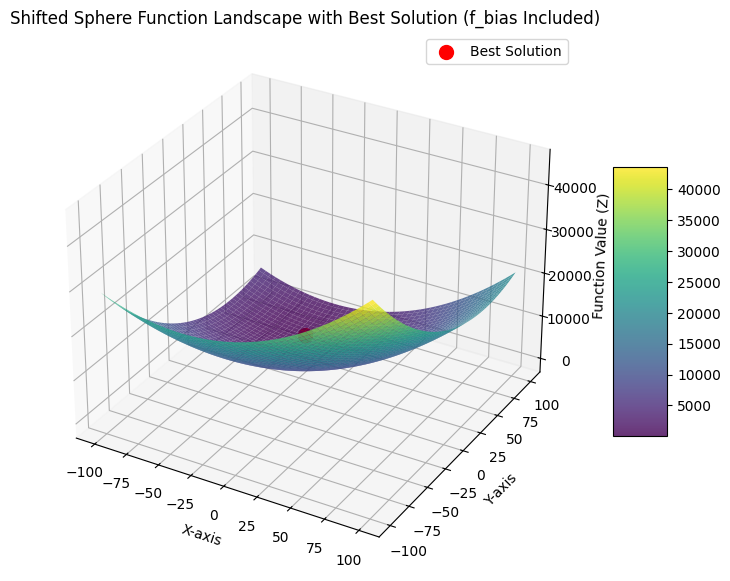

6
best 16.158750801959716
Iteration 1/50: Best Value = 891.3047434995478
Iteration 2/50: Best Value = 53.2669940729624
Iteration 3/50: Best Value = 53.2669940729624
Iteration 4/50: Best Value = 53.2669940729624
Iteration 5/50: Best Value = 53.2669940729624
Iteration 6/50: Best Value = 53.2669940729624
Iteration 7/50: Best Value = 53.2669940729624
Iteration 8/50: Best Value = 53.2669940729624
Iteration 9/50: Best Value = 53.2669940729624
Iteration 10/50: Best Value = 53.2669940729624
Iteration 11/50: Best Value = 53.2669940729624
Iteration 12/50: Best Value = 53.2669940729624
Iteration 13/50: Best Value = 53.2669940729624
Iteration 14/50: Best Value = 53.2669940729624
Iteration 15/50: Best Value = 53.2669940729624
Iteration 16/50: Best Value = 31.97624681378866
Iteration 17/50: Best Value = 31.97624681378866
Iteration 18/50: Best Value = 31.97624681378866
Iteration 19/50: Best Value = 31.97624681378866
Iteration 20/50: Best Value = 31.97624681378866
Iteration 21/50: Best Value = 31.9762

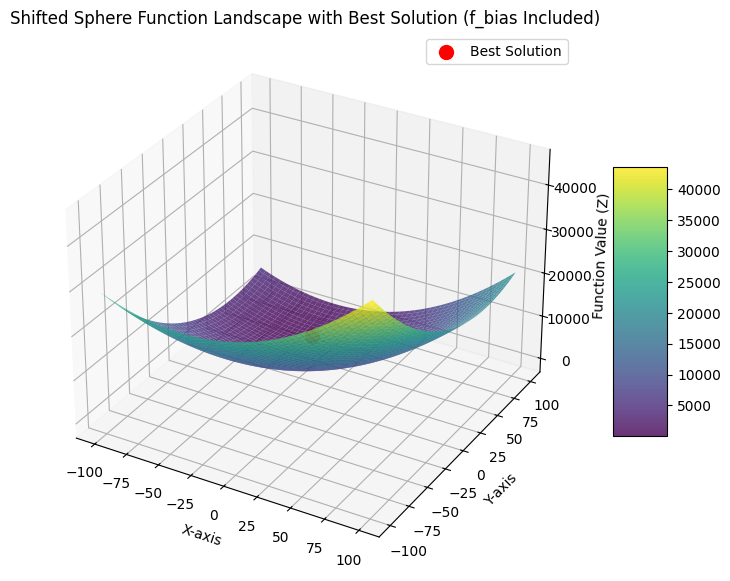

7
best 31.082728534398456
Iteration 1/50: Best Value = 33.114885292713545
Iteration 2/50: Best Value = 33.114885292713545
Iteration 3/50: Best Value = 33.114885292713545
Iteration 4/50: Best Value = 33.114885292713545
Iteration 5/50: Best Value = 33.114885292713545
Iteration 6/50: Best Value = 33.114885292713545
Iteration 7/50: Best Value = 10.440537313603306
Iteration 8/50: Best Value = 10.440537313603306
Iteration 9/50: Best Value = 10.440537313603306
Iteration 10/50: Best Value = 10.440537313603306
Iteration 11/50: Best Value = 10.440537313603306
Iteration 12/50: Best Value = 10.440537313603306
Iteration 13/50: Best Value = 10.440537313603306
Iteration 14/50: Best Value = 10.440537313603306
Iteration 15/50: Best Value = 10.440537313603306
Iteration 16/50: Best Value = 10.440537313603306
Iteration 17/50: Best Value = 10.440537313603306
Iteration 18/50: Best Value = 10.440537313603306
Iteration 19/50: Best Value = 10.440537313603306
Iteration 20/50: Best Value = 10.440537313603306
Ite

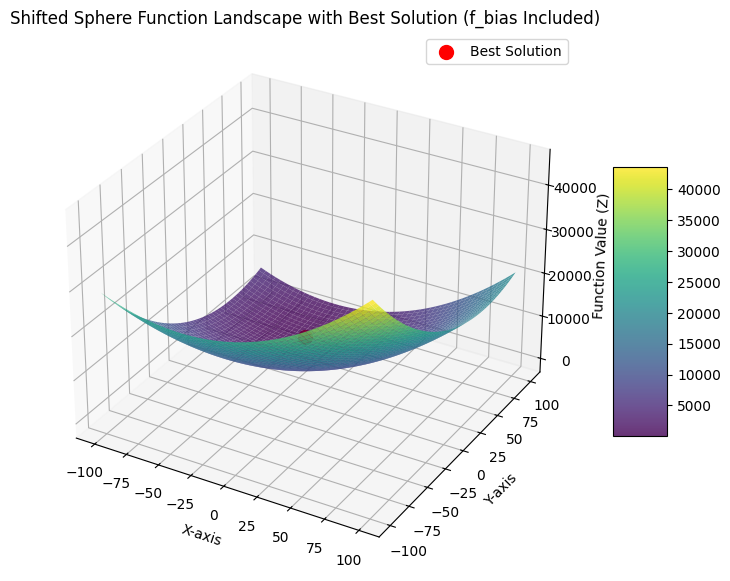

8
best 10.440537313603306
Iteration 1/50: Best Value = 206.754251588569
Iteration 2/50: Best Value = 206.754251588569
Iteration 3/50: Best Value = 80.17325272517846
Iteration 4/50: Best Value = 29.1725138350543
Iteration 5/50: Best Value = 29.1725138350543
Iteration 6/50: Best Value = 29.1725138350543
Iteration 7/50: Best Value = 29.1725138350543
Iteration 8/50: Best Value = 29.1725138350543
Iteration 9/50: Best Value = 29.1725138350543
Iteration 10/50: Best Value = 29.1725138350543
Iteration 11/50: Best Value = 29.1725138350543
Iteration 12/50: Best Value = 29.1725138350543
Iteration 13/50: Best Value = 29.1725138350543
Iteration 14/50: Best Value = 29.1725138350543
Iteration 15/50: Best Value = 29.1725138350543
Iteration 16/50: Best Value = 29.1725138350543
Iteration 17/50: Best Value = 29.1725138350543
Iteration 18/50: Best Value = 29.1725138350543
Iteration 19/50: Best Value = 29.1725138350543
Iteration 20/50: Best Value = 29.1725138350543
Iteration 21/50: Best Value = 29.172513835

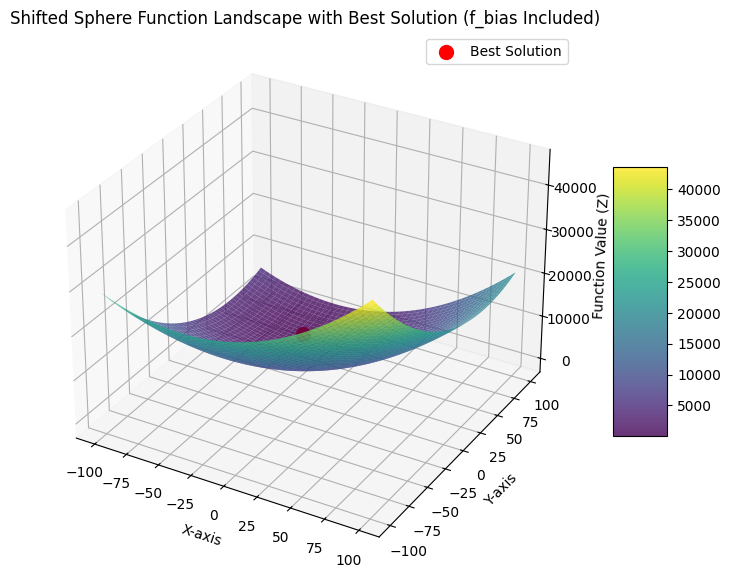

9
best 29.1725138350543
Iteration 1/50: Best Value = 58.86939470577177
Iteration 2/50: Best Value = 58.86939470577177
Iteration 3/50: Best Value = 58.86939470577177
Iteration 4/50: Best Value = 58.86939470577177
Iteration 5/50: Best Value = 58.86939470577177
Iteration 6/50: Best Value = 58.86939470577177
Iteration 7/50: Best Value = 58.86939470577177
Iteration 8/50: Best Value = 58.86939470577177
Iteration 9/50: Best Value = 58.86939470577177
Iteration 10/50: Best Value = 58.86939470577177
Iteration 11/50: Best Value = 58.86939470577177
Iteration 12/50: Best Value = 58.86939470577177
Iteration 13/50: Best Value = 58.86939470577177
Iteration 14/50: Best Value = 58.86939470577177
Iteration 15/50: Best Value = 58.86939470577177
Iteration 16/50: Best Value = 58.86939470577177
Iteration 17/50: Best Value = 58.86939470577177
Iteration 18/50: Best Value = 58.86939470577177
Iteration 19/50: Best Value = 58.86939470577177
Iteration 20/50: Best Value = 58.86939470577177
Iteration 21/50: Best Val

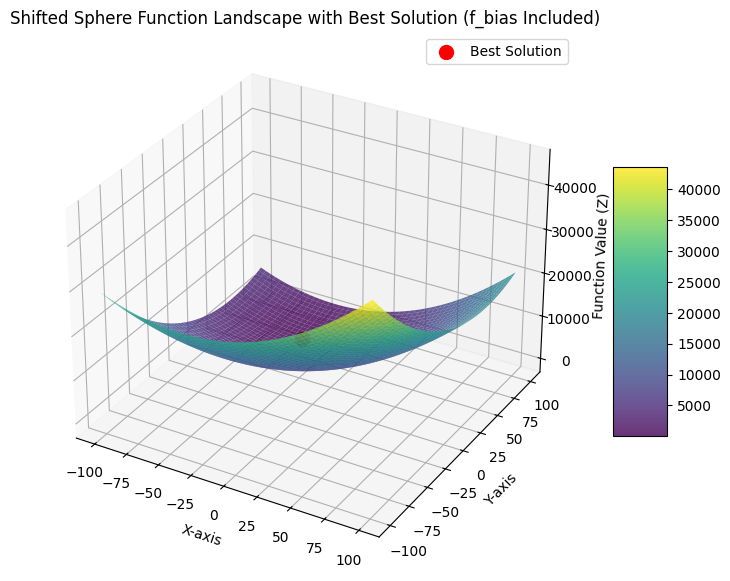

10
best 23.281214045066633
Iteration 1/50: Best Value = 598.9076603467518
Iteration 2/50: Best Value = 403.5606894648128
Iteration 3/50: Best Value = 403.5606894648128
Iteration 4/50: Best Value = 221.6556690886988
Iteration 5/50: Best Value = 221.6556690886988
Iteration 6/50: Best Value = 48.571643266354066
Iteration 7/50: Best Value = 48.571643266354066
Iteration 8/50: Best Value = 48.571643266354066
Iteration 9/50: Best Value = 48.571643266354066
Iteration 10/50: Best Value = 48.571643266354066
Iteration 11/50: Best Value = 48.571643266354066
Iteration 12/50: Best Value = 48.571643266354066
Iteration 13/50: Best Value = 48.571643266354066
Iteration 14/50: Best Value = 48.571643266354066
Iteration 15/50: Best Value = 48.571643266354066
Iteration 16/50: Best Value = 48.571643266354066
Iteration 17/50: Best Value = 28.20803445680597
Iteration 18/50: Best Value = 28.20803445680597
Iteration 19/50: Best Value = 28.20803445680597
Iteration 20/50: Best Value = 28.20803445680597
Iteration 2

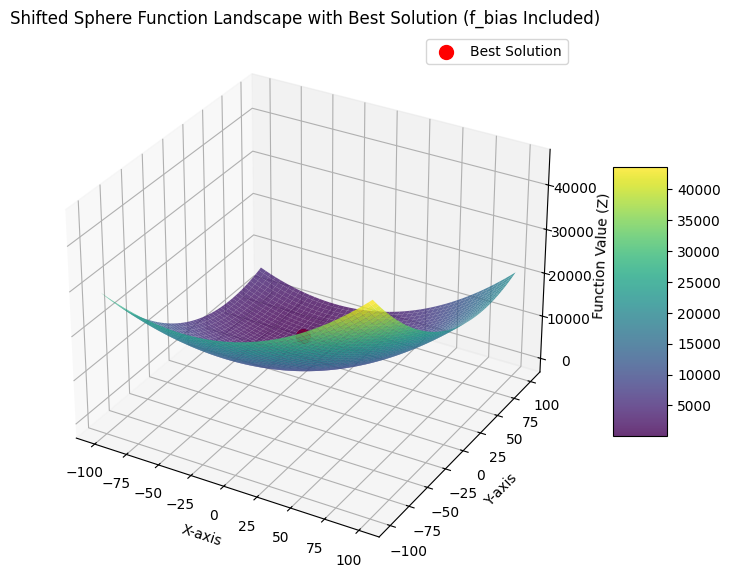

11
best 13.746508194359494
Iteration 1/50: Best Value = 94.94808859800989
Iteration 2/50: Best Value = 94.94808859800989
Iteration 3/50: Best Value = 94.94808859800989
Iteration 4/50: Best Value = 94.94808859800989
Iteration 5/50: Best Value = 94.94808859800989
Iteration 6/50: Best Value = 94.94808859800989
Iteration 7/50: Best Value = 94.94808859800989
Iteration 8/50: Best Value = 94.94808859800989
Iteration 9/50: Best Value = 94.94808859800989
Iteration 10/50: Best Value = 56.85959782701546
Iteration 11/50: Best Value = 56.85959782701546
Iteration 12/50: Best Value = 56.85959782701546
Iteration 13/50: Best Value = 56.85959782701546
Iteration 14/50: Best Value = 56.85959782701546
Iteration 15/50: Best Value = 56.85959782701546
Iteration 16/50: Best Value = 56.85959782701546
Iteration 17/50: Best Value = 56.85959782701546
Iteration 18/50: Best Value = 56.85959782701546
Iteration 19/50: Best Value = 56.85959782701546
Iteration 20/50: Best Value = 56.85959782701546
Iteration 21/50: Best 

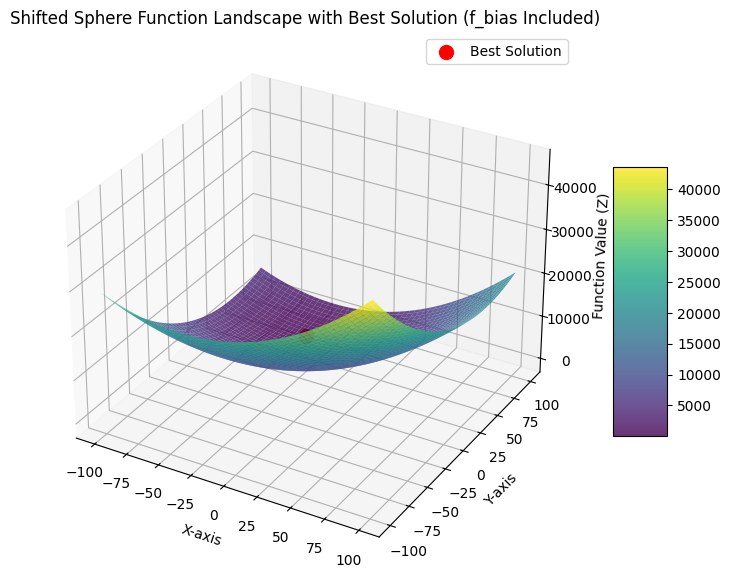

12
best 12.077030390918377
Iteration 1/50: Best Value = 671.6309342984507
Iteration 2/50: Best Value = 671.6309342984507
Iteration 3/50: Best Value = 457.6826709002636
Iteration 4/50: Best Value = 457.6826709002636
Iteration 5/50: Best Value = 457.6826709002636
Iteration 6/50: Best Value = 188.86424246346053
Iteration 7/50: Best Value = 37.920048175271866
Iteration 8/50: Best Value = 22.59221663292338
Iteration 9/50: Best Value = 22.59221663292338
Iteration 10/50: Best Value = 22.59221663292338
Iteration 11/50: Best Value = 22.59221663292338
Iteration 12/50: Best Value = 22.59221663292338
Iteration 13/50: Best Value = 22.59221663292338
Iteration 14/50: Best Value = 22.59221663292338
Iteration 15/50: Best Value = 22.59221663292338
Iteration 16/50: Best Value = 22.59221663292338
Iteration 17/50: Best Value = 22.59221663292338
Iteration 18/50: Best Value = 22.59221663292338
Iteration 19/50: Best Value = 22.59221663292338
Iteration 20/50: Best Value = 22.59221663292338
Iteration 21/50: Bes

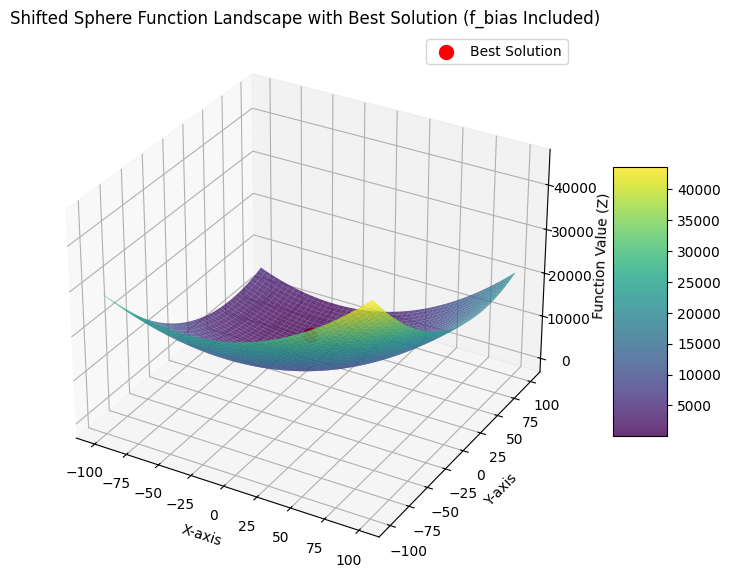

13
best 22.59221663292338
Iteration 1/50: Best Value = 888.8160402029855
Iteration 2/50: Best Value = 696.6404510699921
Iteration 3/50: Best Value = 696.6404510699921
Iteration 4/50: Best Value = 638.2452791302028
Iteration 5/50: Best Value = 128.7044597186392
Iteration 6/50: Best Value = 128.7044597186392
Iteration 7/50: Best Value = 128.7044597186392
Iteration 8/50: Best Value = 128.7044597186392
Iteration 9/50: Best Value = 128.7044597186392
Iteration 10/50: Best Value = 128.7044597186392
Iteration 11/50: Best Value = 128.7044597186392
Iteration 12/50: Best Value = 122.04771788212585
Iteration 13/50: Best Value = 122.04771788212585
Iteration 14/50: Best Value = 122.04771788212585
Iteration 15/50: Best Value = 122.04771788212585
Iteration 16/50: Best Value = 122.04771788212585
Iteration 17/50: Best Value = 122.04771788212585
Iteration 18/50: Best Value = 122.04771788212585
Iteration 19/50: Best Value = 122.04771788212585
Iteration 20/50: Best Value = 122.04771788212585
Iteration 21/5

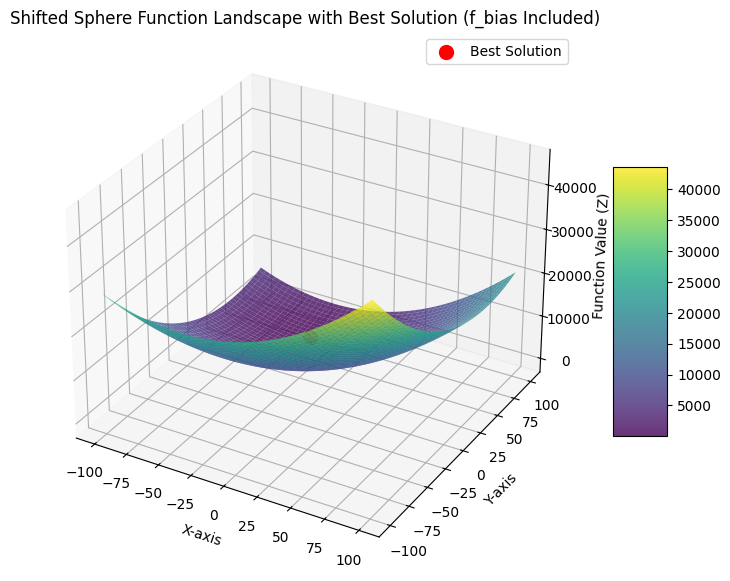

14
best 17.445319183180267


In [7]:
# Run Ant Colony Optimization on Sphere function for D = 2
best_solutions = []
for i in range(0, 15):
    aco_solution = run_aco_sphere(2)
    print(i)
    print('best',aco_solution['best_value'])
    best_solutions.append(aco_solution)

In [8]:
# Get Average, Min, Max of Best values for D = 2
best_values = [solution['best_value'] for solution in best_solutions]

average = np.average(best_values)
min = np.min(best_values)
max = np.max(best_values)
standard_deviation = np.std(best_values)

print("Average: ", average)
print("Min: ", min)
print("Max: ", max)
print("Standard Deviation", standard_deviation)

Average:  18.232801737828822
Min:  10.440537313603306
Max:  31.082728534398456
Standard Deviation 6.1530544208555735


Iteration 1/50: Best Value = 14950.85419268744
Iteration 2/50: Best Value = 14950.85419268744
Iteration 3/50: Best Value = 14950.85419268744
Iteration 4/50: Best Value = 14950.85419268744
Iteration 5/50: Best Value = 14950.85419268744
Iteration 6/50: Best Value = 14950.85419268744
Iteration 7/50: Best Value = 14950.85419268744
Iteration 8/50: Best Value = 14950.85419268744
Iteration 9/50: Best Value = 14950.85419268744
Iteration 10/50: Best Value = 14950.85419268744
Iteration 11/50: Best Value = 14950.85419268744
Iteration 12/50: Best Value = 14950.85419268744
Iteration 13/50: Best Value = 14950.85419268744
Iteration 14/50: Best Value = 14950.85419268744
Iteration 15/50: Best Value = 14950.85419268744
Iteration 16/50: Best Value = 14950.85419268744
Iteration 17/50: Best Value = 14950.85419268744
Iteration 18/50: Best Value = 14950.85419268744
Iteration 19/50: Best Value = 14950.85419268744
Iteration 20/50: Best Value = 14950.85419268744
Iteration 21/50: Best Value = 14950.85419268744
I

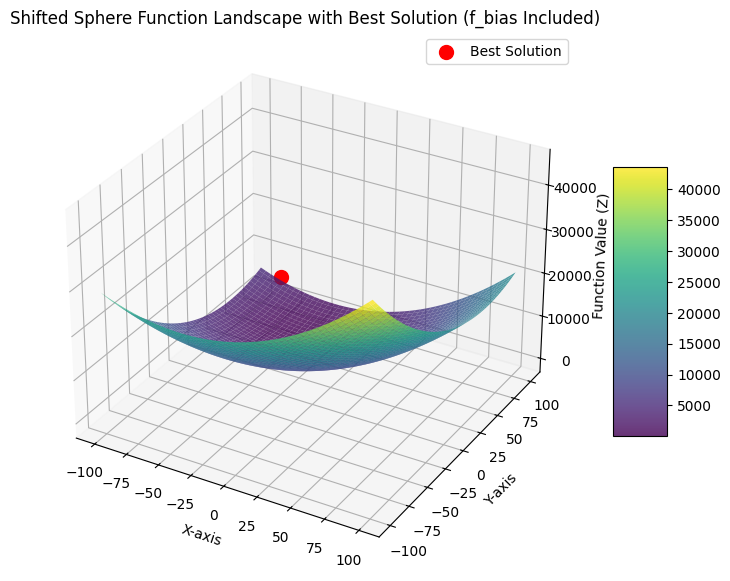

0
best 9580.186938290439
Iteration 1/50: Best Value = 19362.228993032797
Iteration 2/50: Best Value = 19362.228993032797
Iteration 3/50: Best Value = 19362.228993032797
Iteration 4/50: Best Value = 19362.228993032797
Iteration 5/50: Best Value = 19362.228993032797
Iteration 6/50: Best Value = 18023.104505673306
Iteration 7/50: Best Value = 18023.104505673306
Iteration 8/50: Best Value = 11860.919828280494
Iteration 9/50: Best Value = 11860.919828280494
Iteration 10/50: Best Value = 11860.919828280494
Iteration 11/50: Best Value = 11860.919828280494
Iteration 12/50: Best Value = 11860.919828280494
Iteration 13/50: Best Value = 11860.919828280494
Iteration 14/50: Best Value = 11860.919828280494
Iteration 15/50: Best Value = 11860.919828280494
Iteration 16/50: Best Value = 11860.919828280494
Iteration 17/50: Best Value = 11860.919828280494
Iteration 18/50: Best Value = 11860.919828280494
Iteration 19/50: Best Value = 11860.919828280494
Iteration 20/50: Best Value = 11860.919828280494
Iter

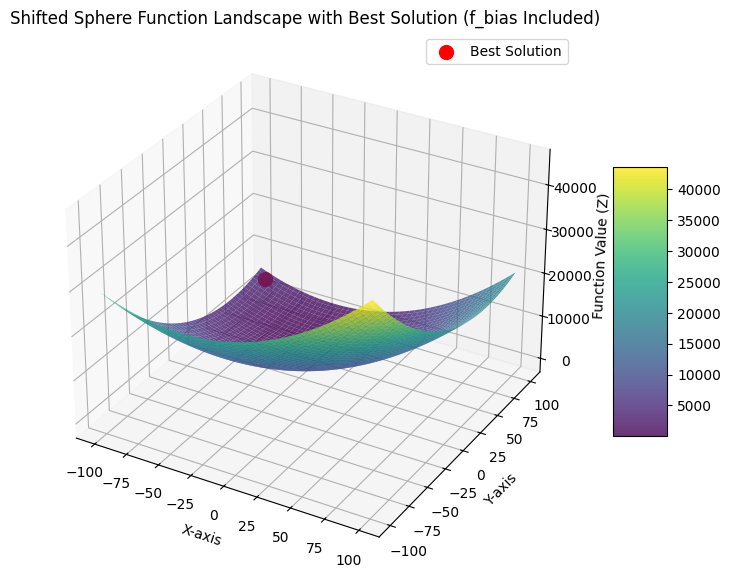

1
best 11860.919828280494
Iteration 1/50: Best Value = 21011.89278964638
Iteration 2/50: Best Value = 21011.89278964638
Iteration 3/50: Best Value = 21011.89278964638
Iteration 4/50: Best Value = 21011.89278964638
Iteration 5/50: Best Value = 21011.89278964638
Iteration 6/50: Best Value = 21011.89278964638
Iteration 7/50: Best Value = 21011.89278964638
Iteration 8/50: Best Value = 20962.190286288504
Iteration 9/50: Best Value = 20962.190286288504
Iteration 10/50: Best Value = 20962.190286288504
Iteration 11/50: Best Value = 19420.25210881631
Iteration 12/50: Best Value = 19420.25210881631
Iteration 13/50: Best Value = 19420.25210881631
Iteration 14/50: Best Value = 18027.108311278156
Iteration 15/50: Best Value = 18027.108311278156
Iteration 16/50: Best Value = 18027.108311278156
Iteration 17/50: Best Value = 18027.108311278156
Iteration 18/50: Best Value = 18027.108311278156
Iteration 19/50: Best Value = 18027.108311278156
Iteration 20/50: Best Value = 17787.577278197445
Iteration 21/

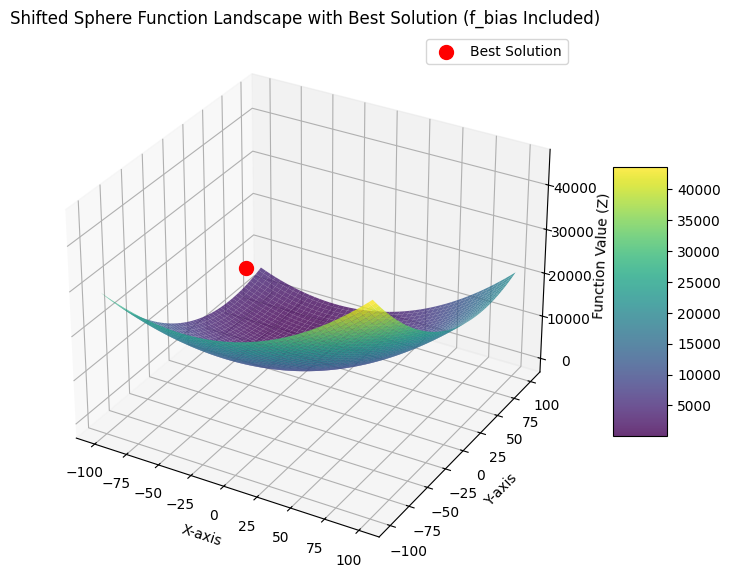

2
best 16813.759151357102
Iteration 1/50: Best Value = 23477.319191290997
Iteration 2/50: Best Value = 23477.319191290997
Iteration 3/50: Best Value = 23477.319191290997
Iteration 4/50: Best Value = 23477.319191290997
Iteration 5/50: Best Value = 19779.833220224504
Iteration 6/50: Best Value = 18534.5458790598
Iteration 7/50: Best Value = 18534.5458790598
Iteration 8/50: Best Value = 18534.5458790598
Iteration 9/50: Best Value = 18534.5458790598
Iteration 10/50: Best Value = 18534.5458790598
Iteration 11/50: Best Value = 18166.699662707153
Iteration 12/50: Best Value = 18166.699662707153
Iteration 13/50: Best Value = 18166.699662707153
Iteration 14/50: Best Value = 18166.699662707153
Iteration 15/50: Best Value = 18166.699662707153
Iteration 16/50: Best Value = 18166.699662707153
Iteration 17/50: Best Value = 18166.699662707153
Iteration 18/50: Best Value = 18166.699662707153
Iteration 19/50: Best Value = 18166.699662707153
Iteration 20/50: Best Value = 18166.699662707153
Iteration 21/

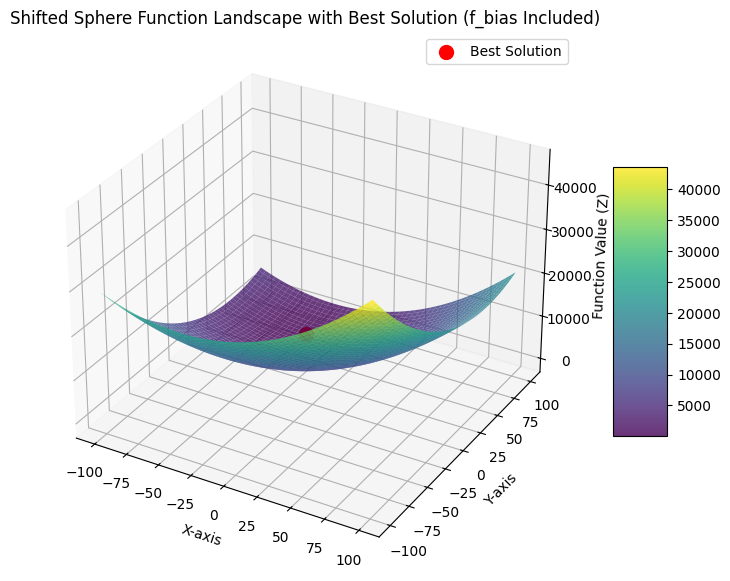

3
best 12581.348209963224
Iteration 1/50: Best Value = 30659.276215997896
Iteration 2/50: Best Value = 30659.276215997896
Iteration 3/50: Best Value = 24176.03760370372
Iteration 4/50: Best Value = 24176.03760370372
Iteration 5/50: Best Value = 8813.38166817175
Iteration 6/50: Best Value = 8813.38166817175
Iteration 7/50: Best Value = 8813.38166817175
Iteration 8/50: Best Value = 8813.38166817175
Iteration 9/50: Best Value = 8813.38166817175
Iteration 10/50: Best Value = 8813.38166817175
Iteration 11/50: Best Value = 8813.38166817175
Iteration 12/50: Best Value = 8813.38166817175
Iteration 13/50: Best Value = 8813.38166817175
Iteration 14/50: Best Value = 8813.38166817175
Iteration 15/50: Best Value = 8813.38166817175
Iteration 16/50: Best Value = 8813.38166817175
Iteration 17/50: Best Value = 8813.38166817175
Iteration 18/50: Best Value = 8813.38166817175
Iteration 19/50: Best Value = 8813.38166817175
Iteration 20/50: Best Value = 8813.38166817175
Iteration 21/50: Best Value = 8813.38

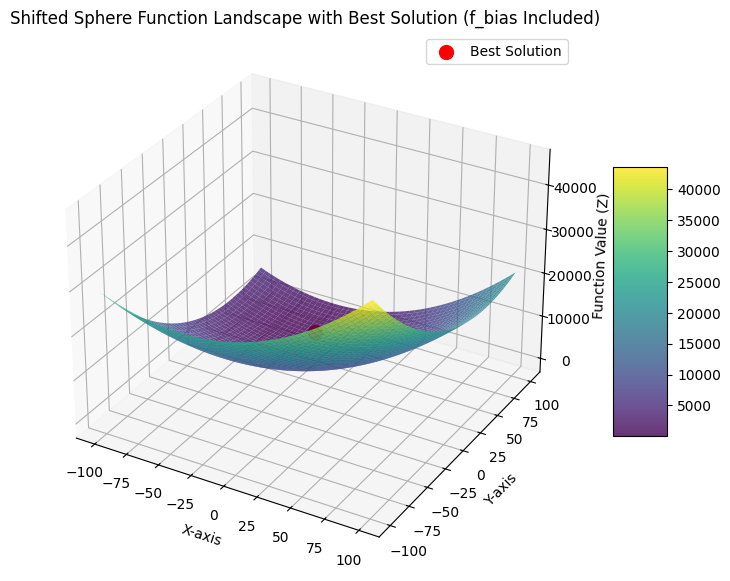

4
best 8813.38166817175
Iteration 1/50: Best Value = 22465.603530772503
Iteration 2/50: Best Value = 22465.603530772503
Iteration 3/50: Best Value = 16341.341090732138
Iteration 4/50: Best Value = 16341.341090732138
Iteration 5/50: Best Value = 16341.341090732138
Iteration 6/50: Best Value = 16341.341090732138
Iteration 7/50: Best Value = 16341.341090732138
Iteration 8/50: Best Value = 16341.341090732138
Iteration 9/50: Best Value = 15614.724351374443
Iteration 10/50: Best Value = 15614.724351374443
Iteration 11/50: Best Value = 15614.724351374443
Iteration 12/50: Best Value = 15614.724351374443
Iteration 13/50: Best Value = 15614.724351374443
Iteration 14/50: Best Value = 15614.724351374443
Iteration 15/50: Best Value = 15614.724351374443
Iteration 16/50: Best Value = 15614.724351374443
Iteration 17/50: Best Value = 9222.246707470842
Iteration 18/50: Best Value = 9222.246707470842
Iteration 19/50: Best Value = 9222.246707470842
Iteration 20/50: Best Value = 9222.246707470842
Iteration

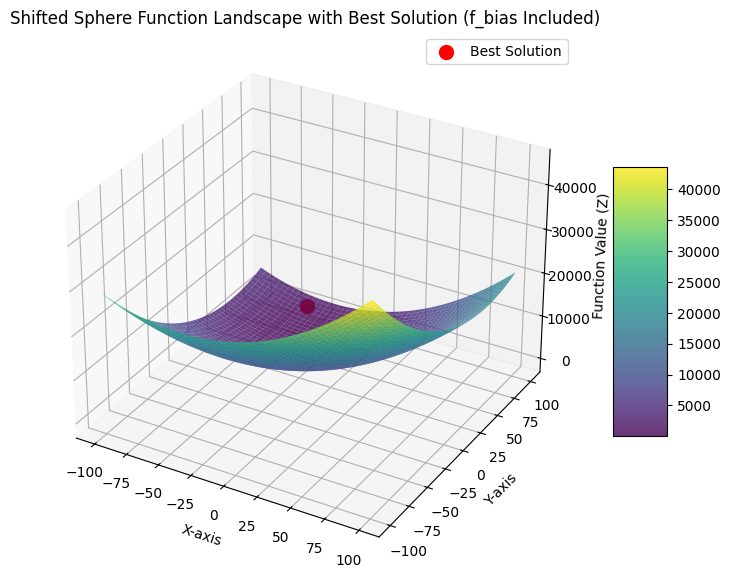

5
best 9222.246707470842
Iteration 1/50: Best Value = 26740.7518410242
Iteration 2/50: Best Value = 26740.7518410242
Iteration 3/50: Best Value = 17285.721756877963
Iteration 4/50: Best Value = 17285.721756877963
Iteration 5/50: Best Value = 17285.721756877963
Iteration 6/50: Best Value = 17285.721756877963
Iteration 7/50: Best Value = 17285.721756877963
Iteration 8/50: Best Value = 17285.721756877963
Iteration 9/50: Best Value = 17285.721756877963
Iteration 10/50: Best Value = 17285.721756877963
Iteration 11/50: Best Value = 17285.721756877963
Iteration 12/50: Best Value = 17285.721756877963
Iteration 13/50: Best Value = 11519.111190361597
Iteration 14/50: Best Value = 11519.111190361597
Iteration 15/50: Best Value = 11519.111190361597
Iteration 16/50: Best Value = 11519.111190361597
Iteration 17/50: Best Value = 11519.111190361597
Iteration 18/50: Best Value = 11519.111190361597
Iteration 19/50: Best Value = 11519.111190361597
Iteration 20/50: Best Value = 11519.111190361597
Iteratio

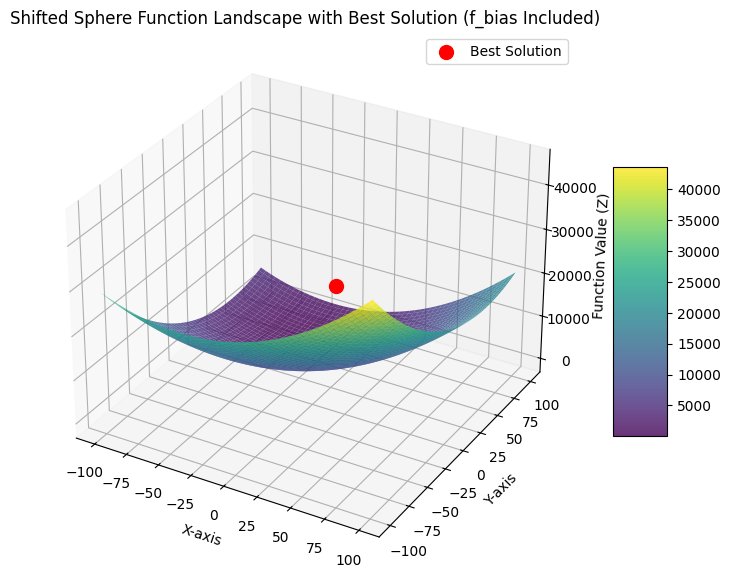

6
best 6543.940451918129
Iteration 1/50: Best Value = 34277.787720964196
Iteration 2/50: Best Value = 25104.30444788937
Iteration 3/50: Best Value = 25104.30444788937
Iteration 4/50: Best Value = 19559.615148935874
Iteration 5/50: Best Value = 17437.914380811802
Iteration 6/50: Best Value = 17437.914380811802
Iteration 7/50: Best Value = 13536.391392619362
Iteration 8/50: Best Value = 13536.391392619362
Iteration 9/50: Best Value = 13536.391392619362
Iteration 10/50: Best Value = 13536.391392619362
Iteration 11/50: Best Value = 13536.391392619362
Iteration 12/50: Best Value = 13536.391392619362
Iteration 13/50: Best Value = 13536.391392619362
Iteration 14/50: Best Value = 13536.391392619362
Iteration 15/50: Best Value = 13536.391392619362
Iteration 16/50: Best Value = 13536.391392619362
Iteration 17/50: Best Value = 13536.391392619362
Iteration 18/50: Best Value = 13536.391392619362
Iteration 19/50: Best Value = 13536.391392619362
Iteration 20/50: Best Value = 13536.391392619362
Iterat

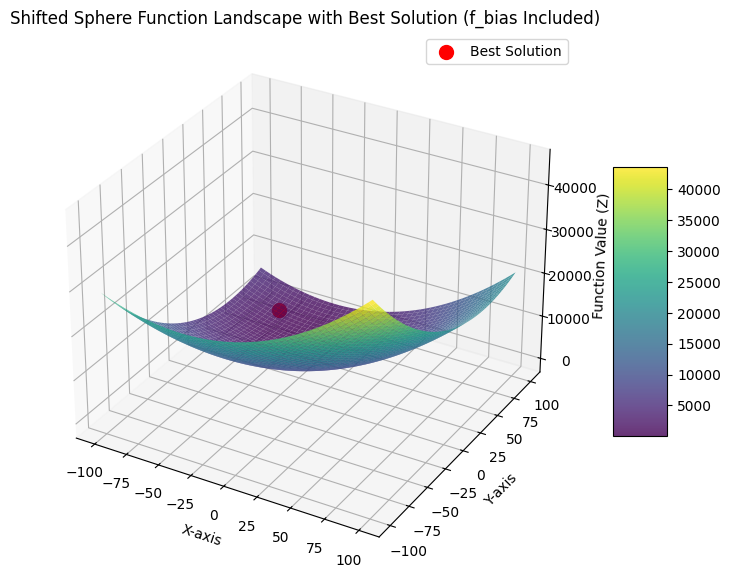

7
best 9994.773985810903
Iteration 1/50: Best Value = 26390.071834262348
Iteration 2/50: Best Value = 26390.071834262348
Iteration 3/50: Best Value = 26390.071834262348
Iteration 4/50: Best Value = 26390.071834262348
Iteration 5/50: Best Value = 12202.50536506224
Iteration 6/50: Best Value = 12202.50536506224
Iteration 7/50: Best Value = 12202.50536506224
Iteration 8/50: Best Value = 12202.50536506224
Iteration 9/50: Best Value = 12202.50536506224
Iteration 10/50: Best Value = 12202.50536506224
Iteration 11/50: Best Value = 12202.50536506224
Iteration 12/50: Best Value = 12202.50536506224
Iteration 13/50: Best Value = 12202.50536506224
Iteration 14/50: Best Value = 12202.50536506224
Iteration 15/50: Best Value = 12202.50536506224
Iteration 16/50: Best Value = 12202.50536506224
Iteration 17/50: Best Value = 12202.50536506224
Iteration 18/50: Best Value = 12202.50536506224
Iteration 19/50: Best Value = 12202.50536506224
Iteration 20/50: Best Value = 12202.50536506224
Iteration 21/50: Bes

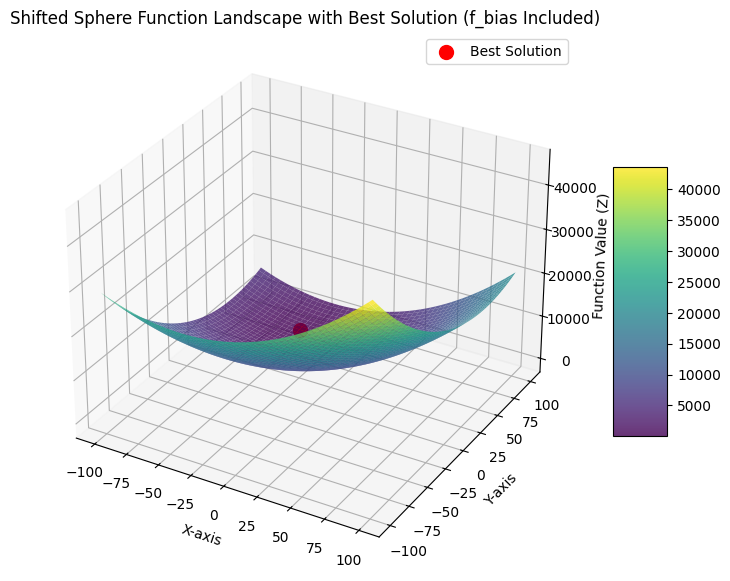

8
best 6559.712934963611
Iteration 1/50: Best Value = 31365.297759866695
Iteration 2/50: Best Value = 15642.940308604944
Iteration 3/50: Best Value = 15642.940308604944
Iteration 4/50: Best Value = 15642.940308604944
Iteration 5/50: Best Value = 15642.940308604944
Iteration 6/50: Best Value = 15642.940308604944
Iteration 7/50: Best Value = 15642.940308604944
Iteration 8/50: Best Value = 15642.940308604944
Iteration 9/50: Best Value = 15642.940308604944
Iteration 10/50: Best Value = 15642.940308604944
Iteration 11/50: Best Value = 15642.940308604944
Iteration 12/50: Best Value = 15642.940308604944
Iteration 13/50: Best Value = 15642.940308604944
Iteration 14/50: Best Value = 15642.940308604944
Iteration 15/50: Best Value = 13503.998016680795
Iteration 16/50: Best Value = 13503.998016680795
Iteration 17/50: Best Value = 13503.998016680795
Iteration 18/50: Best Value = 13503.998016680795
Iteration 19/50: Best Value = 13503.998016680795
Iteration 20/50: Best Value = 13503.998016680795
Iter

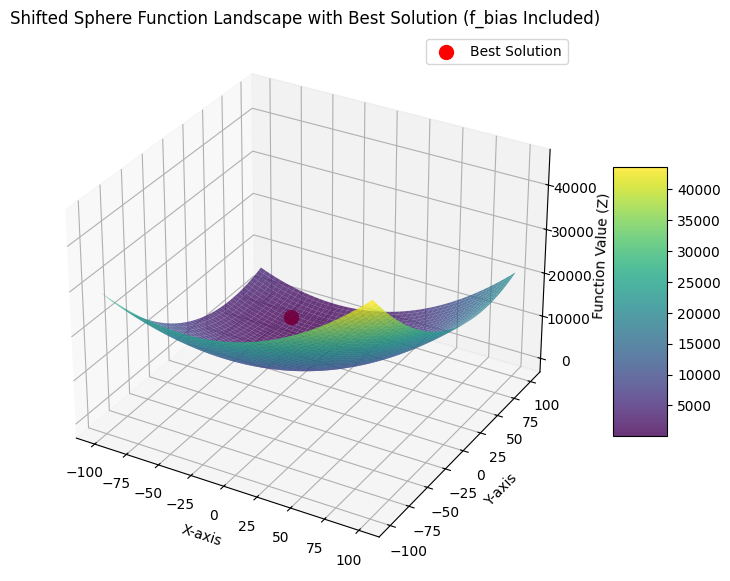

9
best 3657.918243780218
Iteration 1/50: Best Value = 13759.55100164789
Iteration 2/50: Best Value = 13759.55100164789
Iteration 3/50: Best Value = 13759.55100164789
Iteration 4/50: Best Value = 13759.55100164789
Iteration 5/50: Best Value = 13759.55100164789
Iteration 6/50: Best Value = 13759.55100164789
Iteration 7/50: Best Value = 13759.55100164789
Iteration 8/50: Best Value = 13759.55100164789
Iteration 9/50: Best Value = 13759.55100164789
Iteration 10/50: Best Value = 13759.55100164789
Iteration 11/50: Best Value = 13759.55100164789
Iteration 12/50: Best Value = 13759.55100164789
Iteration 13/50: Best Value = 13759.55100164789
Iteration 14/50: Best Value = 13759.55100164789
Iteration 15/50: Best Value = 13759.55100164789
Iteration 16/50: Best Value = 12193.268101778534
Iteration 17/50: Best Value = 12193.268101778534
Iteration 18/50: Best Value = 12193.268101778534
Iteration 19/50: Best Value = 12193.268101778534
Iteration 20/50: Best Value = 12193.268101778534
Iteration 21/50: Be

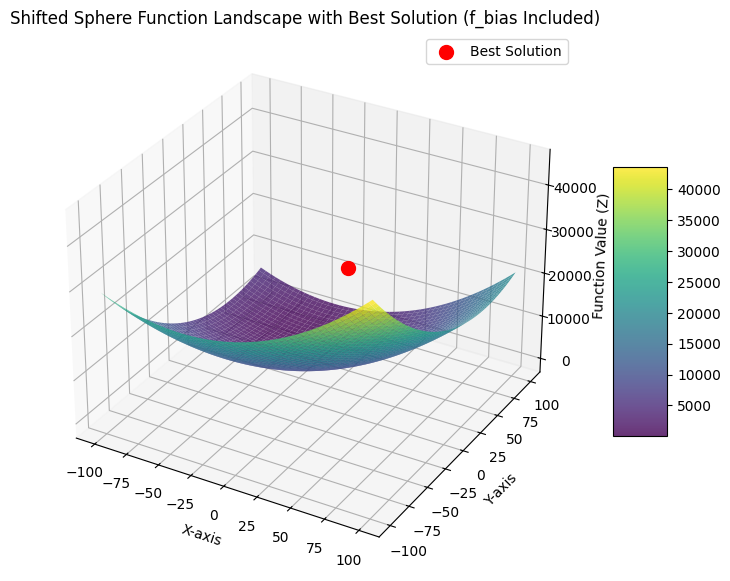

10
best 12193.268101778534
Iteration 1/50: Best Value = 27104.14131489323
Iteration 2/50: Best Value = 21889.656295747616
Iteration 3/50: Best Value = 21889.656295747616
Iteration 4/50: Best Value = 21889.656295747616
Iteration 5/50: Best Value = 21889.656295747616
Iteration 6/50: Best Value = 21889.656295747616
Iteration 7/50: Best Value = 21889.656295747616
Iteration 8/50: Best Value = 21889.656295747616
Iteration 9/50: Best Value = 21889.656295747616
Iteration 10/50: Best Value = 17084.551040262824
Iteration 11/50: Best Value = 17084.551040262824
Iteration 12/50: Best Value = 17084.551040262824
Iteration 13/50: Best Value = 17084.551040262824
Iteration 14/50: Best Value = 17084.551040262824
Iteration 15/50: Best Value = 17084.551040262824
Iteration 16/50: Best Value = 17084.551040262824
Iteration 17/50: Best Value = 17084.551040262824
Iteration 18/50: Best Value = 17084.551040262824
Iteration 19/50: Best Value = 17084.551040262824
Iteration 20/50: Best Value = 17084.551040262824
Ite

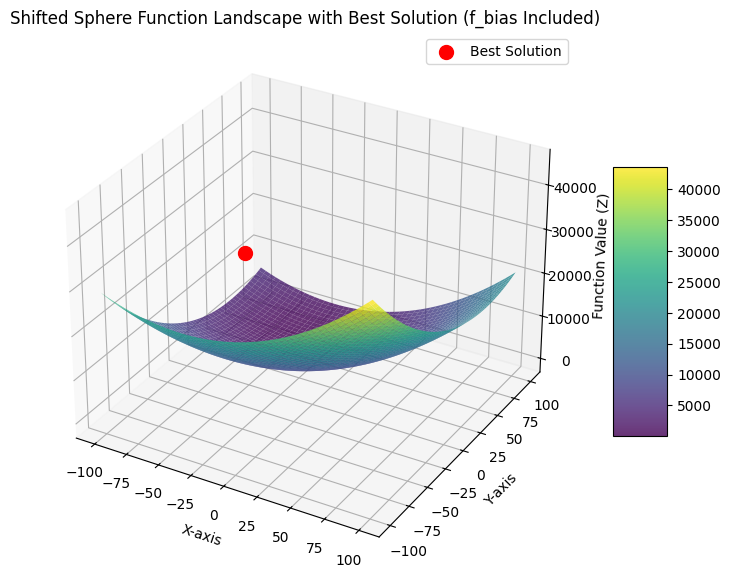

11
best 17084.551040262824
Iteration 1/50: Best Value = 28475.307477849234
Iteration 2/50: Best Value = 15118.547817742783
Iteration 3/50: Best Value = 15118.547817742783
Iteration 4/50: Best Value = 15118.547817742783
Iteration 5/50: Best Value = 15118.547817742783
Iteration 6/50: Best Value = 15118.547817742783
Iteration 7/50: Best Value = 15118.547817742783
Iteration 8/50: Best Value = 15118.547817742783
Iteration 9/50: Best Value = 15118.547817742783
Iteration 10/50: Best Value = 15118.547817742783
Iteration 11/50: Best Value = 15118.547817742783
Iteration 12/50: Best Value = 15118.547817742783
Iteration 13/50: Best Value = 15118.547817742783
Iteration 14/50: Best Value = 15118.547817742783
Iteration 15/50: Best Value = 15118.547817742783
Iteration 16/50: Best Value = 15118.547817742783
Iteration 17/50: Best Value = 15118.547817742783
Iteration 18/50: Best Value = 15118.547817742783
Iteration 19/50: Best Value = 15118.547817742783
Iteration 20/50: Best Value = 15118.547817742783
It

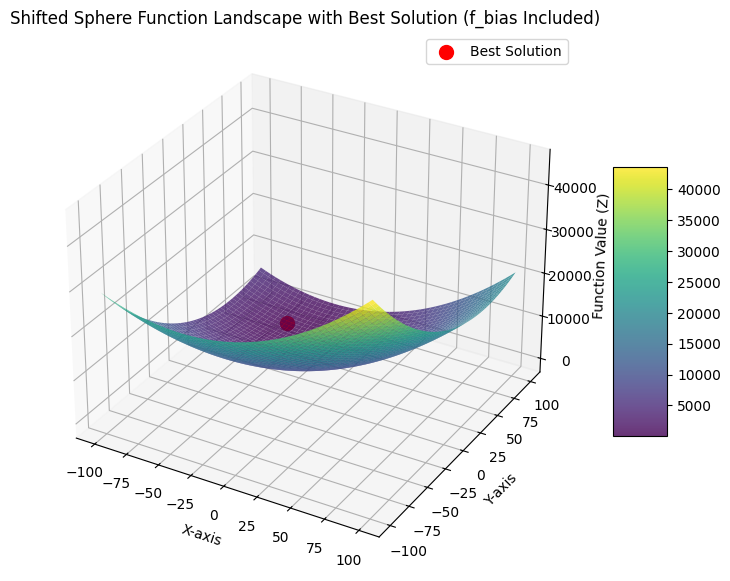

12
best 10407.424845114641
Iteration 1/50: Best Value = 23655.69285108286
Iteration 2/50: Best Value = 23655.69285108286
Iteration 3/50: Best Value = 21595.061918878542
Iteration 4/50: Best Value = 21595.061918878542
Iteration 5/50: Best Value = 21595.061918878542
Iteration 6/50: Best Value = 20201.861842696297
Iteration 7/50: Best Value = 10897.943208947727
Iteration 8/50: Best Value = 10897.943208947727
Iteration 9/50: Best Value = 10897.943208947727
Iteration 10/50: Best Value = 10897.943208947727
Iteration 11/50: Best Value = 10897.943208947727
Iteration 12/50: Best Value = 10897.943208947727
Iteration 13/50: Best Value = 10897.943208947727
Iteration 14/50: Best Value = 10897.943208947727
Iteration 15/50: Best Value = 10897.943208947727
Iteration 16/50: Best Value = 10897.943208947727
Iteration 17/50: Best Value = 10897.943208947727
Iteration 18/50: Best Value = 10897.943208947727
Iteration 19/50: Best Value = 10897.943208947727
Iteration 20/50: Best Value = 10897.943208947727
Iter

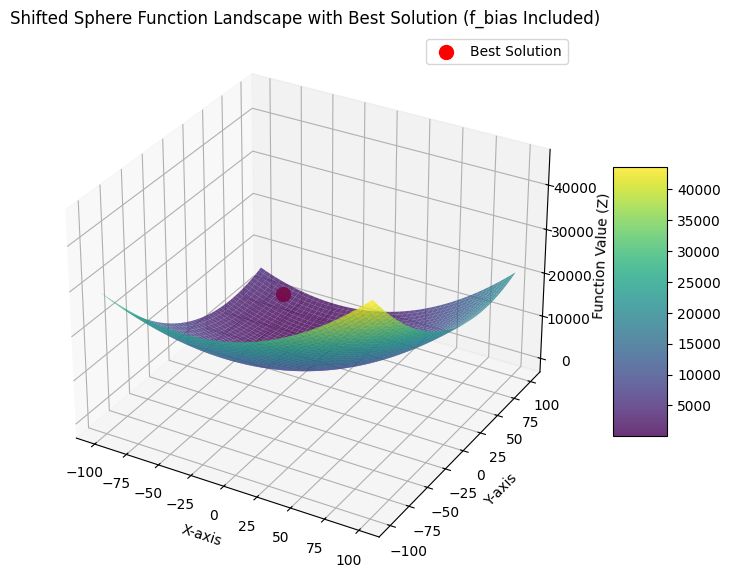

13
best 10215.32316737408
Iteration 1/50: Best Value = 18226.690159782356
Iteration 2/50: Best Value = 18226.690159782356
Iteration 3/50: Best Value = 18226.690159782356
Iteration 4/50: Best Value = 18226.690159782356
Iteration 5/50: Best Value = 18226.690159782356
Iteration 6/50: Best Value = 18226.690159782356
Iteration 7/50: Best Value = 18226.690159782356
Iteration 8/50: Best Value = 14506.751600659005
Iteration 9/50: Best Value = 14506.751600659005
Iteration 10/50: Best Value = 14506.751600659005
Iteration 11/50: Best Value = 14506.751600659005
Iteration 12/50: Best Value = 14506.751600659005
Iteration 13/50: Best Value = 14506.751600659005
Iteration 14/50: Best Value = 14506.751600659005
Iteration 15/50: Best Value = 14506.751600659005
Iteration 16/50: Best Value = 14506.751600659005
Iteration 17/50: Best Value = 14506.751600659005
Iteration 18/50: Best Value = 14506.751600659005
Iteration 19/50: Best Value = 14506.751600659005
Iteration 20/50: Best Value = 14506.751600659005
Ite

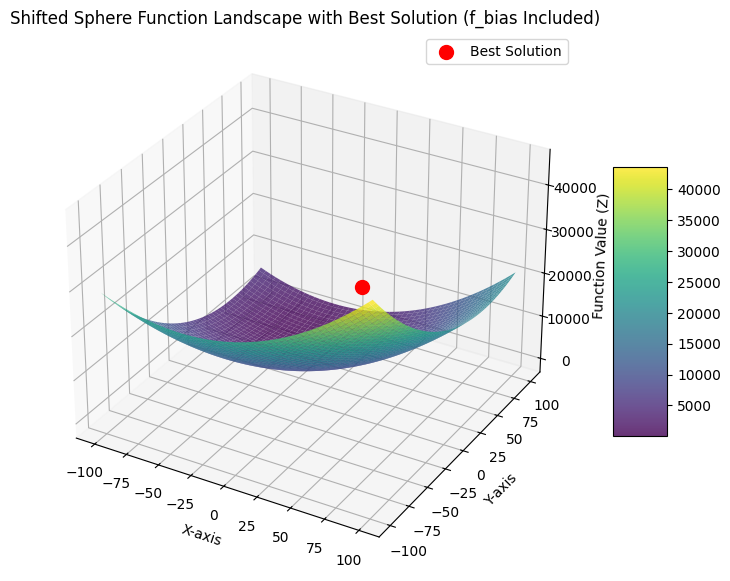

14
best 14037.656255123824


In [9]:
# Run Ant Colony Optimization on Sphere function for D = 10
best_solutions = []
for i in range(0, 15):
    aco_solution = run_aco_sphere(10)
    print(i)
    print('best',aco_solution['best_value'])
    best_solutions.append(aco_solution)

In [10]:
# Get Average, Min, Max of Best values for D = 10
best_values = [solution['best_value'] for solution in best_solutions]

average = np.average(best_values)
min = np.min(best_values)
max = np.max(best_values)
standard_deviation = np.std(best_values)

print("Average: ", average)
print("Min: ", min)
print("Max: ", max)
print("Standard Deviation", standard_deviation)

Average:  10637.76076864404
Min:  3657.918243780218
Max:  17084.551040262824
Standard Deviation 3541.7517865625


In [11]:
def run_aco_rastrigin(dimension):
    """
    Run ACO optimization for the Shifted Rastrigin function with dynamic dimensions.
    :param dimension: Number of dimensions (e.g., 2, 10, etc.)
    """
    # Load Data for rastrigin function
    data = sio.loadmat('./matlab/rastrigin_func_data.mat')
    o = data['o'][0]  # Extracting 'o' values from the loaded MATLAB file

    bounds = [(-5.12, 5.12) for _ in range(dimension)]  # Bounds for each dimension
    o_dynamic = o[:dimension]  # Use first 'dimension' values of o for shifting

    # Set ACO parameters
    num_ants = 20
    num_iterations = 50

    # Instantiate and run the optimizer
    aco = AntColonyOptimizer(num_ants, num_iterations, bounds)
    best_solution, best_value = aco.optimize(shifted_rastrigin, o_dynamic)

    print("\n=== Optimization Results ===")
    print("Best Solution:", best_solution)
    print("Best Value:", best_value)

    # Visualization only for 2D
    if dimension == 2:
        x = np.linspace(bounds[0][0], bounds[0][1], 200)
        y = np.linspace(bounds[1][0], bounds[1][1], 200)
        X, Y = np.meshgrid(x, y)
        Z = np.array([[shifted_rastrigin(np.array([X[i, j], Y[i, j]]), o_dynamic) for j in range(X.shape[1])] for i in range(X.shape[0])])

        fig = plt.figure(figsize=(10, 7))
        ax = fig.add_subplot(111, projection='3d')

        # Plot the surface
        surf = ax.plot_surface(X, Y, Z, cmap='viridis', alpha=0.8)
        fig.colorbar(surf, ax=ax, shrink=0.5, aspect=5)

        # Plot the best solution
        ax.scatter(best_solution[0], best_solution[1], best_value, color='red', s=100, label='Best Solution')

        # Customize the plot
        ax.set_title("Shifted Rastrigin Function Landscape with Best Solution")
        ax.set_xlabel('X-axis')
        ax.set_ylabel('Y-axis')
        ax.set_zlabel('Function Value (Z)')
        ax.legend()

        plt.show()
    return {"best_solution":best_solution, "best_value":best_value}

Iteration 1/50: Best Value = 9.922395754701732
Iteration 2/50: Best Value = 9.922395754701732
Iteration 3/50: Best Value = 8.119550991280132
Iteration 4/50: Best Value = 8.119550991280132
Iteration 5/50: Best Value = 8.119550991280132
Iteration 6/50: Best Value = 8.119550991280132
Iteration 7/50: Best Value = 7.10755220336522
Iteration 8/50: Best Value = 7.10755220336522
Iteration 9/50: Best Value = 4.24207940340753
Iteration 10/50: Best Value = 4.24207940340753
Iteration 11/50: Best Value = 4.24207940340753
Iteration 12/50: Best Value = 4.24207940340753
Iteration 13/50: Best Value = 4.24207940340753
Iteration 14/50: Best Value = 4.24207940340753
Iteration 15/50: Best Value = 4.24207940340753
Iteration 16/50: Best Value = 4.24207940340753
Iteration 17/50: Best Value = 4.24207940340753
Iteration 18/50: Best Value = 4.24207940340753
Iteration 19/50: Best Value = 4.24207940340753
Iteration 20/50: Best Value = 4.24207940340753
Iteration 21/50: Best Value = 4.24207940340753
Iteration 22/50:

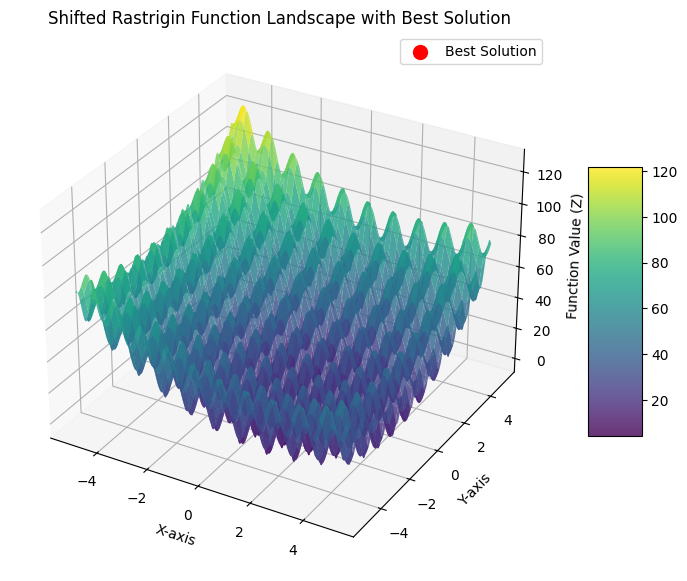

0
best 3.236513407644537
Iteration 1/50: Best Value = 11.368109138285853
Iteration 2/50: Best Value = 3.3007308858600126
Iteration 3/50: Best Value = 3.3007308858600126
Iteration 4/50: Best Value = 3.3007308858600126
Iteration 5/50: Best Value = 3.3007308858600126
Iteration 6/50: Best Value = 1.0204447369665388
Iteration 7/50: Best Value = 1.0204447369665388
Iteration 8/50: Best Value = 1.0204447369665388
Iteration 9/50: Best Value = 1.0204447369665388
Iteration 10/50: Best Value = 1.0204447369665388
Iteration 11/50: Best Value = 1.0204447369665388
Iteration 12/50: Best Value = 1.0204447369665388
Iteration 13/50: Best Value = 1.0204447369665388
Iteration 14/50: Best Value = 1.0204447369665388
Iteration 15/50: Best Value = 1.0204447369665388
Iteration 16/50: Best Value = 1.0204447369665388
Iteration 17/50: Best Value = 1.0204447369665388
Iteration 18/50: Best Value = 1.0204447369665388
Iteration 19/50: Best Value = 1.0204447369665388
Iteration 20/50: Best Value = 1.0204447369665388
Iter

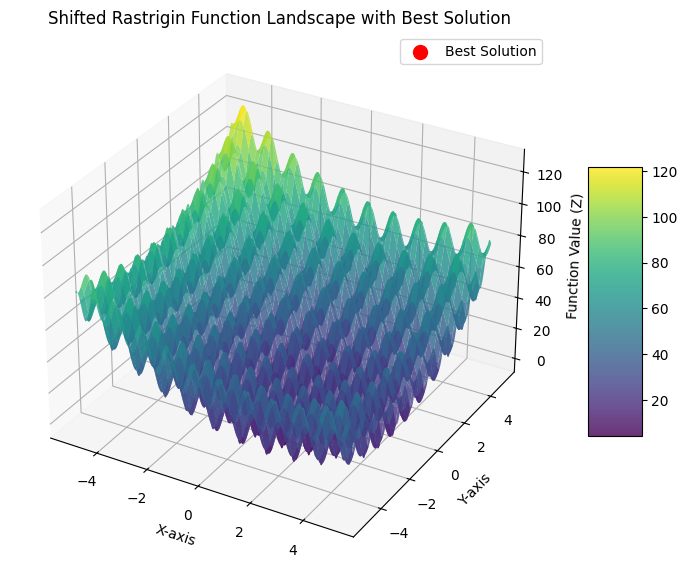

1
best 1.0204447369665388
Iteration 1/50: Best Value = 5.884322378887848
Iteration 2/50: Best Value = 5.884322378887848
Iteration 3/50: Best Value = 5.670104534805347
Iteration 4/50: Best Value = 5.670104534805347
Iteration 5/50: Best Value = 5.670104534805347
Iteration 6/50: Best Value = 5.670104534805347
Iteration 7/50: Best Value = 5.670104534805347
Iteration 8/50: Best Value = 5.670104534805347
Iteration 9/50: Best Value = 5.670104534805347
Iteration 10/50: Best Value = 5.236804020317184
Iteration 11/50: Best Value = 5.236804020317184
Iteration 12/50: Best Value = 1.2730218000299942
Iteration 13/50: Best Value = 1.2730218000299942
Iteration 14/50: Best Value = 1.2730218000299942
Iteration 15/50: Best Value = 1.2730218000299942
Iteration 16/50: Best Value = 1.2730218000299942
Iteration 17/50: Best Value = 1.2730218000299942
Iteration 18/50: Best Value = 1.2730218000299942
Iteration 19/50: Best Value = 1.2730218000299942
Iteration 20/50: Best Value = 1.2730218000299942
Iteration 21/5

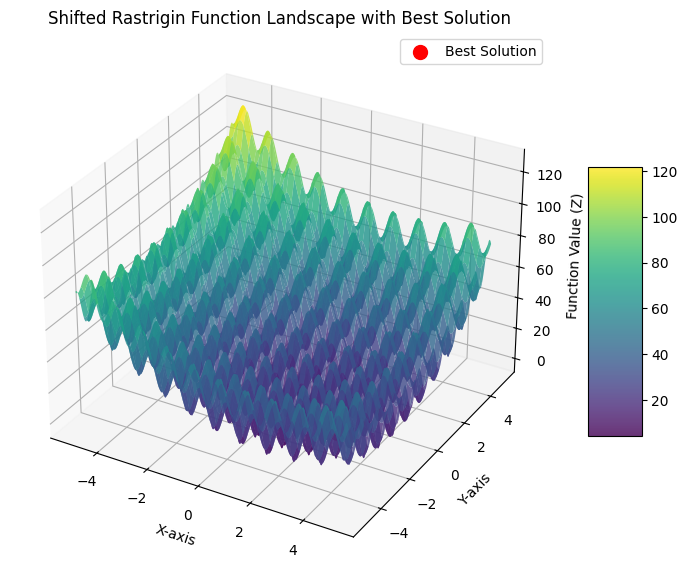

2
best 1.2730218000299942
Iteration 1/50: Best Value = 10.101336369298078
Iteration 2/50: Best Value = 10.101336369298078
Iteration 3/50: Best Value = 2.0495281393798095
Iteration 4/50: Best Value = 2.0495281393798095
Iteration 5/50: Best Value = 2.0495281393798095
Iteration 6/50: Best Value = 2.0495281393798095
Iteration 7/50: Best Value = 2.0495281393798095
Iteration 8/50: Best Value = 2.0495281393798095
Iteration 9/50: Best Value = 2.0495281393798095
Iteration 10/50: Best Value = 2.0495281393798095
Iteration 11/50: Best Value = 2.0495281393798095
Iteration 12/50: Best Value = 2.0495281393798095
Iteration 13/50: Best Value = 2.0495281393798095
Iteration 14/50: Best Value = 2.0495281393798095
Iteration 15/50: Best Value = 2.0495281393798095
Iteration 16/50: Best Value = 2.0495281393798095
Iteration 17/50: Best Value = 2.0495281393798095
Iteration 18/50: Best Value = 2.0495281393798095
Iteration 19/50: Best Value = 2.0495281393798095
Iteration 20/50: Best Value = 2.0495281393798095
Ite

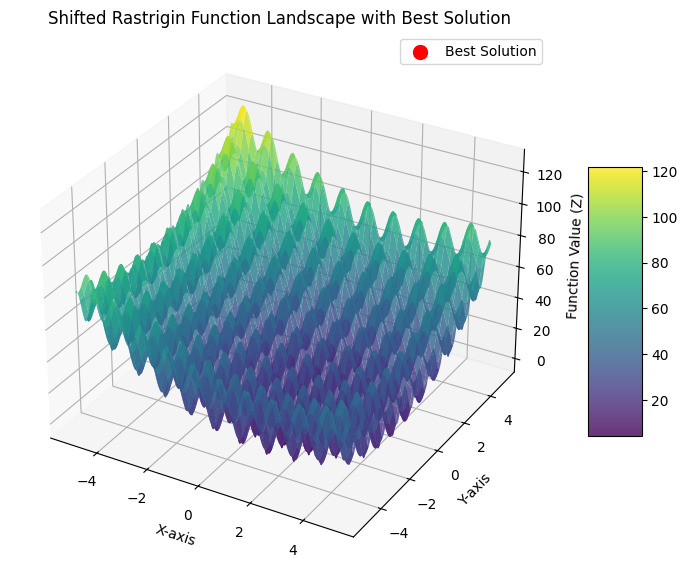

3
best 2.0495281393798095
Iteration 1/50: Best Value = 1.9472588029486033
Iteration 2/50: Best Value = 1.9472588029486033
Iteration 3/50: Best Value = 1.9472588029486033
Iteration 4/50: Best Value = 1.9472588029486033
Iteration 5/50: Best Value = 1.9472588029486033
Iteration 6/50: Best Value = 1.9472588029486033
Iteration 7/50: Best Value = 1.9472588029486033
Iteration 8/50: Best Value = 1.9472588029486033
Iteration 9/50: Best Value = 1.9472588029486033
Iteration 10/50: Best Value = 1.9472588029486033
Iteration 11/50: Best Value = 1.9472588029486033
Iteration 12/50: Best Value = 1.9472588029486033
Iteration 13/50: Best Value = 1.9472588029486033
Iteration 14/50: Best Value = 1.9472588029486033
Iteration 15/50: Best Value = 1.6326662832054524
Iteration 16/50: Best Value = 1.6326662832054524
Iteration 17/50: Best Value = 1.6326662832054524
Iteration 18/50: Best Value = 1.6326662832054524
Iteration 19/50: Best Value = 1.6326662832054524
Iteration 20/50: Best Value = 1.6326662832054524
Ite

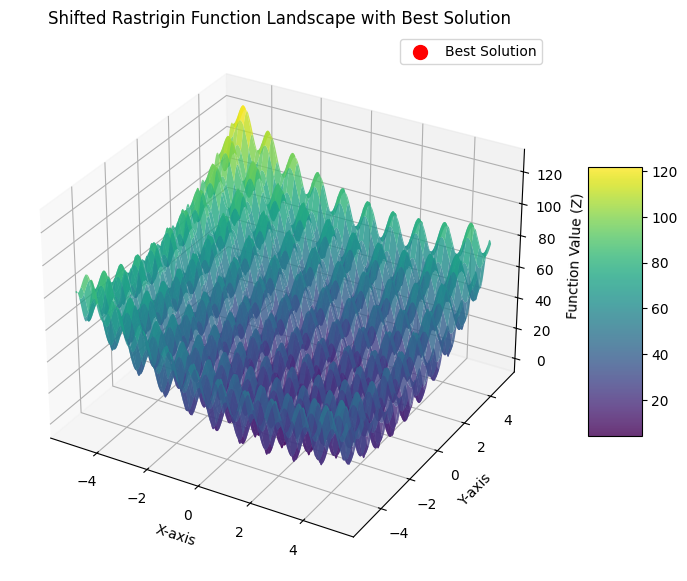

4
best 0.8882371614552831
Iteration 1/50: Best Value = 10.4980926919337
Iteration 2/50: Best Value = 10.4980926919337
Iteration 3/50: Best Value = 10.4980926919337
Iteration 4/50: Best Value = 10.4980926919337
Iteration 5/50: Best Value = 10.4980926919337
Iteration 6/50: Best Value = 10.4980926919337
Iteration 7/50: Best Value = 10.4980926919337
Iteration 8/50: Best Value = 7.26350197113935
Iteration 9/50: Best Value = 7.220546128217096
Iteration 10/50: Best Value = 3.838383491444443
Iteration 11/50: Best Value = 3.838383491444443
Iteration 12/50: Best Value = 3.1785368181868314
Iteration 13/50: Best Value = 3.1785368181868314
Iteration 14/50: Best Value = 3.1785368181868314
Iteration 15/50: Best Value = 3.1785368181868314
Iteration 16/50: Best Value = 3.1785368181868314
Iteration 17/50: Best Value = 3.1785368181868314
Iteration 18/50: Best Value = 3.1785368181868314
Iteration 19/50: Best Value = 3.1785368181868314
Iteration 20/50: Best Value = 3.1785368181868314
Iteration 21/50: Best 

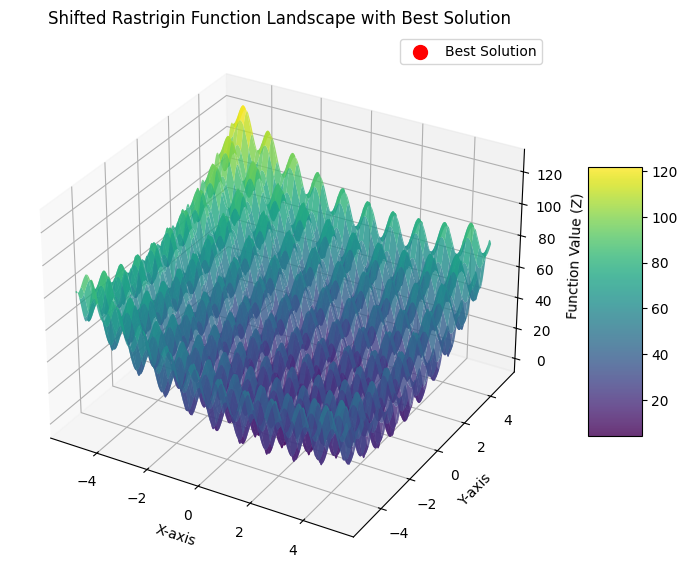

5
best 2.740724939956685
Iteration 1/50: Best Value = 4.183888999011424
Iteration 2/50: Best Value = 1.5937118763885962
Iteration 3/50: Best Value = 1.5937118763885962
Iteration 4/50: Best Value = 1.5937118763885962
Iteration 5/50: Best Value = 1.5937118763885962
Iteration 6/50: Best Value = 1.5937118763885962
Iteration 7/50: Best Value = 1.5937118763885962
Iteration 8/50: Best Value = 1.5937118763885962
Iteration 9/50: Best Value = 1.5937118763885962
Iteration 10/50: Best Value = 1.5937118763885962
Iteration 11/50: Best Value = 1.5937118763885962
Iteration 12/50: Best Value = 1.5937118763885962
Iteration 13/50: Best Value = 1.5937118763885962
Iteration 14/50: Best Value = 1.5937118763885962
Iteration 15/50: Best Value = 1.5937118763885962
Iteration 16/50: Best Value = 1.5937118763885962
Iteration 17/50: Best Value = 1.5937118763885962
Iteration 18/50: Best Value = 1.5937118763885962
Iteration 19/50: Best Value = 1.5937118763885962
Iteration 20/50: Best Value = 1.5937118763885962
Itera

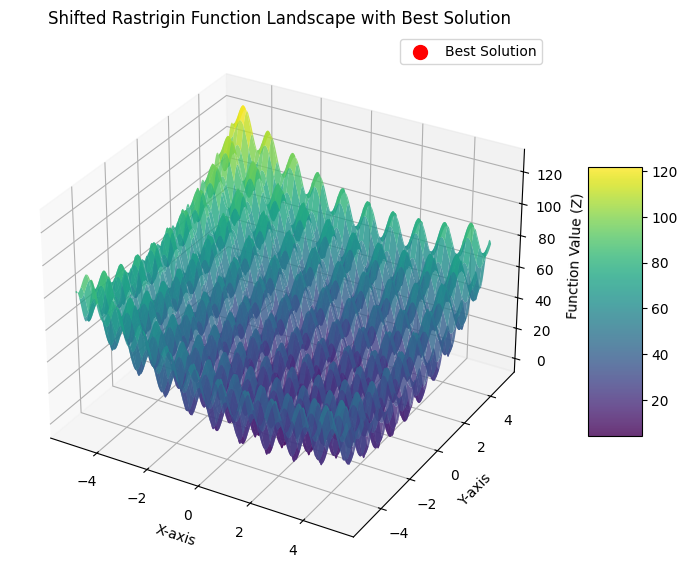

6
best 1.5937118763885962
Iteration 1/50: Best Value = 7.990125508052916
Iteration 2/50: Best Value = 4.56458104795248
Iteration 3/50: Best Value = 4.56458104795248
Iteration 4/50: Best Value = 4.56458104795248
Iteration 5/50: Best Value = 4.56458104795248
Iteration 6/50: Best Value = 4.56458104795248
Iteration 7/50: Best Value = 4.56458104795248
Iteration 8/50: Best Value = 4.56458104795248
Iteration 9/50: Best Value = 4.56458104795248
Iteration 10/50: Best Value = 4.56458104795248
Iteration 11/50: Best Value = 4.56458104795248
Iteration 12/50: Best Value = 4.56458104795248
Iteration 13/50: Best Value = 4.56458104795248
Iteration 14/50: Best Value = 4.56458104795248
Iteration 15/50: Best Value = 2.419748588906671
Iteration 16/50: Best Value = 2.419748588906671
Iteration 17/50: Best Value = 2.419748588906671
Iteration 18/50: Best Value = 2.419748588906671
Iteration 19/50: Best Value = 2.419748588906671
Iteration 20/50: Best Value = 2.419748588906671
Iteration 21/50: Best Value = 2.4197

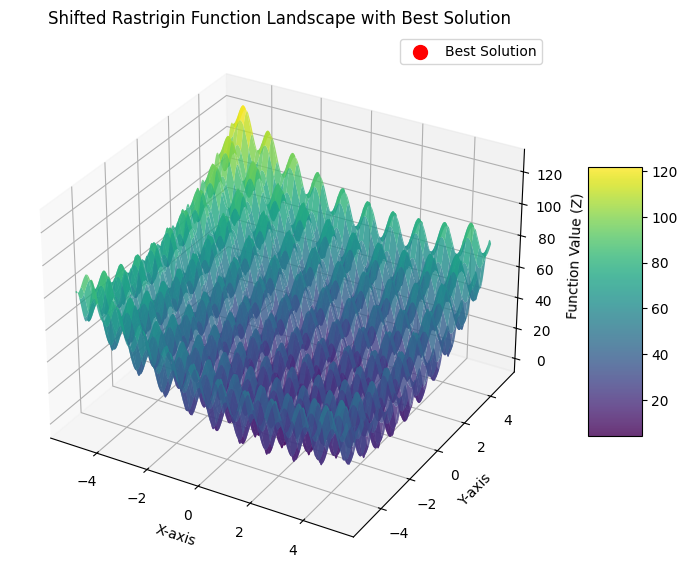

7
best 2.214992452956146
Iteration 1/50: Best Value = 8.437922666525944
Iteration 2/50: Best Value = 8.437922666525944
Iteration 3/50: Best Value = 8.437922666525944
Iteration 4/50: Best Value = 8.437922666525944
Iteration 5/50: Best Value = 8.437922666525944
Iteration 6/50: Best Value = 8.437922666525944
Iteration 7/50: Best Value = 4.748994802124308
Iteration 8/50: Best Value = 4.748994802124308
Iteration 9/50: Best Value = 4.748994802124308
Iteration 10/50: Best Value = 4.748994802124308
Iteration 11/50: Best Value = 4.748994802124308
Iteration 12/50: Best Value = 4.748994802124308
Iteration 13/50: Best Value = 4.748994802124308
Iteration 14/50: Best Value = 4.748994802124308
Iteration 15/50: Best Value = 4.748994802124308
Iteration 16/50: Best Value = 4.748994802124308
Iteration 17/50: Best Value = 4.748994802124308
Iteration 18/50: Best Value = 4.748994802124308
Iteration 19/50: Best Value = 4.748994802124308
Iteration 20/50: Best Value = 4.748994802124308
Iteration 21/50: Best Va

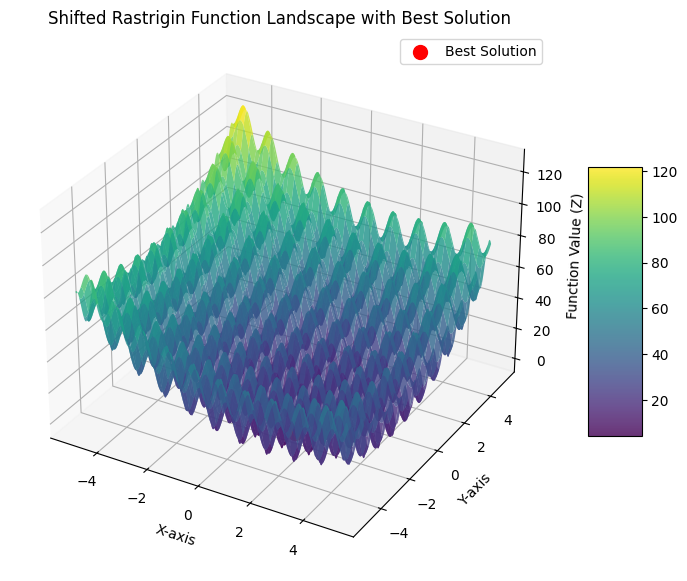

8
best 4.15001378258205
Iteration 1/50: Best Value = 12.639154974262363
Iteration 2/50: Best Value = 7.442712151741922
Iteration 3/50: Best Value = 1.7053401522702636
Iteration 4/50: Best Value = 1.7053401522702636
Iteration 5/50: Best Value = 1.7053401522702636
Iteration 6/50: Best Value = 1.7053401522702636
Iteration 7/50: Best Value = 1.7053401522702636
Iteration 8/50: Best Value = 1.7053401522702636
Iteration 9/50: Best Value = 1.7053401522702636
Iteration 10/50: Best Value = 1.7053401522702636
Iteration 11/50: Best Value = 1.7053401522702636
Iteration 12/50: Best Value = 1.7053401522702636
Iteration 13/50: Best Value = 1.7053401522702636
Iteration 14/50: Best Value = 1.7053401522702636
Iteration 15/50: Best Value = 1.7053401522702636
Iteration 16/50: Best Value = 1.7053401522702636
Iteration 17/50: Best Value = 1.7053401522702636
Iteration 18/50: Best Value = 1.7053401522702636
Iteration 19/50: Best Value = 1.7053401522702636
Iteration 20/50: Best Value = 1.7053401522702636
Iterat

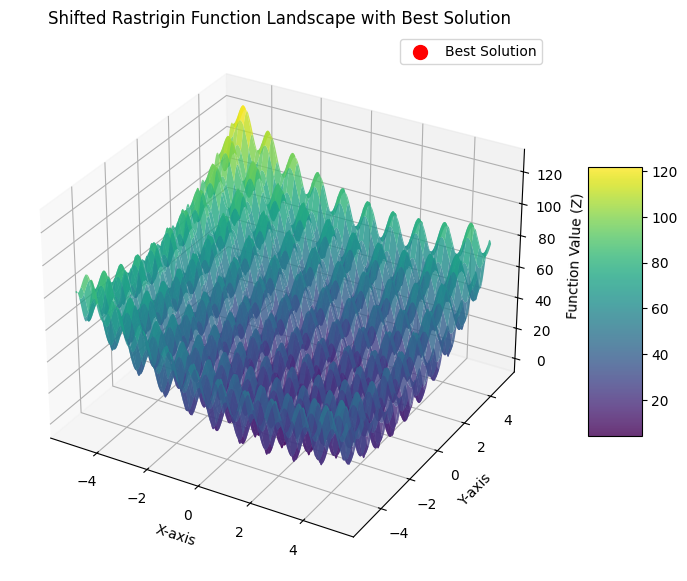

9
best 0.7159644832291221
Iteration 1/50: Best Value = 18.469333333772052
Iteration 2/50: Best Value = 9.958854118357738
Iteration 3/50: Best Value = 4.511133083916178
Iteration 4/50: Best Value = 4.511133083916178
Iteration 5/50: Best Value = 4.511133083916178
Iteration 6/50: Best Value = 4.511133083916178
Iteration 7/50: Best Value = 1.7067842818585959
Iteration 8/50: Best Value = 1.7067842818585959
Iteration 9/50: Best Value = 1.7067842818585959
Iteration 10/50: Best Value = 1.7067842818585959
Iteration 11/50: Best Value = 1.7067842818585959
Iteration 12/50: Best Value = 1.7067842818585959
Iteration 13/50: Best Value = 1.7067842818585959
Iteration 14/50: Best Value = 1.7067842818585959
Iteration 15/50: Best Value = 1.7067842818585959
Iteration 16/50: Best Value = 1.7067842818585959
Iteration 17/50: Best Value = 1.7067842818585959
Iteration 18/50: Best Value = 1.7067842818585959
Iteration 19/50: Best Value = 1.7067842818585959
Iteration 20/50: Best Value = 1.7067842818585959
Iteratio

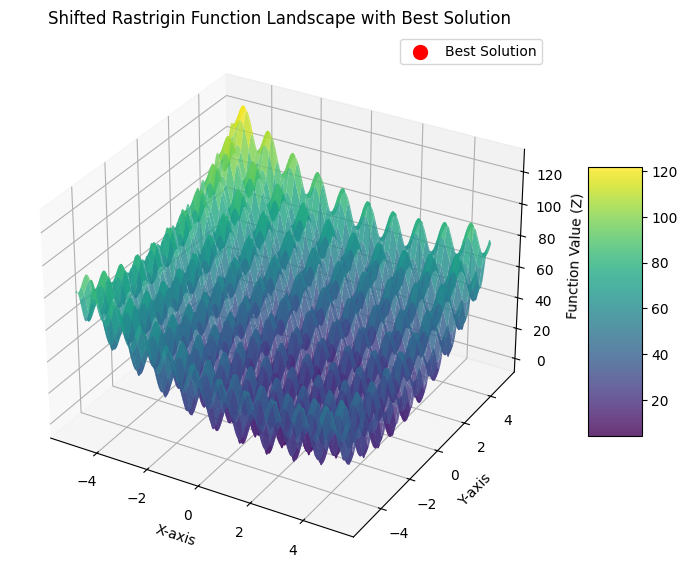

10
best 1.7067842818585959
Iteration 1/50: Best Value = 5.002120032634496
Iteration 2/50: Best Value = 4.153168161368038
Iteration 3/50: Best Value = 4.153168161368038
Iteration 4/50: Best Value = 4.153168161368038
Iteration 5/50: Best Value = 4.153168161368038
Iteration 6/50: Best Value = 4.153168161368038
Iteration 7/50: Best Value = 4.153168161368038
Iteration 8/50: Best Value = 4.153168161368038
Iteration 9/50: Best Value = 4.153168161368038
Iteration 10/50: Best Value = 2.1588443667415227
Iteration 11/50: Best Value = 2.1588443667415227
Iteration 12/50: Best Value = 2.1588443667415227
Iteration 13/50: Best Value = 2.1588443667415227
Iteration 14/50: Best Value = 2.1588443667415227
Iteration 15/50: Best Value = 2.1588443667415227
Iteration 16/50: Best Value = 2.1588443667415227
Iteration 17/50: Best Value = 2.1588443667415227
Iteration 18/50: Best Value = 2.1588443667415227
Iteration 19/50: Best Value = 2.1588443667415227
Iteration 20/50: Best Value = 2.1588443667415227
Iteration 2

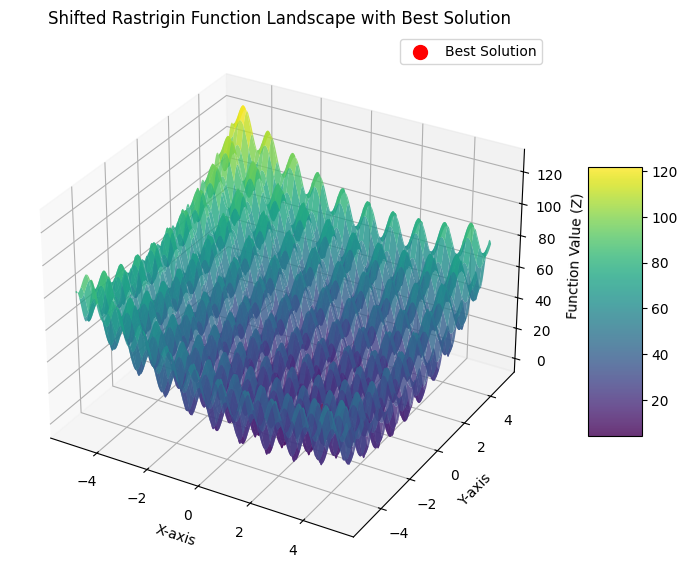

11
best 1.7970919264467256
Iteration 1/50: Best Value = 10.988600707501654
Iteration 2/50: Best Value = 10.988600707501654
Iteration 3/50: Best Value = 10.988600707501654
Iteration 4/50: Best Value = 10.988600707501654
Iteration 5/50: Best Value = 10.988600707501654
Iteration 6/50: Best Value = 10.988600707501654
Iteration 7/50: Best Value = 10.988600707501654
Iteration 8/50: Best Value = 10.988600707501654
Iteration 9/50: Best Value = 10.988600707501654
Iteration 10/50: Best Value = 10.988600707501654
Iteration 11/50: Best Value = 10.988600707501654
Iteration 12/50: Best Value = 9.287550246766386
Iteration 13/50: Best Value = 9.287550246766386
Iteration 14/50: Best Value = 9.287550246766386
Iteration 15/50: Best Value = 9.287550246766386
Iteration 16/50: Best Value = 5.394684551122992
Iteration 17/50: Best Value = 5.394684551122992
Iteration 18/50: Best Value = 5.394684551122992
Iteration 19/50: Best Value = 5.394684551122992
Iteration 20/50: Best Value = 1.801976681481328
Iteration 2

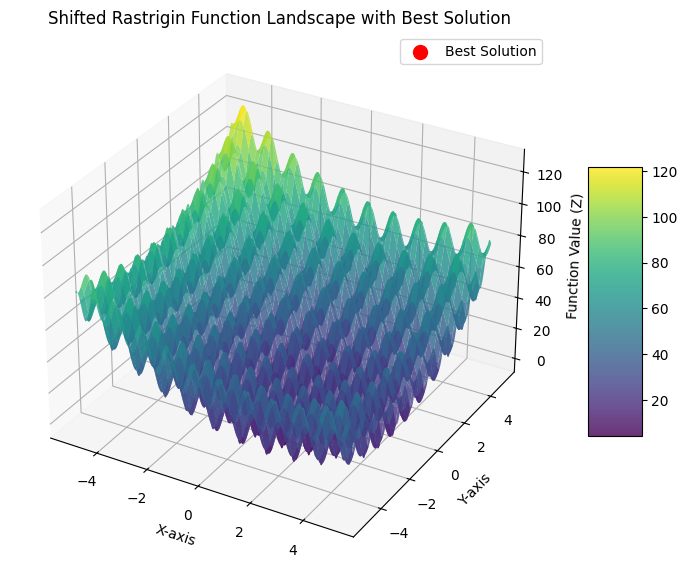

12
best 1.035082872571767
Iteration 1/50: Best Value = 16.405011079650656
Iteration 2/50: Best Value = 5.177977029578823
Iteration 3/50: Best Value = 5.177977029578823
Iteration 4/50: Best Value = 5.177977029578823
Iteration 5/50: Best Value = 5.177977029578823
Iteration 6/50: Best Value = 3.254303101351816
Iteration 7/50: Best Value = 3.254303101351816
Iteration 8/50: Best Value = 3.254303101351816
Iteration 9/50: Best Value = 2.7805155133123236
Iteration 10/50: Best Value = 2.7805155133123236
Iteration 11/50: Best Value = 2.7805155133123236
Iteration 12/50: Best Value = 2.7805155133123236
Iteration 13/50: Best Value = 2.7805155133123236
Iteration 14/50: Best Value = 2.7805155133123236
Iteration 15/50: Best Value = 2.7805155133123236
Iteration 16/50: Best Value = 2.7805155133123236
Iteration 17/50: Best Value = 2.7805155133123236
Iteration 18/50: Best Value = 2.7805155133123236
Iteration 19/50: Best Value = 2.7805155133123236
Iteration 20/50: Best Value = 2.7805155133123236
Iteration 

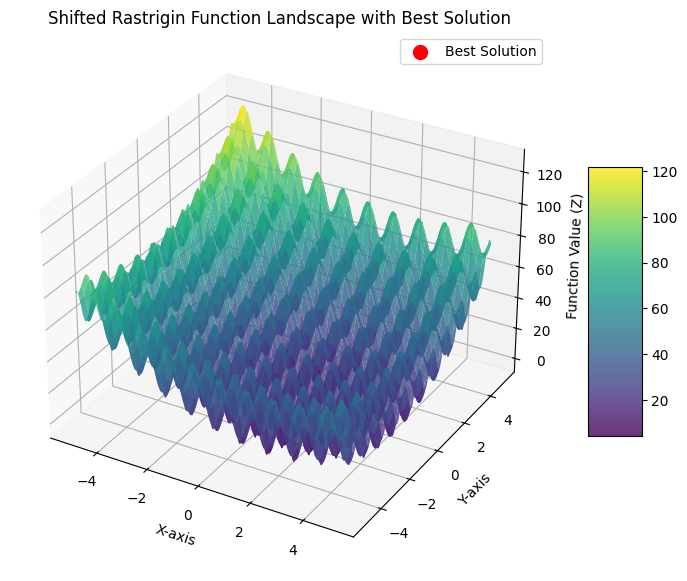

13
best 1.879194754983608
Iteration 1/50: Best Value = 8.286385730667124
Iteration 2/50: Best Value = 7.532528733287144
Iteration 3/50: Best Value = 5.016208857920375
Iteration 4/50: Best Value = 5.016208857920375
Iteration 5/50: Best Value = 5.016208857920375
Iteration 6/50: Best Value = 5.016208857920375
Iteration 7/50: Best Value = 5.016208857920375
Iteration 8/50: Best Value = 5.016208857920375
Iteration 9/50: Best Value = 5.016208857920375
Iteration 10/50: Best Value = 5.016208857920375
Iteration 11/50: Best Value = 5.016208857920375
Iteration 12/50: Best Value = 5.016208857920375
Iteration 13/50: Best Value = 5.016208857920375
Iteration 14/50: Best Value = 5.016208857920375
Iteration 15/50: Best Value = 5.016208857920375
Iteration 16/50: Best Value = 0.7870570790053897
Iteration 17/50: Best Value = 0.7870570790053897
Iteration 18/50: Best Value = 0.7870570790053897
Iteration 19/50: Best Value = 0.7870570790053897
Iteration 20/50: Best Value = 0.7870570790053897
Iteration 21/50: B

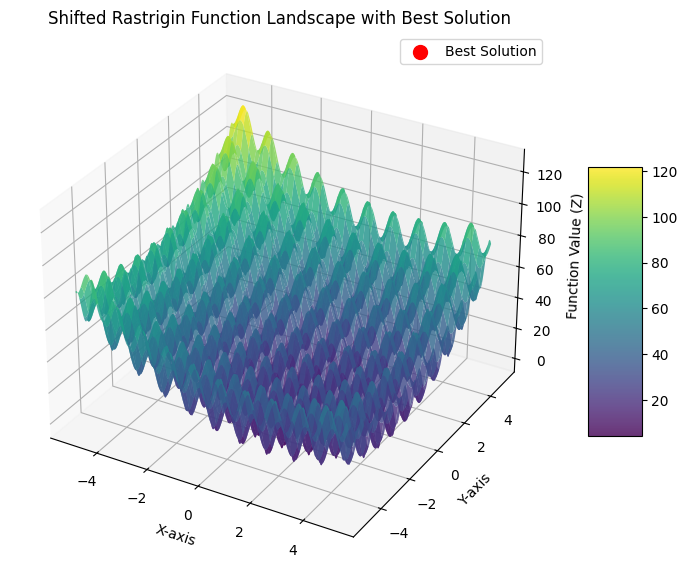

14
best 0.7870570790053897


In [12]:
# Run Ant Colony Optimization on Rastrigin function for D = 2
best_solutions = []
for i in range(0, 15):
    aco_solution = run_aco_rastrigin(2)
    print(i)
    print('best',aco_solution['best_value'])
    best_solutions.append(aco_solution)

In [13]:
# Get Average, Min, Max of Best values for D = 2
best_values = [solution['best_value'] for solution in best_solutions]

average = np.average(best_values)
min = np.min(best_values)
max = np.max(best_values)
standard_deviation = np.std(best_values)

print("Average: ", average)
print("Min: ", min)
print("Max: ", max)
print("Standard Deviation", standard_deviation)

Average:  1.8058909130303233
Min:  0.7159644832291221
Max:  4.15001378258205
Standard Deviation 0.9404110502951277


In [15]:
# Run Ant Colony Optimization on Rastrigin function for D = 10
best_solutions = []
for i in range(0, 15):
    aco_solution = run_aco_rastrigin(10)
    print(i)
    print('best',aco_solution['best_value'])
    best_solutions.append(aco_solution)

Iteration 1/50: Best Value = 139.7412808569341
Iteration 2/50: Best Value = 139.7412808569341
Iteration 3/50: Best Value = 130.14219536291048
Iteration 4/50: Best Value = 128.14308107262957
Iteration 5/50: Best Value = 128.14308107262957
Iteration 6/50: Best Value = 122.93530801445212
Iteration 7/50: Best Value = 122.93530801445212
Iteration 8/50: Best Value = 122.93530801445212
Iteration 9/50: Best Value = 105.39895465059554
Iteration 10/50: Best Value = 105.39895465059554
Iteration 11/50: Best Value = 105.39895465059554
Iteration 12/50: Best Value = 105.39895465059554
Iteration 13/50: Best Value = 105.39895465059554
Iteration 14/50: Best Value = 105.39895465059554
Iteration 15/50: Best Value = 105.39895465059554
Iteration 16/50: Best Value = 105.39895465059554
Iteration 17/50: Best Value = 105.39895465059554
Iteration 18/50: Best Value = 105.39895465059554
Iteration 19/50: Best Value = 105.39895465059554
Iteration 20/50: Best Value = 105.39895465059554
Iteration 21/50: Best Value = 1

In [16]:
# Get Average, Min, Max of Best values for D = 10
best_values = [solution['best_value'] for solution in best_solutions]

average = np.average(best_values)
min = np.min(best_values)
max = np.max(best_values)
standard_deviation = np.std(best_values)

print("Average: ", average)
print("Min: ", min)
print("Max: ", max)
print("Standard Deviation", standard_deviation)

Average:  95.38958341048381
Min:  69.5783782217848
Max:  119.57469454093405
Standard Deviation 14.236684941616465


In [17]:
# Define function to run PSO on Shifted Sphere function
def run_pso_sphere(dimension):
    """
    Runs PSO to optimize the Shifted Sphere Function and visualizes the result.
    :param dimension: Number of dimensions (e.g., 2, 10, etc.)
    """
    # Load Data for sphere function
    data = sio.loadmat('./matlab/sphere_func_data.mat')  # You need to provide this MATLAB file
    o = data['o'][0]  # Extracting 'o' values from the loaded MATLAB file

    # Set PSO parameters
    num_particles = 30
    num_iterations = 50
    bounds = [(-100, 100) for _ in range(dimension)]  # Bounds for Sphere function
    f_bias = 10  # Example bias value

    # Instantiate the optimizer
    pso = ParticleSwarmOptimizer(num_particles, num_iterations, bounds)

    # Run the optimization
    best_solution, best_value = pso.optimize(shifted_sphere, o[:dimension], f_bias)
    print("\n=== Optimization Results ===")
    print("Best Solution:", best_solution)
    print("Best Value:", best_value)

    # Visualization for 2D
   
    x = np.linspace(bounds[0][0], bounds[0][1], 200)
    y = np.linspace(bounds[1][0], bounds[1][1], 200)
    X, Y = np.meshgrid(x, y)
    Z = np.array([[shifted_sphere(np.array([X[i, j], Y[i, j]]), o[:2], f_bias) for j in range(X.shape[1])] for i in range(X.shape[0])])
    fig = plt.figure(figsize=(10, 7))
    ax = fig.add_subplot(111, projection='3d')
    # Plot the surface
    surf = ax.plot_surface(X, Y, Z, cmap='viridis', alpha=0.8)
    fig.colorbar(surf, ax=ax, shrink=0.5, aspect=5)
    # Plot the best solution
    ax.scatter(best_solution[0], best_solution[1], best_value, color='red', s=100, label='Best Solution')
    # Customize the plot
    ax.set_title("Shifted Sphere Function Landscape with Best Solution (f_bias Included)")
    ax.set_xlabel('X-axis')
    ax.set_ylabel('Y-axis')
    ax.set_zlabel('Function Value (Z)')
    ax.legend()
    plt.show()
    return {"best_solution":best_solution, "best_value":best_value}

In [19]:
def run_pso_rastrigin(dimensions):
    """
    Runs PSO to optimize the Shifted Rastrigin Function and visualizes the result.
    """
    # Set PSO parameters
    num_particles = 30
    num_iterations = 100
    bounds = [(-5.12, 5.12) for _ in range(dimensions)]  # Bounds for Rastrigin function
    f_bias = 10  # Bias value

    # Instantiate the optimizer
    pso = ParticleSwarmOptimizer(num_particles, num_iterations, bounds)

    # Load Data for rastrigin function
    data = sio.loadmat('./matlab/rastrigin_func_data.mat')
    o = data['o'][0]  # Extracting 'o' values from the loaded MATLAB file

    # Run the optimization
    best_solution, best_value = pso.optimize(shifted_rastrigin, o, f_bias)
    print("\n=== Optimization Results ===")
    print("Best Solution:", best_solution)
    print("Best Value:", best_value)

    # Visualization for 2D
    if dimensions == 2:
        x = np.linspace(bounds[0][0], bounds[0][1], 200)
        y = np.linspace(bounds[1][0], bounds[1][1], 200)
        X, Y = np.meshgrid(x, y)
        Z = np.array([
            [shifted_rastrigin(np.array([X[i, j], Y[i, j]]), o, f_bias) for j in range(X.shape[1])]
            for i in range(X.shape[0])
        ])

        # Recalculate Z-coordinate for the best solution
        best_solution_z = shifted_rastrigin(best_solution, o, f_bias)

        # Plot the surface
        fig = plt.figure(figsize=(10, 7))
        ax = fig.add_subplot(111, projection='3d')
        surf = ax.plot_surface(X, Y, Z, cmap='viridis', alpha=0.8)
        fig.colorbar(surf, ax=ax, shrink=0.5, aspect=5)

        # Plot the best solution as a red dot
        ax.scatter(
            best_solution[0], best_solution[1], best_solution_z,
            color='red', s=100, label='Best Solution'
        )

        # Customize the plot
        ax.set_title("Shifted Rastrigin Function Landscape with Best Solution")
        ax.set_xlabel('X-axis')
        ax.set_ylabel('Y-axis')
        ax.set_zlabel('Function Value (Z)')
        ax.legend()

        plt.show()
    else:
        print("Visualization is only available for 2 dimensions.")
    return {"best_solution":best_solution, "best_value":best_value}


Iteration 1/50: Global Best Value = 347.2165
Iteration 2/50: Global Best Value = 66.5930
Iteration 3/50: Global Best Value = 39.3573
Iteration 4/50: Global Best Value = 30.2871
Iteration 5/50: Global Best Value = 12.6918
Iteration 6/50: Global Best Value = 12.6918
Iteration 7/50: Global Best Value = 12.6918
Iteration 8/50: Global Best Value = 12.6918
Iteration 9/50: Global Best Value = 12.6918
Iteration 10/50: Global Best Value = 12.6918
Iteration 11/50: Global Best Value = 10.7604
Iteration 12/50: Global Best Value = 10.7604
Iteration 13/50: Global Best Value = 10.6807
Iteration 14/50: Global Best Value = 10.1801
Iteration 15/50: Global Best Value = 10.1522
Iteration 16/50: Global Best Value = 10.1263
Iteration 17/50: Global Best Value = 10.0542
Iteration 18/50: Global Best Value = 10.0105
Iteration 19/50: Global Best Value = 10.0105
Iteration 20/50: Global Best Value = 10.0078
Iteration 21/50: Global Best Value = 10.0021
Iteration 22/50: Global Best Value = 10.0021
Iteration 23/50: G

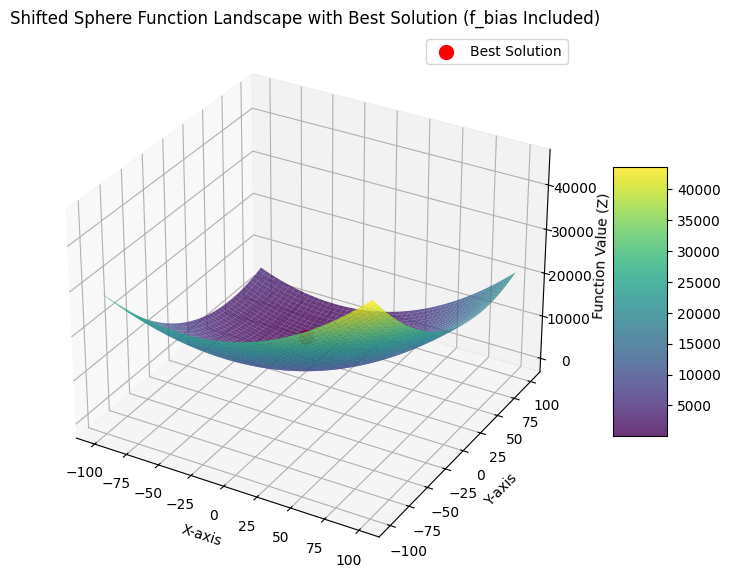

Iteration 1/50: Global Best Value = 583.9753
Iteration 2/50: Global Best Value = 13.2886
Iteration 3/50: Global Best Value = 13.2886
Iteration 4/50: Global Best Value = 13.2886
Iteration 5/50: Global Best Value = 13.2886
Iteration 6/50: Global Best Value = 13.2886
Iteration 7/50: Global Best Value = 13.2886
Iteration 8/50: Global Best Value = 13.2886
Iteration 9/50: Global Best Value = 10.7899
Iteration 10/50: Global Best Value = 10.1513
Iteration 11/50: Global Best Value = 10.1513
Iteration 12/50: Global Best Value = 10.1458
Iteration 13/50: Global Best Value = 10.1458
Iteration 14/50: Global Best Value = 10.0805
Iteration 15/50: Global Best Value = 10.0805
Iteration 16/50: Global Best Value = 10.0805
Iteration 17/50: Global Best Value = 10.0600
Iteration 18/50: Global Best Value = 10.0600
Iteration 19/50: Global Best Value = 10.0521
Iteration 20/50: Global Best Value = 10.0409
Iteration 21/50: Global Best Value = 10.0398
Iteration 22/50: Global Best Value = 10.0019
Iteration 23/50: G

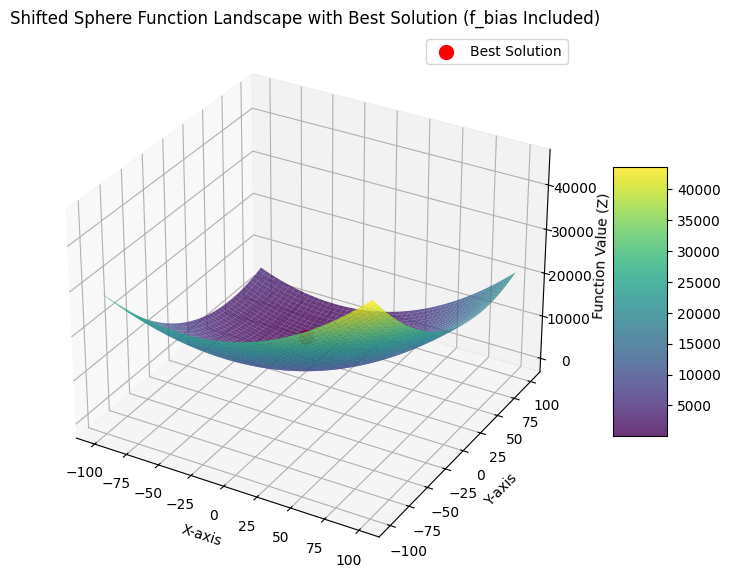

Iteration 1/50: Global Best Value = 824.3168
Iteration 2/50: Global Best Value = 54.3836
Iteration 3/50: Global Best Value = 54.3836
Iteration 4/50: Global Best Value = 16.7190
Iteration 5/50: Global Best Value = 16.7190
Iteration 6/50: Global Best Value = 16.7190
Iteration 7/50: Global Best Value = 16.7190
Iteration 8/50: Global Best Value = 16.7190
Iteration 9/50: Global Best Value = 16.7190
Iteration 10/50: Global Best Value = 15.0270
Iteration 11/50: Global Best Value = 10.4113
Iteration 12/50: Global Best Value = 10.0453
Iteration 13/50: Global Best Value = 10.0453
Iteration 14/50: Global Best Value = 10.0453
Iteration 15/50: Global Best Value = 10.0254
Iteration 16/50: Global Best Value = 10.0254
Iteration 17/50: Global Best Value = 10.0254
Iteration 18/50: Global Best Value = 10.0254
Iteration 19/50: Global Best Value = 10.0240
Iteration 20/50: Global Best Value = 10.0240
Iteration 21/50: Global Best Value = 10.0240
Iteration 22/50: Global Best Value = 10.0240
Iteration 23/50: G

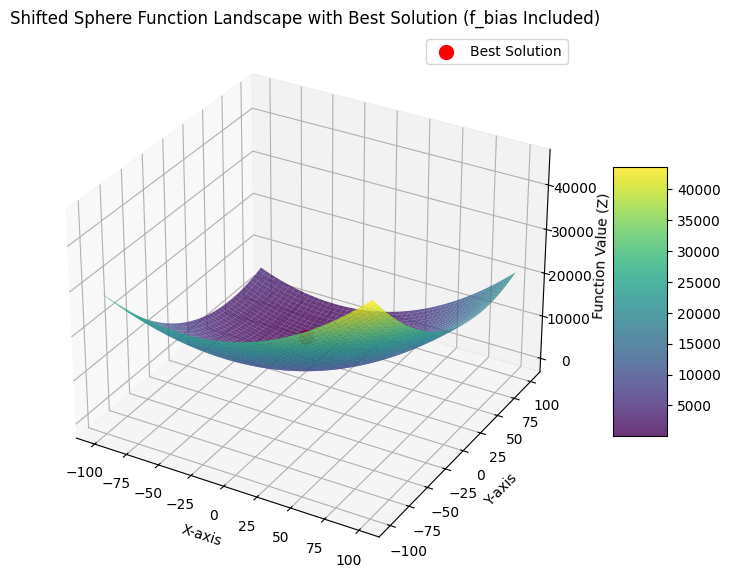

Iteration 1/50: Global Best Value = 464.3148
Iteration 2/50: Global Best Value = 169.6993
Iteration 3/50: Global Best Value = 112.0241
Iteration 4/50: Global Best Value = 36.9792
Iteration 5/50: Global Best Value = 18.8813
Iteration 6/50: Global Best Value = 13.6777
Iteration 7/50: Global Best Value = 12.2108
Iteration 8/50: Global Best Value = 10.8098
Iteration 9/50: Global Best Value = 10.8098
Iteration 10/50: Global Best Value = 10.8098
Iteration 11/50: Global Best Value = 10.8098
Iteration 12/50: Global Best Value = 10.6326
Iteration 13/50: Global Best Value = 10.6326
Iteration 14/50: Global Best Value = 10.6326
Iteration 15/50: Global Best Value = 10.0466
Iteration 16/50: Global Best Value = 10.0466
Iteration 17/50: Global Best Value = 10.0466
Iteration 18/50: Global Best Value = 10.0466
Iteration 19/50: Global Best Value = 10.0139
Iteration 20/50: Global Best Value = 10.0098
Iteration 21/50: Global Best Value = 10.0067
Iteration 22/50: Global Best Value = 10.0029
Iteration 23/50:

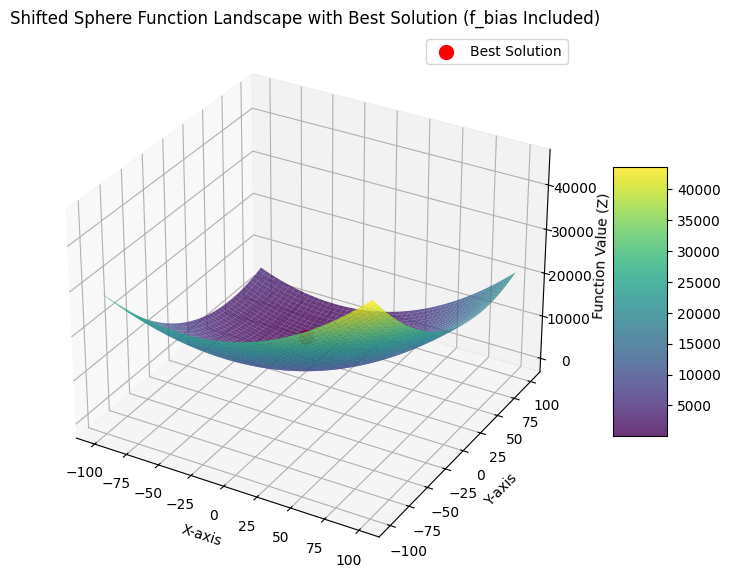

Iteration 1/50: Global Best Value = 108.1648
Iteration 2/50: Global Best Value = 14.5663
Iteration 3/50: Global Best Value = 14.5663
Iteration 4/50: Global Best Value = 14.5663
Iteration 5/50: Global Best Value = 14.5663
Iteration 6/50: Global Best Value = 14.5663
Iteration 7/50: Global Best Value = 10.5662
Iteration 8/50: Global Best Value = 10.5662
Iteration 9/50: Global Best Value = 10.5662
Iteration 10/50: Global Best Value = 10.5662
Iteration 11/50: Global Best Value = 10.3535
Iteration 12/50: Global Best Value = 10.3535
Iteration 13/50: Global Best Value = 10.3535
Iteration 14/50: Global Best Value = 10.1265
Iteration 15/50: Global Best Value = 10.1265
Iteration 16/50: Global Best Value = 10.1048
Iteration 17/50: Global Best Value = 10.1048
Iteration 18/50: Global Best Value = 10.0504
Iteration 19/50: Global Best Value = 10.0049
Iteration 20/50: Global Best Value = 10.0049
Iteration 21/50: Global Best Value = 10.0049
Iteration 22/50: Global Best Value = 10.0049
Iteration 23/50: G

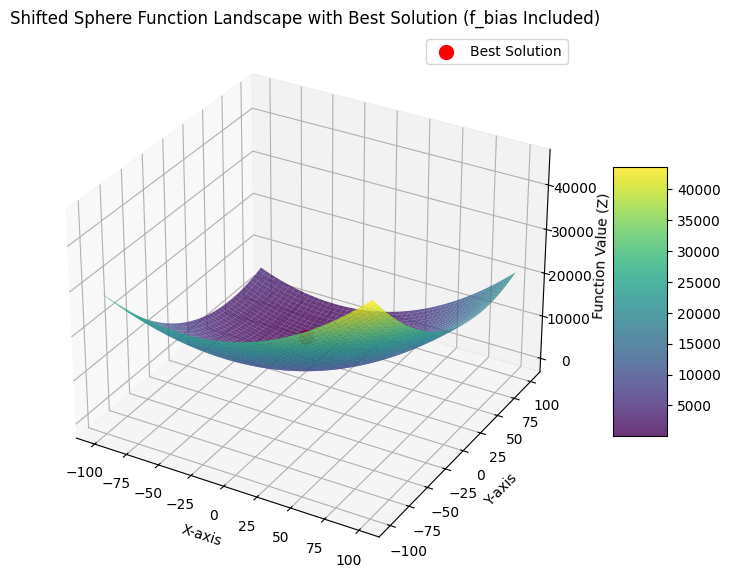

Iteration 1/50: Global Best Value = 292.8058
Iteration 2/50: Global Best Value = 126.1491
Iteration 3/50: Global Best Value = 60.5130
Iteration 4/50: Global Best Value = 60.5130
Iteration 5/50: Global Best Value = 26.0915
Iteration 6/50: Global Best Value = 26.0915
Iteration 7/50: Global Best Value = 22.2740
Iteration 8/50: Global Best Value = 12.8282
Iteration 9/50: Global Best Value = 11.4290
Iteration 10/50: Global Best Value = 11.4290
Iteration 11/50: Global Best Value = 10.3708
Iteration 12/50: Global Best Value = 10.1630
Iteration 13/50: Global Best Value = 10.1630
Iteration 14/50: Global Best Value = 10.0904
Iteration 15/50: Global Best Value = 10.0904
Iteration 16/50: Global Best Value = 10.0370
Iteration 17/50: Global Best Value = 10.0370
Iteration 18/50: Global Best Value = 10.0370
Iteration 19/50: Global Best Value = 10.0141
Iteration 20/50: Global Best Value = 10.0063
Iteration 21/50: Global Best Value = 10.0063
Iteration 22/50: Global Best Value = 10.0063
Iteration 23/50: 

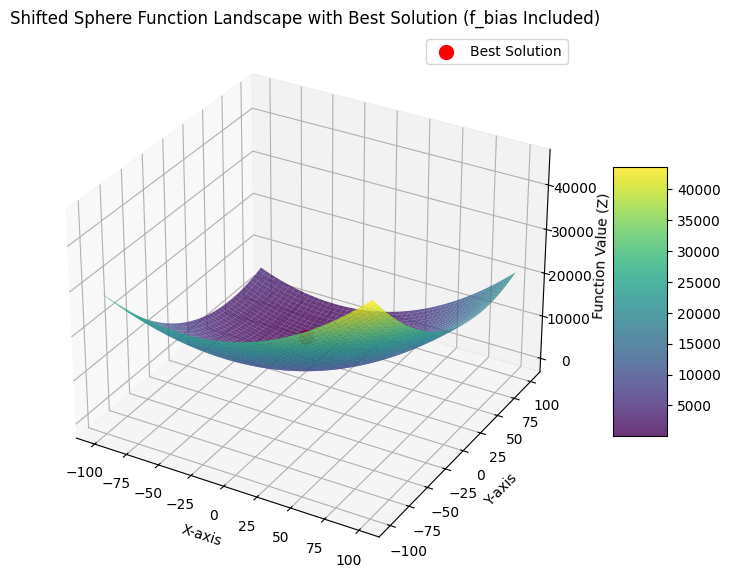

Iteration 1/50: Global Best Value = 103.9039
Iteration 2/50: Global Best Value = 103.9039
Iteration 3/50: Global Best Value = 82.4842
Iteration 4/50: Global Best Value = 48.3854
Iteration 5/50: Global Best Value = 10.6022
Iteration 6/50: Global Best Value = 10.6022
Iteration 7/50: Global Best Value = 10.6022
Iteration 8/50: Global Best Value = 10.6022
Iteration 9/50: Global Best Value = 10.6022
Iteration 10/50: Global Best Value = 10.4419
Iteration 11/50: Global Best Value = 10.4419
Iteration 12/50: Global Best Value = 10.4419
Iteration 13/50: Global Best Value = 10.2447
Iteration 14/50: Global Best Value = 10.2447
Iteration 15/50: Global Best Value = 10.1034
Iteration 16/50: Global Best Value = 10.0703
Iteration 17/50: Global Best Value = 10.0703
Iteration 18/50: Global Best Value = 10.0364
Iteration 19/50: Global Best Value = 10.0007
Iteration 20/50: Global Best Value = 10.0007
Iteration 21/50: Global Best Value = 10.0007
Iteration 22/50: Global Best Value = 10.0007
Iteration 23/50: 

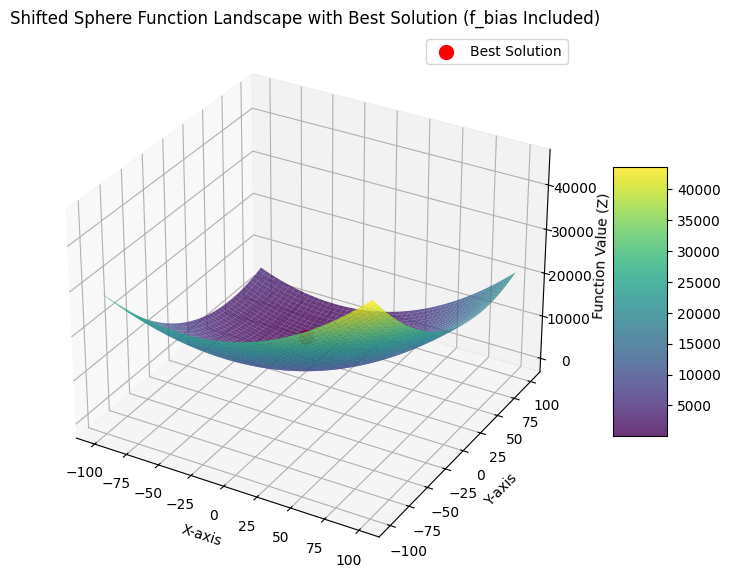

Iteration 1/50: Global Best Value = 180.8434
Iteration 2/50: Global Best Value = 43.6402
Iteration 3/50: Global Best Value = 16.4350
Iteration 4/50: Global Best Value = 16.4350
Iteration 5/50: Global Best Value = 13.5502
Iteration 6/50: Global Best Value = 13.0041
Iteration 7/50: Global Best Value = 11.9907
Iteration 8/50: Global Best Value = 11.9907
Iteration 9/50: Global Best Value = 11.4911
Iteration 10/50: Global Best Value = 11.4911
Iteration 11/50: Global Best Value = 11.4911
Iteration 12/50: Global Best Value = 10.4101
Iteration 13/50: Global Best Value = 10.4101
Iteration 14/50: Global Best Value = 10.4101
Iteration 15/50: Global Best Value = 10.4101
Iteration 16/50: Global Best Value = 10.4101
Iteration 17/50: Global Best Value = 10.1920
Iteration 18/50: Global Best Value = 10.0361
Iteration 19/50: Global Best Value = 10.0361
Iteration 20/50: Global Best Value = 10.0027
Iteration 21/50: Global Best Value = 10.0027
Iteration 22/50: Global Best Value = 10.0027
Iteration 23/50: G

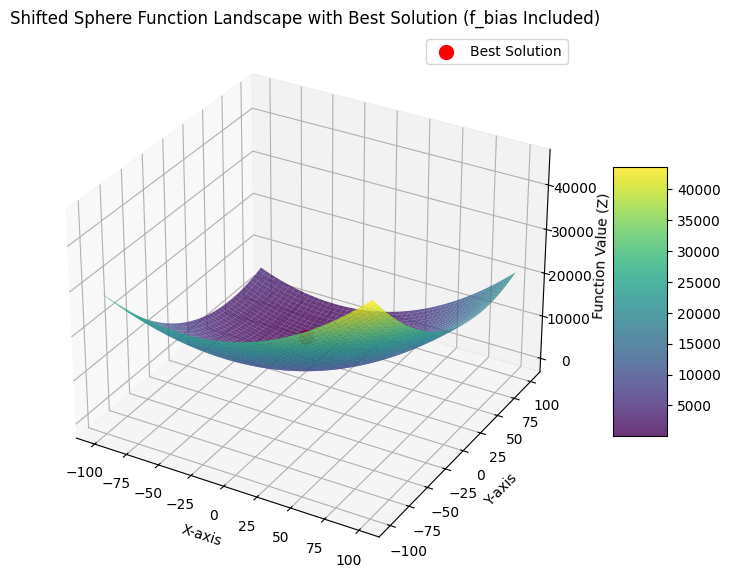

Iteration 1/50: Global Best Value = 564.4534
Iteration 2/50: Global Best Value = 54.0192
Iteration 3/50: Global Best Value = 54.0192
Iteration 4/50: Global Best Value = 22.1335
Iteration 5/50: Global Best Value = 22.1335
Iteration 6/50: Global Best Value = 22.1335
Iteration 7/50: Global Best Value = 13.2959
Iteration 8/50: Global Best Value = 13.2959
Iteration 9/50: Global Best Value = 13.2959
Iteration 10/50: Global Best Value = 12.5793
Iteration 11/50: Global Best Value = 12.5793
Iteration 12/50: Global Best Value = 11.4760
Iteration 13/50: Global Best Value = 11.2851
Iteration 14/50: Global Best Value = 11.2851
Iteration 15/50: Global Best Value = 10.4213
Iteration 16/50: Global Best Value = 10.4213
Iteration 17/50: Global Best Value = 10.1303
Iteration 18/50: Global Best Value = 10.1303
Iteration 19/50: Global Best Value = 10.0936
Iteration 20/50: Global Best Value = 10.0936
Iteration 21/50: Global Best Value = 10.0687
Iteration 22/50: Global Best Value = 10.0687
Iteration 23/50: G

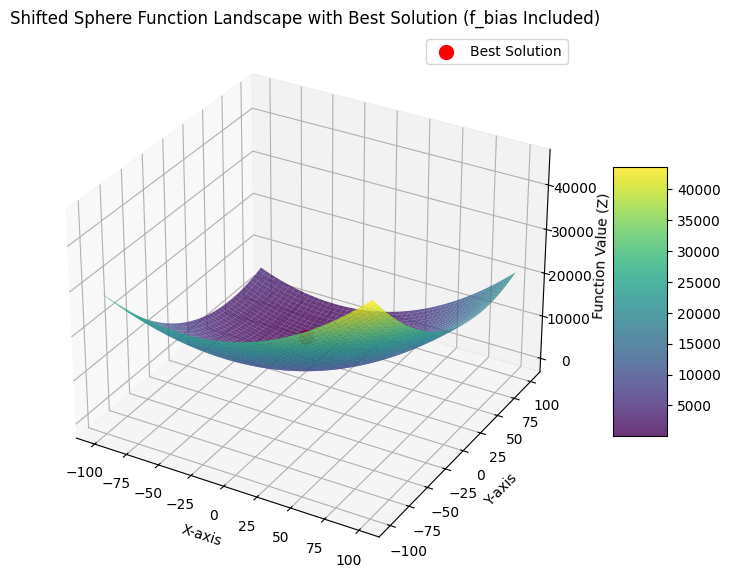

Iteration 1/50: Global Best Value = 395.8219
Iteration 2/50: Global Best Value = 68.7696
Iteration 3/50: Global Best Value = 68.7696
Iteration 4/50: Global Best Value = 53.7175
Iteration 5/50: Global Best Value = 19.2627
Iteration 6/50: Global Best Value = 19.2627
Iteration 7/50: Global Best Value = 18.3332
Iteration 8/50: Global Best Value = 15.8679
Iteration 9/50: Global Best Value = 15.8679
Iteration 10/50: Global Best Value = 10.2232
Iteration 11/50: Global Best Value = 10.2232
Iteration 12/50: Global Best Value = 10.1774
Iteration 13/50: Global Best Value = 10.0120
Iteration 14/50: Global Best Value = 10.0120
Iteration 15/50: Global Best Value = 10.0120
Iteration 16/50: Global Best Value = 10.0120
Iteration 17/50: Global Best Value = 10.0031
Iteration 18/50: Global Best Value = 10.0031
Iteration 19/50: Global Best Value = 10.0001
Iteration 20/50: Global Best Value = 10.0001
Iteration 21/50: Global Best Value = 10.0001
Iteration 22/50: Global Best Value = 10.0001
Iteration 23/50: G

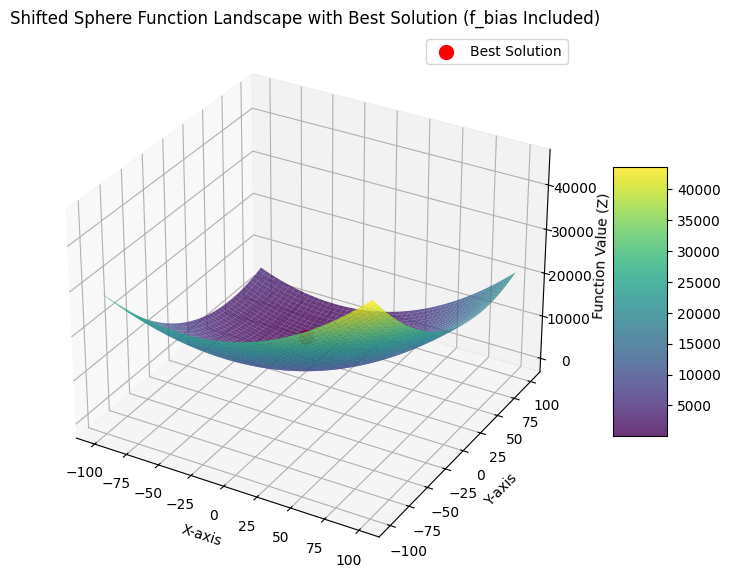

Iteration 1/50: Global Best Value = 1371.1131
Iteration 2/50: Global Best Value = 135.4705
Iteration 3/50: Global Best Value = 42.1151
Iteration 4/50: Global Best Value = 42.1151
Iteration 5/50: Global Best Value = 14.1750
Iteration 6/50: Global Best Value = 14.1750
Iteration 7/50: Global Best Value = 10.9732
Iteration 8/50: Global Best Value = 10.9732
Iteration 9/50: Global Best Value = 10.9732
Iteration 10/50: Global Best Value = 10.7080
Iteration 11/50: Global Best Value = 10.0888
Iteration 12/50: Global Best Value = 10.0888
Iteration 13/50: Global Best Value = 10.0888
Iteration 14/50: Global Best Value = 10.0766
Iteration 15/50: Global Best Value = 10.0766
Iteration 16/50: Global Best Value = 10.0766
Iteration 17/50: Global Best Value = 10.0766
Iteration 18/50: Global Best Value = 10.0736
Iteration 19/50: Global Best Value = 10.0283
Iteration 20/50: Global Best Value = 10.0134
Iteration 21/50: Global Best Value = 10.0074
Iteration 22/50: Global Best Value = 10.0074
Iteration 23/50:

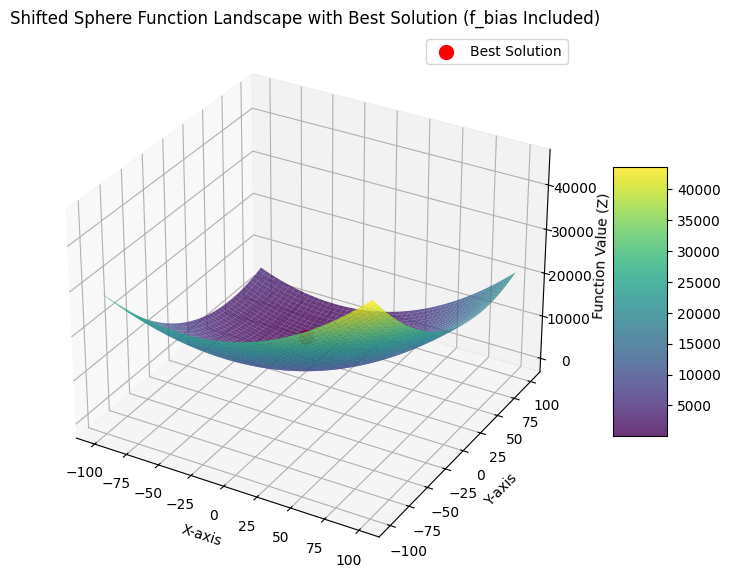

Iteration 1/50: Global Best Value = 160.1471
Iteration 2/50: Global Best Value = 157.5634
Iteration 3/50: Global Best Value = 16.4356
Iteration 4/50: Global Best Value = 15.0115
Iteration 5/50: Global Best Value = 15.0115
Iteration 6/50: Global Best Value = 15.0115
Iteration 7/50: Global Best Value = 13.2848
Iteration 8/50: Global Best Value = 13.2848
Iteration 9/50: Global Best Value = 13.2848
Iteration 10/50: Global Best Value = 13.1773
Iteration 11/50: Global Best Value = 13.1773
Iteration 12/50: Global Best Value = 12.4349
Iteration 13/50: Global Best Value = 10.0565
Iteration 14/50: Global Best Value = 10.0565
Iteration 15/50: Global Best Value = 10.0565
Iteration 16/50: Global Best Value = 10.0565
Iteration 17/50: Global Best Value = 10.0565
Iteration 18/50: Global Best Value = 10.0565
Iteration 19/50: Global Best Value = 10.0565
Iteration 20/50: Global Best Value = 10.0243
Iteration 21/50: Global Best Value = 10.0096
Iteration 22/50: Global Best Value = 10.0096
Iteration 23/50: 

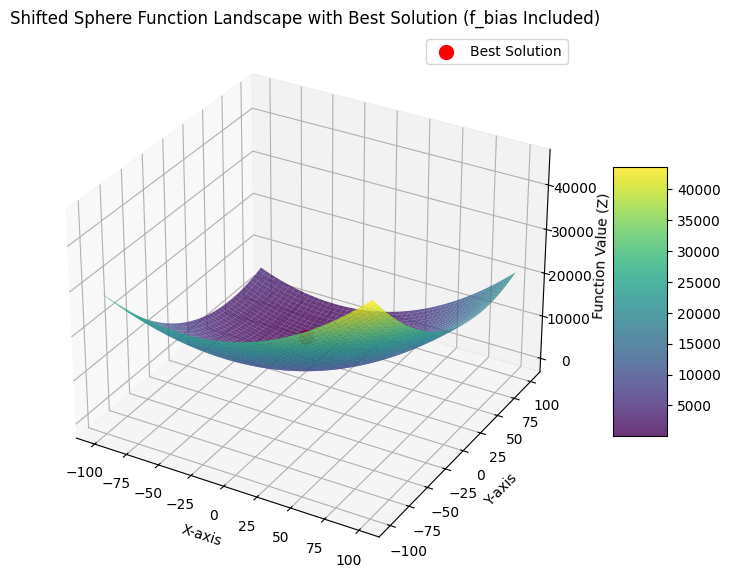

Iteration 1/50: Global Best Value = 1250.1779
Iteration 2/50: Global Best Value = 310.1632
Iteration 3/50: Global Best Value = 61.7906
Iteration 4/50: Global Best Value = 24.9458
Iteration 5/50: Global Best Value = 24.9458
Iteration 6/50: Global Best Value = 24.9458
Iteration 7/50: Global Best Value = 24.9458
Iteration 8/50: Global Best Value = 12.2698
Iteration 9/50: Global Best Value = 12.2698
Iteration 10/50: Global Best Value = 12.2698
Iteration 11/50: Global Best Value = 12.2698
Iteration 12/50: Global Best Value = 10.0195
Iteration 13/50: Global Best Value = 10.0195
Iteration 14/50: Global Best Value = 10.0195
Iteration 15/50: Global Best Value = 10.0195
Iteration 16/50: Global Best Value = 10.0134
Iteration 17/50: Global Best Value = 10.0134
Iteration 18/50: Global Best Value = 10.0134
Iteration 19/50: Global Best Value = 10.0134
Iteration 20/50: Global Best Value = 10.0134
Iteration 21/50: Global Best Value = 10.0072
Iteration 22/50: Global Best Value = 10.0072
Iteration 23/50:

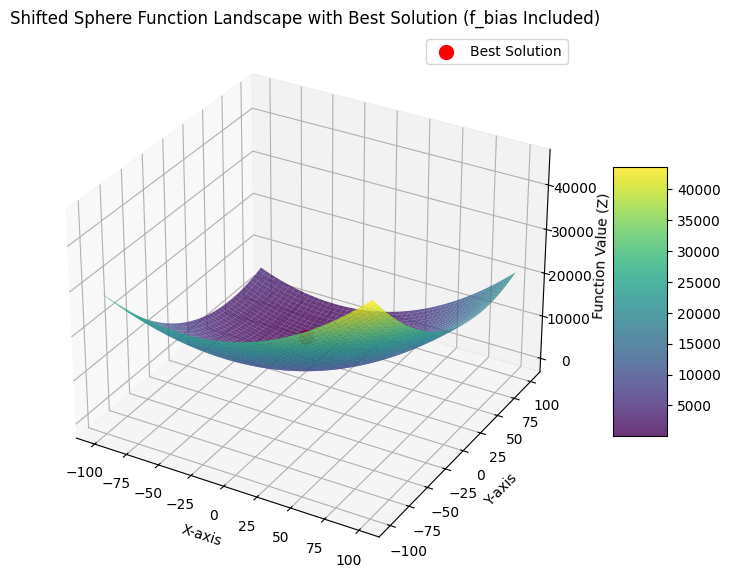

Iteration 1/50: Global Best Value = 192.6495
Iteration 2/50: Global Best Value = 40.2772
Iteration 3/50: Global Best Value = 12.3134
Iteration 4/50: Global Best Value = 12.3134
Iteration 5/50: Global Best Value = 12.3134
Iteration 6/50: Global Best Value = 12.3134
Iteration 7/50: Global Best Value = 11.0309
Iteration 8/50: Global Best Value = 10.4027
Iteration 9/50: Global Best Value = 10.4027
Iteration 10/50: Global Best Value = 10.4027
Iteration 11/50: Global Best Value = 10.4027
Iteration 12/50: Global Best Value = 10.4027
Iteration 13/50: Global Best Value = 10.1306
Iteration 14/50: Global Best Value = 10.1306
Iteration 15/50: Global Best Value = 10.1037
Iteration 16/50: Global Best Value = 10.1037
Iteration 17/50: Global Best Value = 10.0973
Iteration 18/50: Global Best Value = 10.0926
Iteration 19/50: Global Best Value = 10.0881
Iteration 20/50: Global Best Value = 10.0112
Iteration 21/50: Global Best Value = 10.0096
Iteration 22/50: Global Best Value = 10.0004
Iteration 23/50: G

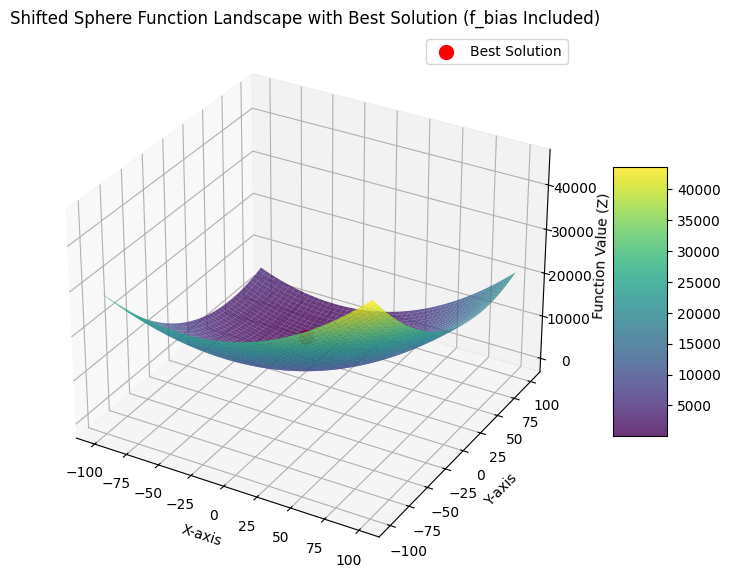

Iteration 1/50: Global Best Value = 322.6519
Iteration 2/50: Global Best Value = 35.3224
Iteration 3/50: Global Best Value = 11.9154
Iteration 4/50: Global Best Value = 11.9154
Iteration 5/50: Global Best Value = 11.9154
Iteration 6/50: Global Best Value = 10.5027
Iteration 7/50: Global Best Value = 10.5027
Iteration 8/50: Global Best Value = 10.2852
Iteration 9/50: Global Best Value = 10.2852
Iteration 10/50: Global Best Value = 10.2852
Iteration 11/50: Global Best Value = 10.2852
Iteration 12/50: Global Best Value = 10.2852
Iteration 13/50: Global Best Value = 10.2852
Iteration 14/50: Global Best Value = 10.1293
Iteration 15/50: Global Best Value = 10.0673
Iteration 16/50: Global Best Value = 10.0314
Iteration 17/50: Global Best Value = 10.0071
Iteration 18/50: Global Best Value = 10.0071
Iteration 19/50: Global Best Value = 10.0071
Iteration 20/50: Global Best Value = 10.0071
Iteration 21/50: Global Best Value = 10.0050
Iteration 22/50: Global Best Value = 10.0050
Iteration 23/50: G

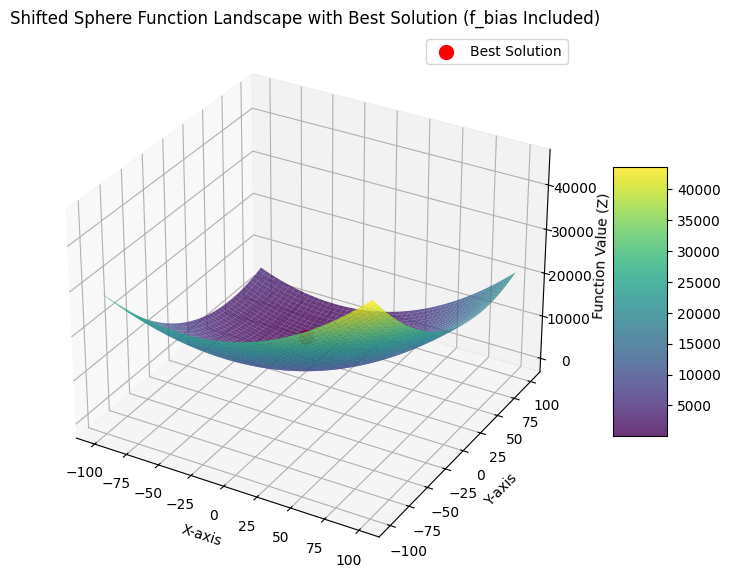

In [20]:
# Run Particle Swarm Optimization on Sphere function for D = 2
best_solutions = []
for i in range(0, 15):
    pso_solution = run_pso_sphere(2)
    best_solutions.append(pso_solution)

In [21]:
# Get Average, Min, Max of Best values for D = 2
best_values = [solution['best_value'] for solution in best_solutions]

average = np.average(best_values)
min = np.min(best_values)
max = np.max(best_values)
standard_deviation = np.std(best_values)

print("Average: ", average)
print("Min: ", min)
print("Max: ", max)
print("Standard Deviation", standard_deviation)

Average:  10.000000261262011
Min:  10.00000001317454
Max:  10.000001288069573
Standard Deviation 3.353218597346549e-07


Iteration 1/50: Global Best Value = 22002.9018
Iteration 2/50: Global Best Value = 17367.1500
Iteration 3/50: Global Best Value = 11053.1329
Iteration 4/50: Global Best Value = 10060.8549
Iteration 5/50: Global Best Value = 5497.5950
Iteration 6/50: Global Best Value = 3384.3746
Iteration 7/50: Global Best Value = 2727.6401
Iteration 8/50: Global Best Value = 2654.0084
Iteration 9/50: Global Best Value = 2654.0084
Iteration 10/50: Global Best Value = 2654.0084
Iteration 11/50: Global Best Value = 2385.5776
Iteration 12/50: Global Best Value = 2332.7887
Iteration 13/50: Global Best Value = 2332.7887
Iteration 14/50: Global Best Value = 2332.7887
Iteration 15/50: Global Best Value = 2251.8732
Iteration 16/50: Global Best Value = 2251.8732
Iteration 17/50: Global Best Value = 2251.8732
Iteration 18/50: Global Best Value = 2251.8732
Iteration 19/50: Global Best Value = 2251.8732
Iteration 20/50: Global Best Value = 2241.1792
Iteration 21/50: Global Best Value = 2221.4455
Iteration 22/50: G

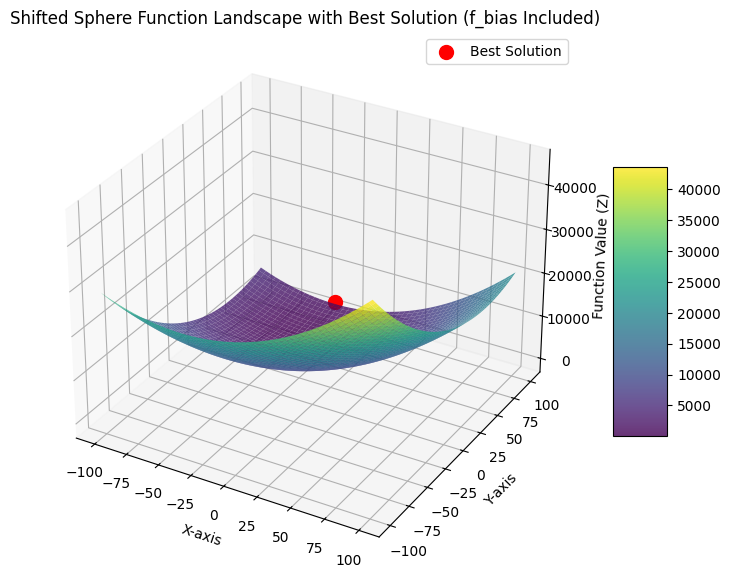

Iteration 1/50: Global Best Value = 10769.1195
Iteration 2/50: Global Best Value = 9957.2498
Iteration 3/50: Global Best Value = 8275.9199
Iteration 4/50: Global Best Value = 6670.5377
Iteration 5/50: Global Best Value = 4555.2852
Iteration 6/50: Global Best Value = 2040.9949
Iteration 7/50: Global Best Value = 2040.9949
Iteration 8/50: Global Best Value = 2040.9949
Iteration 9/50: Global Best Value = 2038.3871
Iteration 10/50: Global Best Value = 1376.7874
Iteration 11/50: Global Best Value = 1376.7874
Iteration 12/50: Global Best Value = 1376.7874
Iteration 13/50: Global Best Value = 1287.5227
Iteration 14/50: Global Best Value = 1108.3966
Iteration 15/50: Global Best Value = 860.9341
Iteration 16/50: Global Best Value = 860.9341
Iteration 17/50: Global Best Value = 711.0551
Iteration 18/50: Global Best Value = 538.8072
Iteration 19/50: Global Best Value = 538.8072
Iteration 20/50: Global Best Value = 470.8256
Iteration 21/50: Global Best Value = 431.9570
Iteration 22/50: Global Best

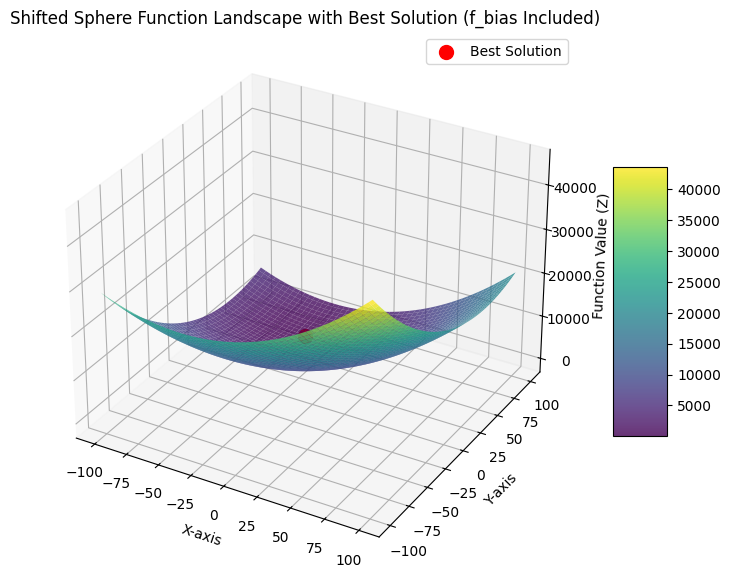

Iteration 1/50: Global Best Value = 11484.1329
Iteration 2/50: Global Best Value = 11484.1329
Iteration 3/50: Global Best Value = 11484.1329
Iteration 4/50: Global Best Value = 11128.8958
Iteration 5/50: Global Best Value = 5685.6296
Iteration 6/50: Global Best Value = 5178.7309
Iteration 7/50: Global Best Value = 3658.5974
Iteration 8/50: Global Best Value = 3549.6587
Iteration 9/50: Global Best Value = 3219.1516
Iteration 10/50: Global Best Value = 2717.2054
Iteration 11/50: Global Best Value = 2717.2054
Iteration 12/50: Global Best Value = 2208.1066
Iteration 13/50: Global Best Value = 2177.7040
Iteration 14/50: Global Best Value = 1790.6806
Iteration 15/50: Global Best Value = 1159.8934
Iteration 16/50: Global Best Value = 991.1064
Iteration 17/50: Global Best Value = 991.1064
Iteration 18/50: Global Best Value = 956.1170
Iteration 19/50: Global Best Value = 956.1170
Iteration 20/50: Global Best Value = 956.1170
Iteration 21/50: Global Best Value = 956.1170
Iteration 22/50: Global 

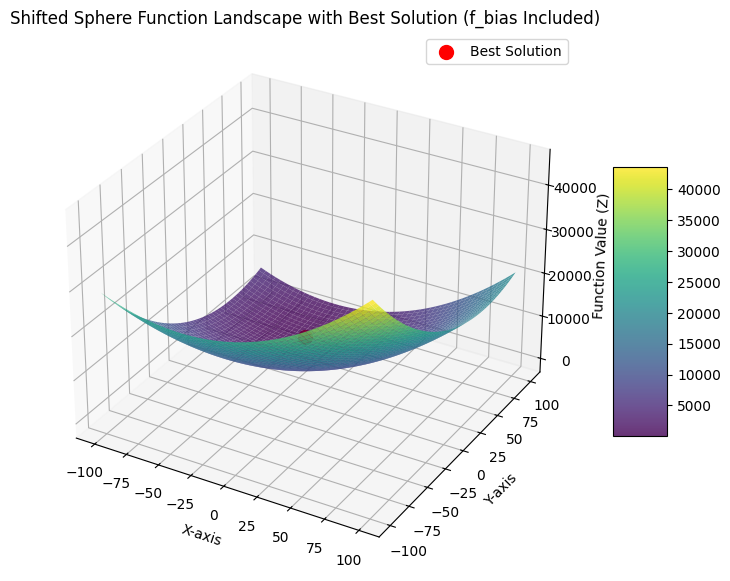

Iteration 1/50: Global Best Value = 3548.9192
Iteration 2/50: Global Best Value = 3548.9192
Iteration 3/50: Global Best Value = 2818.5054
Iteration 4/50: Global Best Value = 2818.5054
Iteration 5/50: Global Best Value = 2650.6409
Iteration 6/50: Global Best Value = 1649.4461
Iteration 7/50: Global Best Value = 1649.4461
Iteration 8/50: Global Best Value = 1405.2874
Iteration 9/50: Global Best Value = 1196.4570
Iteration 10/50: Global Best Value = 1165.2439
Iteration 11/50: Global Best Value = 1079.8485
Iteration 12/50: Global Best Value = 1005.9272
Iteration 13/50: Global Best Value = 880.4527
Iteration 14/50: Global Best Value = 746.6206
Iteration 15/50: Global Best Value = 696.2578
Iteration 16/50: Global Best Value = 624.0609
Iteration 17/50: Global Best Value = 624.0609
Iteration 18/50: Global Best Value = 582.5674
Iteration 19/50: Global Best Value = 555.6235
Iteration 20/50: Global Best Value = 555.6235
Iteration 21/50: Global Best Value = 552.9305
Iteration 22/50: Global Best Va

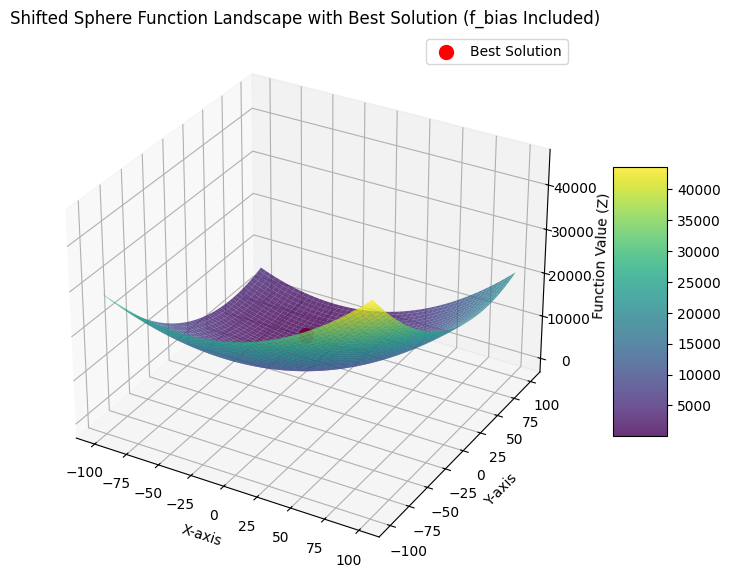

Iteration 1/50: Global Best Value = 20282.9126
Iteration 2/50: Global Best Value = 16890.1053
Iteration 3/50: Global Best Value = 11674.6283
Iteration 4/50: Global Best Value = 7696.1778
Iteration 5/50: Global Best Value = 7696.1778
Iteration 6/50: Global Best Value = 7575.0168
Iteration 7/50: Global Best Value = 5410.0036
Iteration 8/50: Global Best Value = 4966.1417
Iteration 9/50: Global Best Value = 4966.1417
Iteration 10/50: Global Best Value = 3853.1274
Iteration 11/50: Global Best Value = 3853.1274
Iteration 12/50: Global Best Value = 2966.1020
Iteration 13/50: Global Best Value = 2966.1020
Iteration 14/50: Global Best Value = 2279.4272
Iteration 15/50: Global Best Value = 2279.4272
Iteration 16/50: Global Best Value = 2279.4272
Iteration 17/50: Global Best Value = 2144.0750
Iteration 18/50: Global Best Value = 2007.6756
Iteration 19/50: Global Best Value = 1858.3872
Iteration 20/50: Global Best Value = 1858.3872
Iteration 21/50: Global Best Value = 1858.3872
Iteration 22/50: Gl

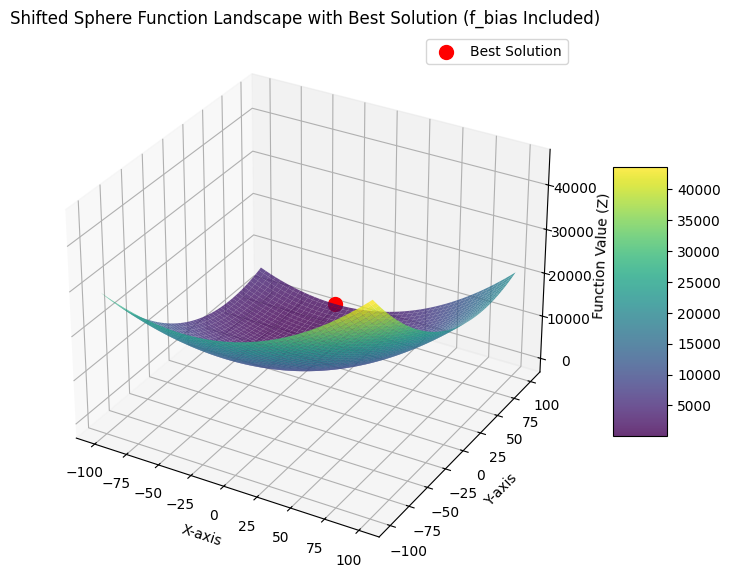

Iteration 1/50: Global Best Value = 21448.4277
Iteration 2/50: Global Best Value = 15306.8350
Iteration 3/50: Global Best Value = 13106.9797
Iteration 4/50: Global Best Value = 10708.3415
Iteration 5/50: Global Best Value = 9397.5514
Iteration 6/50: Global Best Value = 7009.7577
Iteration 7/50: Global Best Value = 7009.7577
Iteration 8/50: Global Best Value = 6290.6501
Iteration 9/50: Global Best Value = 4824.1356
Iteration 10/50: Global Best Value = 4128.1465
Iteration 11/50: Global Best Value = 4118.9803
Iteration 12/50: Global Best Value = 2765.1339
Iteration 13/50: Global Best Value = 1558.4159
Iteration 14/50: Global Best Value = 1558.4159
Iteration 15/50: Global Best Value = 1352.3847
Iteration 16/50: Global Best Value = 1310.9860
Iteration 17/50: Global Best Value = 1310.9860
Iteration 18/50: Global Best Value = 1284.5879
Iteration 19/50: Global Best Value = 1284.5879
Iteration 20/50: Global Best Value = 1284.5879
Iteration 21/50: Global Best Value = 1244.2126
Iteration 22/50: G

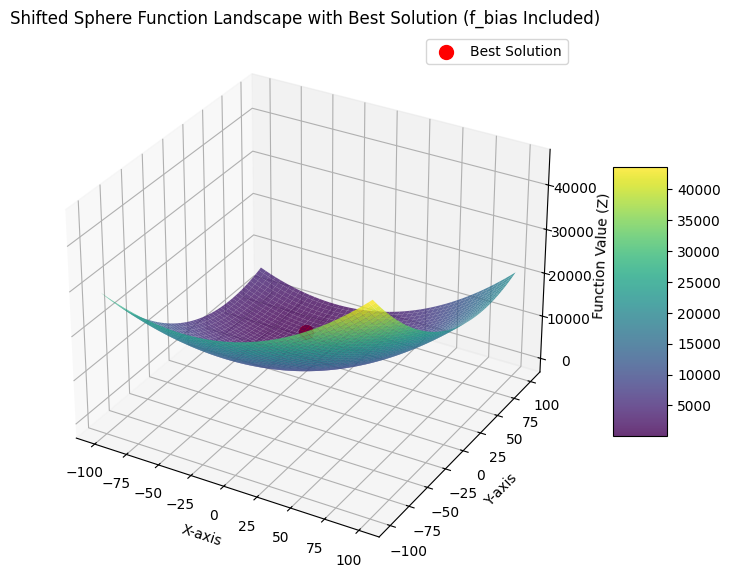

Iteration 1/50: Global Best Value = 16425.9421
Iteration 2/50: Global Best Value = 7950.7367
Iteration 3/50: Global Best Value = 6870.3652
Iteration 4/50: Global Best Value = 3296.8698
Iteration 5/50: Global Best Value = 3296.8698
Iteration 6/50: Global Best Value = 3194.1129
Iteration 7/50: Global Best Value = 3194.1129
Iteration 8/50: Global Best Value = 2379.8926
Iteration 9/50: Global Best Value = 2379.8926
Iteration 10/50: Global Best Value = 2029.2611
Iteration 11/50: Global Best Value = 1782.5395
Iteration 12/50: Global Best Value = 1425.3156
Iteration 13/50: Global Best Value = 1323.2241
Iteration 14/50: Global Best Value = 1280.2908
Iteration 15/50: Global Best Value = 1262.3661
Iteration 16/50: Global Best Value = 1262.3661
Iteration 17/50: Global Best Value = 1241.2388
Iteration 18/50: Global Best Value = 960.4384
Iteration 19/50: Global Best Value = 899.2519
Iteration 20/50: Global Best Value = 899.2519
Iteration 21/50: Global Best Value = 872.3972
Iteration 22/50: Global B

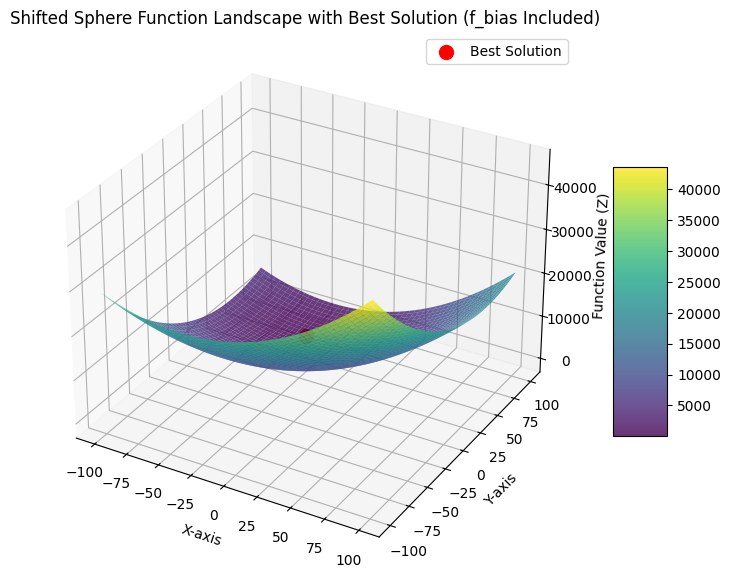

Iteration 1/50: Global Best Value = 24140.3909
Iteration 2/50: Global Best Value = 18455.4919
Iteration 3/50: Global Best Value = 10012.5705
Iteration 4/50: Global Best Value = 8228.8342
Iteration 5/50: Global Best Value = 3847.7962
Iteration 6/50: Global Best Value = 3718.7045
Iteration 7/50: Global Best Value = 3718.7045
Iteration 8/50: Global Best Value = 2771.5243
Iteration 9/50: Global Best Value = 2771.5243
Iteration 10/50: Global Best Value = 2297.7442
Iteration 11/50: Global Best Value = 2297.7442
Iteration 12/50: Global Best Value = 2077.4047
Iteration 13/50: Global Best Value = 1868.0483
Iteration 14/50: Global Best Value = 1868.0483
Iteration 15/50: Global Best Value = 1868.0483
Iteration 16/50: Global Best Value = 1519.6067
Iteration 17/50: Global Best Value = 1265.7238
Iteration 18/50: Global Best Value = 1265.7238
Iteration 19/50: Global Best Value = 1265.7238
Iteration 20/50: Global Best Value = 1265.7238
Iteration 21/50: Global Best Value = 1201.7991
Iteration 22/50: Gl

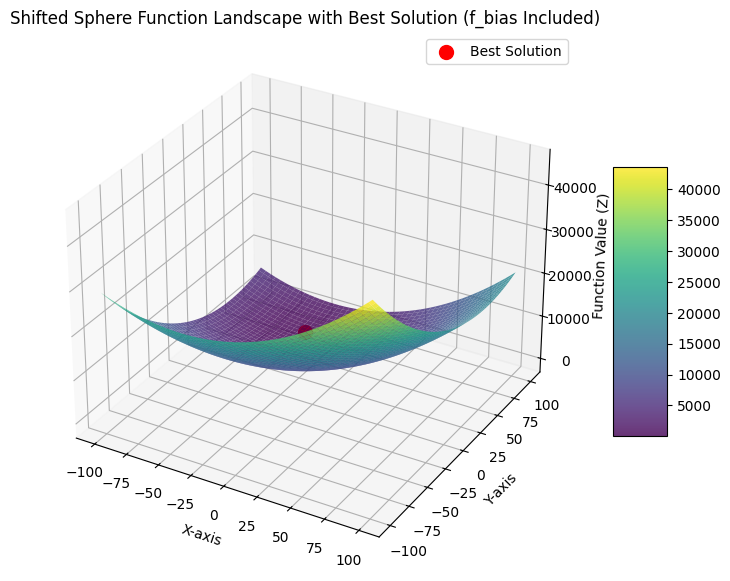

Iteration 1/50: Global Best Value = 21740.0661
Iteration 2/50: Global Best Value = 9904.2274
Iteration 3/50: Global Best Value = 9904.2274
Iteration 4/50: Global Best Value = 9086.9400
Iteration 5/50: Global Best Value = 3235.2019
Iteration 6/50: Global Best Value = 3235.2019
Iteration 7/50: Global Best Value = 3235.2019
Iteration 8/50: Global Best Value = 2588.8910
Iteration 9/50: Global Best Value = 2588.8910
Iteration 10/50: Global Best Value = 2088.6581
Iteration 11/50: Global Best Value = 1801.4536
Iteration 12/50: Global Best Value = 1708.6116
Iteration 13/50: Global Best Value = 1652.2547
Iteration 14/50: Global Best Value = 1563.0349
Iteration 15/50: Global Best Value = 1487.2926
Iteration 16/50: Global Best Value = 997.8044
Iteration 17/50: Global Best Value = 997.8044
Iteration 18/50: Global Best Value = 927.4574
Iteration 19/50: Global Best Value = 924.8818
Iteration 20/50: Global Best Value = 764.4146
Iteration 21/50: Global Best Value = 764.4146
Iteration 22/50: Global Bes

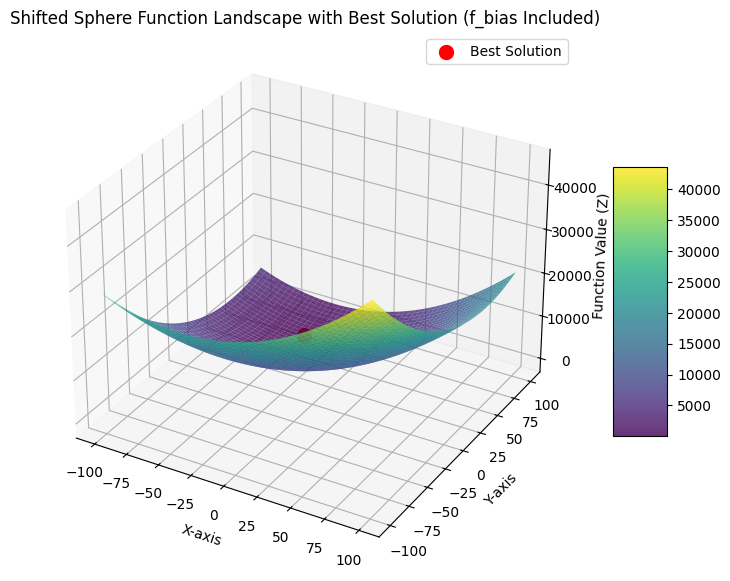

Iteration 1/50: Global Best Value = 19064.4647
Iteration 2/50: Global Best Value = 10234.7478
Iteration 3/50: Global Best Value = 10023.0646
Iteration 4/50: Global Best Value = 6271.6661
Iteration 5/50: Global Best Value = 4670.0419
Iteration 6/50: Global Best Value = 3356.8011
Iteration 7/50: Global Best Value = 3356.8011
Iteration 8/50: Global Best Value = 2744.7705
Iteration 9/50: Global Best Value = 2370.2831
Iteration 10/50: Global Best Value = 1360.0211
Iteration 11/50: Global Best Value = 1269.2725
Iteration 12/50: Global Best Value = 1269.2725
Iteration 13/50: Global Best Value = 1165.9969
Iteration 14/50: Global Best Value = 945.4673
Iteration 15/50: Global Best Value = 945.4673
Iteration 16/50: Global Best Value = 784.0380
Iteration 17/50: Global Best Value = 750.7461
Iteration 18/50: Global Best Value = 644.3121
Iteration 19/50: Global Best Value = 479.6254
Iteration 20/50: Global Best Value = 300.8993
Iteration 21/50: Global Best Value = 300.8993
Iteration 22/50: Global Bes

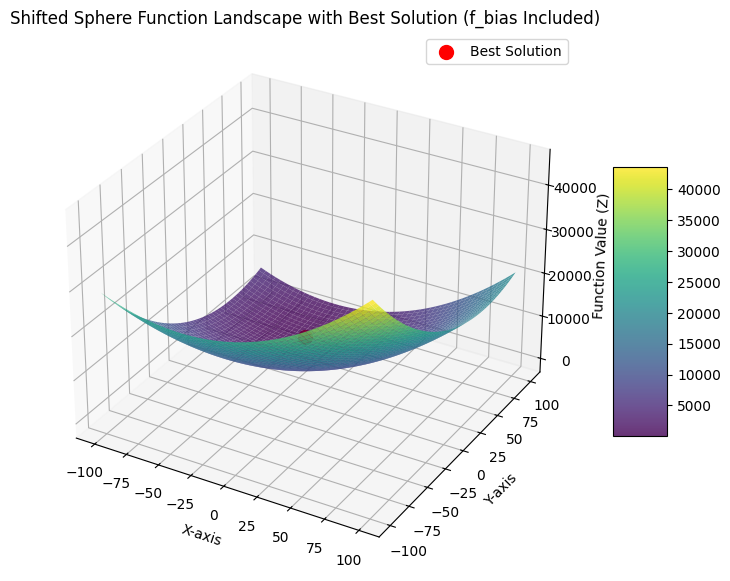

Iteration 1/50: Global Best Value = 18632.2100
Iteration 2/50: Global Best Value = 10304.9882
Iteration 3/50: Global Best Value = 9751.9456
Iteration 4/50: Global Best Value = 8291.6490
Iteration 5/50: Global Best Value = 4729.4978
Iteration 6/50: Global Best Value = 3862.6001
Iteration 7/50: Global Best Value = 3634.8028
Iteration 8/50: Global Best Value = 2811.3240
Iteration 9/50: Global Best Value = 2091.6314
Iteration 10/50: Global Best Value = 2091.6314
Iteration 11/50: Global Best Value = 1461.7554
Iteration 12/50: Global Best Value = 1461.7554
Iteration 13/50: Global Best Value = 1110.9943
Iteration 14/50: Global Best Value = 1110.9943
Iteration 15/50: Global Best Value = 1110.9943
Iteration 16/50: Global Best Value = 807.4770
Iteration 17/50: Global Best Value = 807.4770
Iteration 18/50: Global Best Value = 807.4770
Iteration 19/50: Global Best Value = 807.4770
Iteration 20/50: Global Best Value = 700.7804
Iteration 21/50: Global Best Value = 652.2898
Iteration 22/50: Global Be

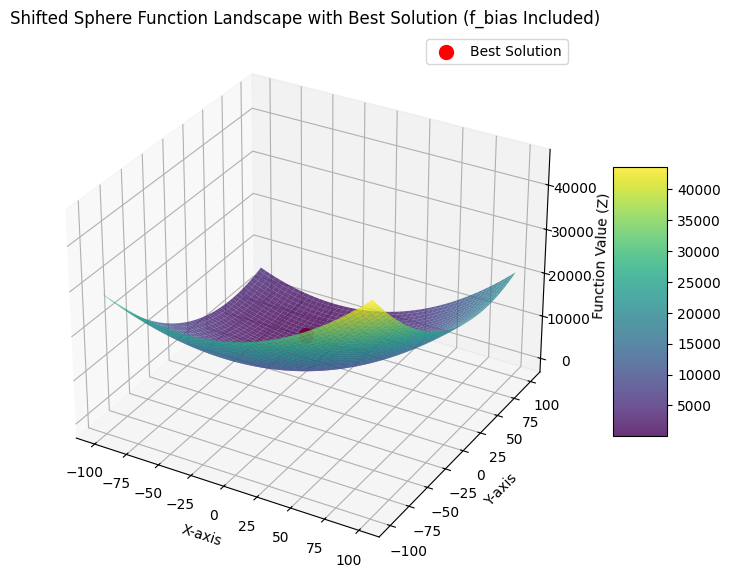

Iteration 1/50: Global Best Value = 17883.5442
Iteration 2/50: Global Best Value = 5501.1364
Iteration 3/50: Global Best Value = 3564.4066
Iteration 4/50: Global Best Value = 2516.8655
Iteration 5/50: Global Best Value = 2516.8655
Iteration 6/50: Global Best Value = 2516.8655
Iteration 7/50: Global Best Value = 2516.8655
Iteration 8/50: Global Best Value = 1938.2108
Iteration 9/50: Global Best Value = 1830.6042
Iteration 10/50: Global Best Value = 1830.6042
Iteration 11/50: Global Best Value = 1182.1591
Iteration 12/50: Global Best Value = 1158.9920
Iteration 13/50: Global Best Value = 1016.3954
Iteration 14/50: Global Best Value = 843.3836
Iteration 15/50: Global Best Value = 843.3836
Iteration 16/50: Global Best Value = 627.7241
Iteration 17/50: Global Best Value = 627.7241
Iteration 18/50: Global Best Value = 578.3041
Iteration 19/50: Global Best Value = 578.3041
Iteration 20/50: Global Best Value = 578.3041
Iteration 21/50: Global Best Value = 403.0514
Iteration 22/50: Global Best 

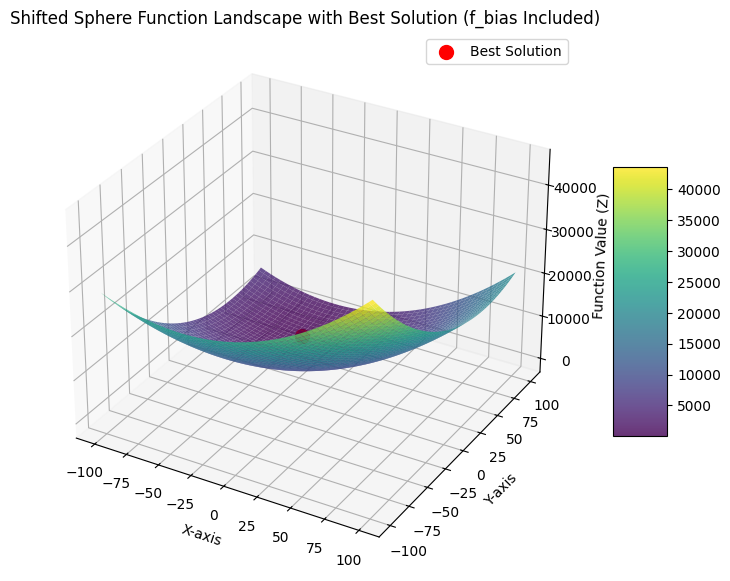

Iteration 1/50: Global Best Value = 24686.2490
Iteration 2/50: Global Best Value = 13044.2768
Iteration 3/50: Global Best Value = 7687.7009
Iteration 4/50: Global Best Value = 7687.7009
Iteration 5/50: Global Best Value = 7687.7009
Iteration 6/50: Global Best Value = 5796.3649
Iteration 7/50: Global Best Value = 2981.9623
Iteration 8/50: Global Best Value = 1368.2669
Iteration 9/50: Global Best Value = 1102.7871
Iteration 10/50: Global Best Value = 1102.7871
Iteration 11/50: Global Best Value = 1063.3421
Iteration 12/50: Global Best Value = 1045.5700
Iteration 13/50: Global Best Value = 935.3877
Iteration 14/50: Global Best Value = 935.3877
Iteration 15/50: Global Best Value = 935.3877
Iteration 16/50: Global Best Value = 746.2000
Iteration 17/50: Global Best Value = 692.2923
Iteration 18/50: Global Best Value = 692.2923
Iteration 19/50: Global Best Value = 692.2923
Iteration 20/50: Global Best Value = 692.2923
Iteration 21/50: Global Best Value = 692.2923
Iteration 22/50: Global Best 

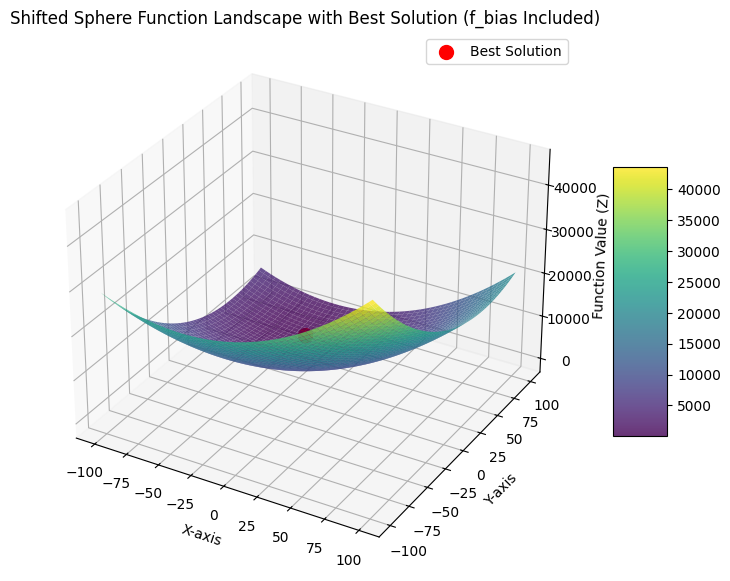

Iteration 1/50: Global Best Value = 24007.4018
Iteration 2/50: Global Best Value = 15187.7925
Iteration 3/50: Global Best Value = 9843.5408
Iteration 4/50: Global Best Value = 7941.6838
Iteration 5/50: Global Best Value = 6363.7264
Iteration 6/50: Global Best Value = 5967.6147
Iteration 7/50: Global Best Value = 5391.8853
Iteration 8/50: Global Best Value = 3937.5202
Iteration 9/50: Global Best Value = 3511.8818
Iteration 10/50: Global Best Value = 3511.8818
Iteration 11/50: Global Best Value = 3451.1788
Iteration 12/50: Global Best Value = 3391.4461
Iteration 13/50: Global Best Value = 3391.4461
Iteration 14/50: Global Best Value = 3347.6041
Iteration 15/50: Global Best Value = 3273.1306
Iteration 16/50: Global Best Value = 3273.1306
Iteration 17/50: Global Best Value = 2957.3505
Iteration 18/50: Global Best Value = 2957.3505
Iteration 19/50: Global Best Value = 2957.3505
Iteration 20/50: Global Best Value = 2933.4130
Iteration 21/50: Global Best Value = 2933.4130
Iteration 22/50: Glo

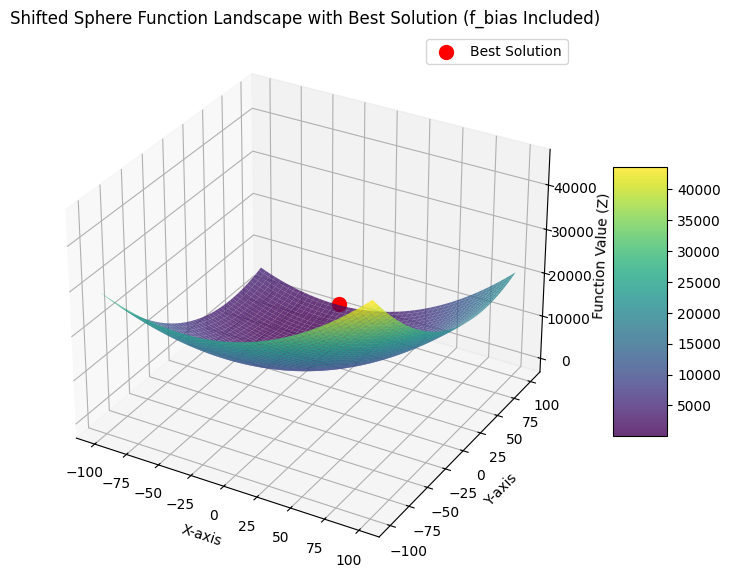

Iteration 1/50: Global Best Value = 17378.7043
Iteration 2/50: Global Best Value = 15481.1667
Iteration 3/50: Global Best Value = 7453.0760
Iteration 4/50: Global Best Value = 6958.5399
Iteration 5/50: Global Best Value = 4517.2787
Iteration 6/50: Global Best Value = 3105.9602
Iteration 7/50: Global Best Value = 3105.9602
Iteration 8/50: Global Best Value = 1756.0537
Iteration 9/50: Global Best Value = 1417.8288
Iteration 10/50: Global Best Value = 573.4503
Iteration 11/50: Global Best Value = 573.4503
Iteration 12/50: Global Best Value = 573.4503
Iteration 13/50: Global Best Value = 368.1559
Iteration 14/50: Global Best Value = 368.1559
Iteration 15/50: Global Best Value = 368.1559
Iteration 16/50: Global Best Value = 331.9571
Iteration 17/50: Global Best Value = 331.9571
Iteration 18/50: Global Best Value = 331.9571
Iteration 19/50: Global Best Value = 280.8572
Iteration 20/50: Global Best Value = 280.8572
Iteration 21/50: Global Best Value = 277.9935
Iteration 22/50: Global Best Val

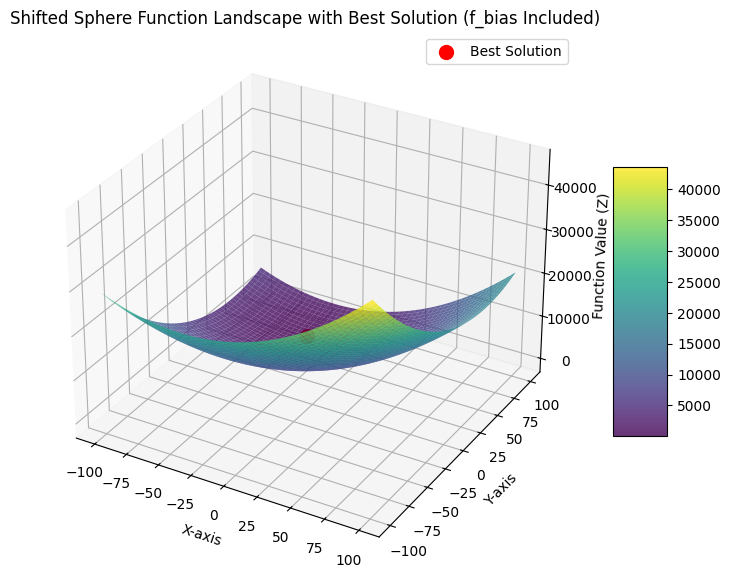

In [22]:
# Run Particle Swarm Optimization on Sphere function for D = 10
best_solutions = []
for i in range(0, 15):
    pso_solution = run_pso_sphere(10)
    best_solutions.append(pso_solution)

In [23]:
# Get Average, Min, Max of Best values for D = 10
best_values = [solution['best_value'] for solution in best_solutions]

average = np.average(best_values)
min = np.min(best_values)
max = np.max(best_values)
standard_deviation = np.std(best_values)

print("Average: ", average)
print("Min: ", min)
print("Max: ", max)
print("Standard Deviation", standard_deviation)

Average:  737.9310792090479
Min:  28.10233461376165
Max:  2181.6477367295897
Standard Deviation 713.3452524182978


Iteration 1/100: Global Best Value = 20.5950
Iteration 2/100: Global Best Value = 14.8449
Iteration 3/100: Global Best Value = 12.9684
Iteration 4/100: Global Best Value = 12.9684
Iteration 5/100: Global Best Value = 12.9684
Iteration 6/100: Global Best Value = 12.9684
Iteration 7/100: Global Best Value = 11.4709
Iteration 8/100: Global Best Value = 11.4709
Iteration 9/100: Global Best Value = 11.4709
Iteration 10/100: Global Best Value = 11.4709
Iteration 11/100: Global Best Value = 10.8853
Iteration 12/100: Global Best Value = 10.8853
Iteration 13/100: Global Best Value = 10.8853
Iteration 14/100: Global Best Value = 10.4697
Iteration 15/100: Global Best Value = 10.4697
Iteration 16/100: Global Best Value = 10.4495
Iteration 17/100: Global Best Value = 10.2337
Iteration 18/100: Global Best Value = 10.0096
Iteration 19/100: Global Best Value = 10.0096
Iteration 20/100: Global Best Value = 10.0096
Iteration 21/100: Global Best Value = 10.0096
Iteration 22/100: Global Best Value = 10.00

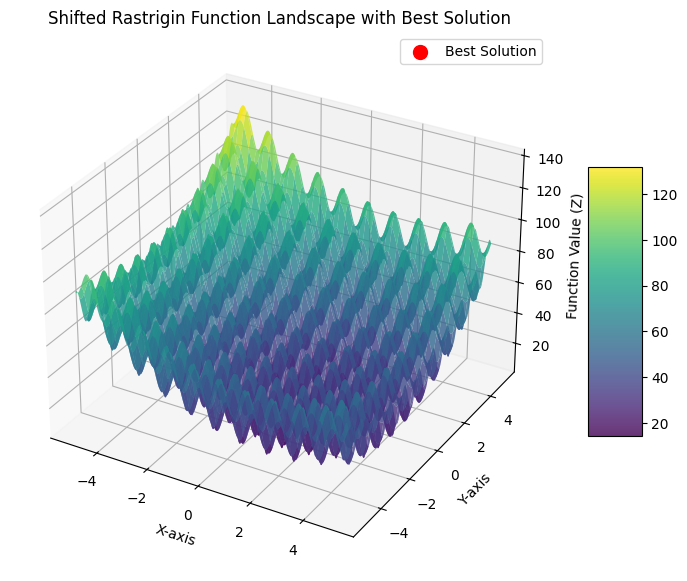

Iteration 1/100: Global Best Value = 14.8207
Iteration 2/100: Global Best Value = 10.7820
Iteration 3/100: Global Best Value = 10.7820
Iteration 4/100: Global Best Value = 10.7820
Iteration 5/100: Global Best Value = 10.7820
Iteration 6/100: Global Best Value = 10.7820
Iteration 7/100: Global Best Value = 10.7820
Iteration 8/100: Global Best Value = 10.0935
Iteration 9/100: Global Best Value = 10.0935
Iteration 10/100: Global Best Value = 10.0935
Iteration 11/100: Global Best Value = 10.0935
Iteration 12/100: Global Best Value = 10.0935
Iteration 13/100: Global Best Value = 10.0935
Iteration 14/100: Global Best Value = 10.0935
Iteration 15/100: Global Best Value = 10.0935
Iteration 16/100: Global Best Value = 10.0935
Iteration 17/100: Global Best Value = 10.0935
Iteration 18/100: Global Best Value = 10.0935
Iteration 19/100: Global Best Value = 10.0490
Iteration 20/100: Global Best Value = 10.0454
Iteration 21/100: Global Best Value = 10.0344
Iteration 22/100: Global Best Value = 10.00

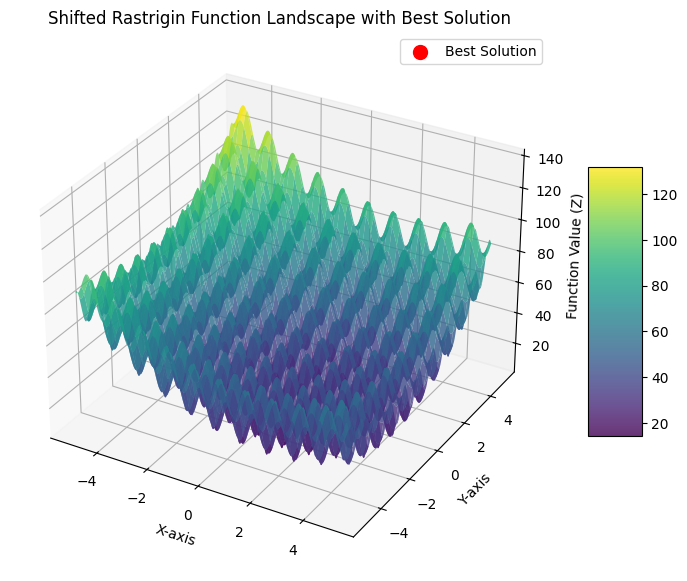

Iteration 1/100: Global Best Value = 19.6710
Iteration 2/100: Global Best Value = 19.0781
Iteration 3/100: Global Best Value = 14.7369
Iteration 4/100: Global Best Value = 14.0280
Iteration 5/100: Global Best Value = 14.0280
Iteration 6/100: Global Best Value = 14.0280
Iteration 7/100: Global Best Value = 13.5898
Iteration 8/100: Global Best Value = 12.4103
Iteration 9/100: Global Best Value = 12.4103
Iteration 10/100: Global Best Value = 12.4103
Iteration 11/100: Global Best Value = 12.4103
Iteration 12/100: Global Best Value = 12.4103
Iteration 13/100: Global Best Value = 12.4103
Iteration 14/100: Global Best Value = 12.2161
Iteration 15/100: Global Best Value = 11.1452
Iteration 16/100: Global Best Value = 11.1452
Iteration 17/100: Global Best Value = 11.1452
Iteration 18/100: Global Best Value = 10.2087
Iteration 19/100: Global Best Value = 10.2087
Iteration 20/100: Global Best Value = 10.2087
Iteration 21/100: Global Best Value = 10.2087
Iteration 22/100: Global Best Value = 10.20

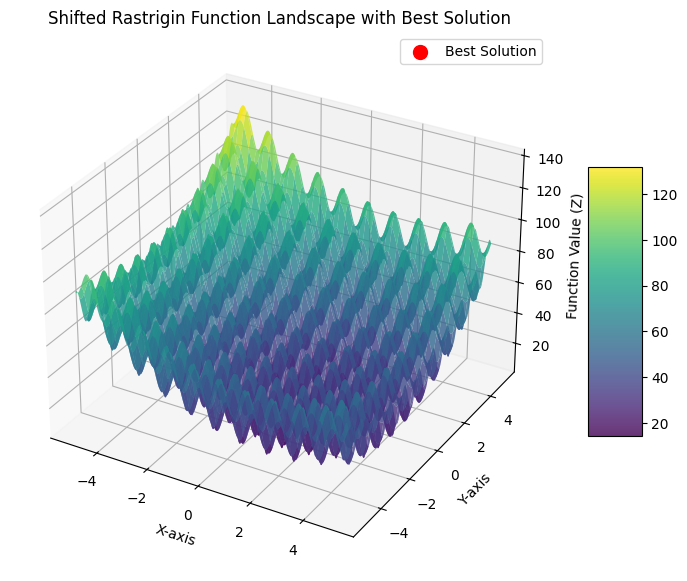

Iteration 1/100: Global Best Value = 13.2652
Iteration 2/100: Global Best Value = 13.2652
Iteration 3/100: Global Best Value = 11.4393
Iteration 4/100: Global Best Value = 11.4393
Iteration 5/100: Global Best Value = 11.4393
Iteration 6/100: Global Best Value = 11.4393
Iteration 7/100: Global Best Value = 11.4393
Iteration 8/100: Global Best Value = 11.4393
Iteration 9/100: Global Best Value = 11.2871
Iteration 10/100: Global Best Value = 11.2871
Iteration 11/100: Global Best Value = 11.2871
Iteration 12/100: Global Best Value = 11.2871
Iteration 13/100: Global Best Value = 11.2871
Iteration 14/100: Global Best Value = 11.1418
Iteration 15/100: Global Best Value = 10.1278
Iteration 16/100: Global Best Value = 10.1278
Iteration 17/100: Global Best Value = 10.1278
Iteration 18/100: Global Best Value = 10.1278
Iteration 19/100: Global Best Value = 10.1278
Iteration 20/100: Global Best Value = 10.1278
Iteration 21/100: Global Best Value = 10.1278
Iteration 22/100: Global Best Value = 10.02

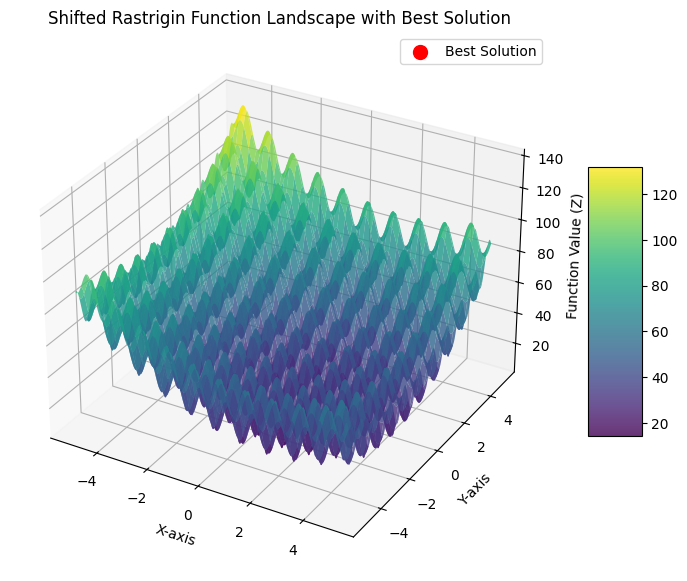

Iteration 1/100: Global Best Value = 21.5716
Iteration 2/100: Global Best Value = 20.8432
Iteration 3/100: Global Best Value = 15.5639
Iteration 4/100: Global Best Value = 15.5639
Iteration 5/100: Global Best Value = 14.6255
Iteration 6/100: Global Best Value = 14.6255
Iteration 7/100: Global Best Value = 10.6156
Iteration 8/100: Global Best Value = 10.6156
Iteration 9/100: Global Best Value = 10.6156
Iteration 10/100: Global Best Value = 10.6156
Iteration 11/100: Global Best Value = 10.2952
Iteration 12/100: Global Best Value = 10.2952
Iteration 13/100: Global Best Value = 10.2952
Iteration 14/100: Global Best Value = 10.2952
Iteration 15/100: Global Best Value = 10.0504
Iteration 16/100: Global Best Value = 10.0427
Iteration 17/100: Global Best Value = 10.0338
Iteration 18/100: Global Best Value = 10.0338
Iteration 19/100: Global Best Value = 10.0121
Iteration 20/100: Global Best Value = 10.0121
Iteration 21/100: Global Best Value = 10.0021
Iteration 22/100: Global Best Value = 10.00

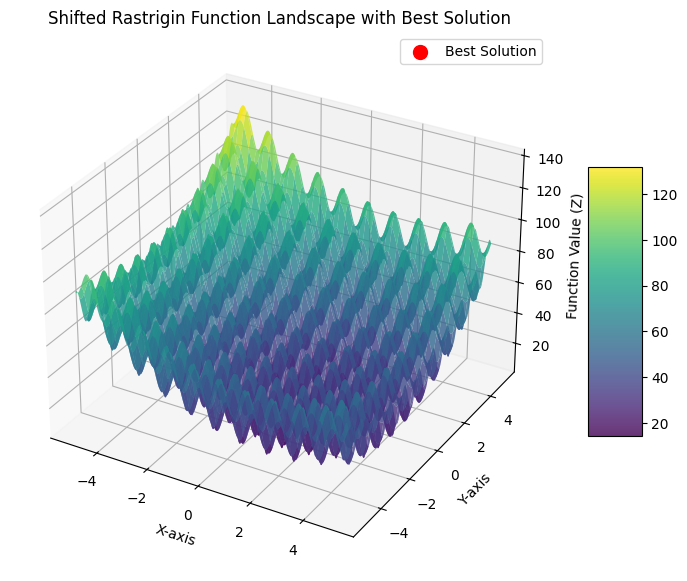

Iteration 1/100: Global Best Value = 12.8923
Iteration 2/100: Global Best Value = 12.8923
Iteration 3/100: Global Best Value = 12.8923
Iteration 4/100: Global Best Value = 11.0216
Iteration 5/100: Global Best Value = 11.0216
Iteration 6/100: Global Best Value = 11.0142
Iteration 7/100: Global Best Value = 11.0142
Iteration 8/100: Global Best Value = 11.0142
Iteration 9/100: Global Best Value = 11.0142
Iteration 10/100: Global Best Value = 11.0142
Iteration 11/100: Global Best Value = 11.0142
Iteration 12/100: Global Best Value = 11.0142
Iteration 13/100: Global Best Value = 11.0142
Iteration 14/100: Global Best Value = 11.0142
Iteration 15/100: Global Best Value = 10.9666
Iteration 16/100: Global Best Value = 10.9666
Iteration 17/100: Global Best Value = 10.9666
Iteration 18/100: Global Best Value = 10.9666
Iteration 19/100: Global Best Value = 10.9666
Iteration 20/100: Global Best Value = 10.9666
Iteration 21/100: Global Best Value = 10.9666
Iteration 22/100: Global Best Value = 10.96

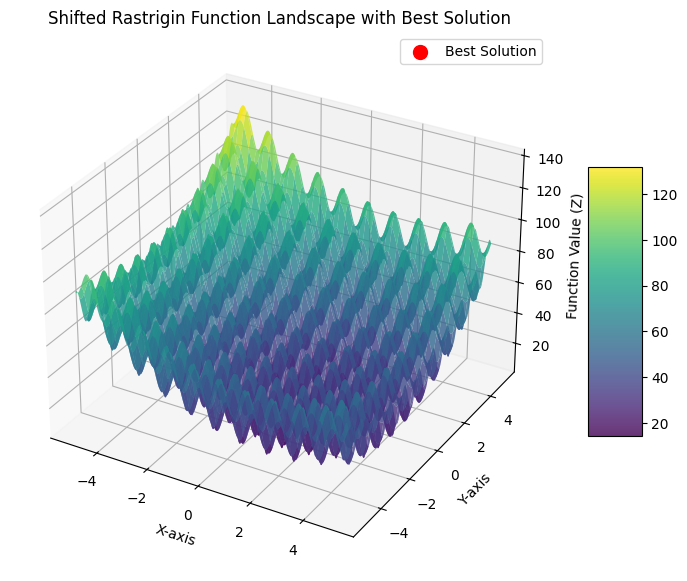

Iteration 1/100: Global Best Value = 20.6787
Iteration 2/100: Global Best Value = 20.6392
Iteration 3/100: Global Best Value = 10.3255
Iteration 4/100: Global Best Value = 10.3255
Iteration 5/100: Global Best Value = 10.3255
Iteration 6/100: Global Best Value = 10.3255
Iteration 7/100: Global Best Value = 10.3255
Iteration 8/100: Global Best Value = 10.3255
Iteration 9/100: Global Best Value = 10.3255
Iteration 10/100: Global Best Value = 10.3255
Iteration 11/100: Global Best Value = 10.3255
Iteration 12/100: Global Best Value = 10.0626
Iteration 13/100: Global Best Value = 10.0626
Iteration 14/100: Global Best Value = 10.0626
Iteration 15/100: Global Best Value = 10.0626
Iteration 16/100: Global Best Value = 10.0252
Iteration 17/100: Global Best Value = 10.0252
Iteration 18/100: Global Best Value = 10.0252
Iteration 19/100: Global Best Value = 10.0243
Iteration 20/100: Global Best Value = 10.0243
Iteration 21/100: Global Best Value = 10.0243
Iteration 22/100: Global Best Value = 10.02

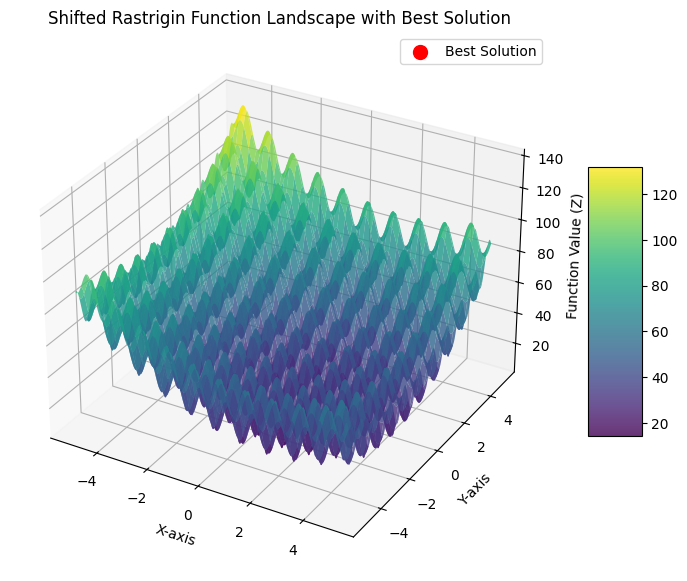

Iteration 1/100: Global Best Value = 11.7960
Iteration 2/100: Global Best Value = 11.1002
Iteration 3/100: Global Best Value = 11.1002
Iteration 4/100: Global Best Value = 11.1002
Iteration 5/100: Global Best Value = 11.1002
Iteration 6/100: Global Best Value = 11.1002
Iteration 7/100: Global Best Value = 10.0810
Iteration 8/100: Global Best Value = 10.0810
Iteration 9/100: Global Best Value = 10.0810
Iteration 10/100: Global Best Value = 10.0810
Iteration 11/100: Global Best Value = 10.0210
Iteration 12/100: Global Best Value = 10.0210
Iteration 13/100: Global Best Value = 10.0210
Iteration 14/100: Global Best Value = 10.0210
Iteration 15/100: Global Best Value = 10.0210
Iteration 16/100: Global Best Value = 10.0210
Iteration 17/100: Global Best Value = 10.0210
Iteration 18/100: Global Best Value = 10.0210
Iteration 19/100: Global Best Value = 10.0210
Iteration 20/100: Global Best Value = 10.0210
Iteration 21/100: Global Best Value = 10.0210
Iteration 22/100: Global Best Value = 10.02

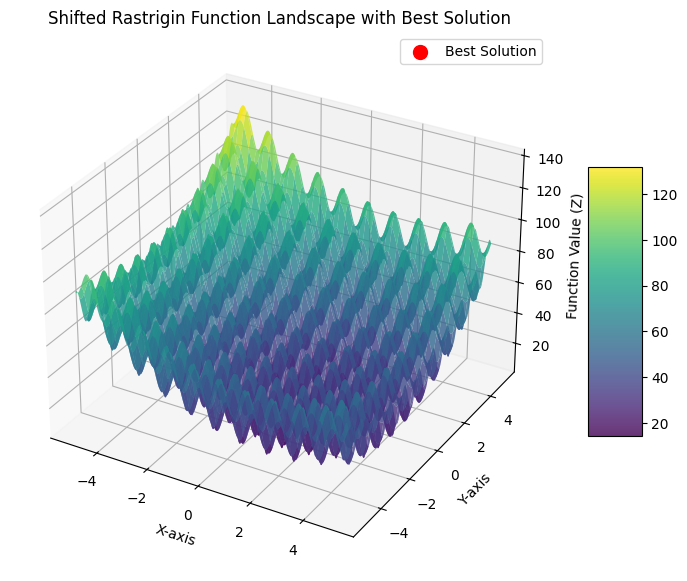

Iteration 1/100: Global Best Value = 25.8105
Iteration 2/100: Global Best Value = 25.8105
Iteration 3/100: Global Best Value = 14.7389
Iteration 4/100: Global Best Value = 11.2232
Iteration 5/100: Global Best Value = 11.2232
Iteration 6/100: Global Best Value = 11.2232
Iteration 7/100: Global Best Value = 11.2232
Iteration 8/100: Global Best Value = 11.2232
Iteration 9/100: Global Best Value = 11.1578
Iteration 10/100: Global Best Value = 11.1578
Iteration 11/100: Global Best Value = 10.8141
Iteration 12/100: Global Best Value = 10.8141
Iteration 13/100: Global Best Value = 10.8141
Iteration 14/100: Global Best Value = 10.8141
Iteration 15/100: Global Best Value = 10.8141
Iteration 16/100: Global Best Value = 10.8141
Iteration 17/100: Global Best Value = 10.8141
Iteration 18/100: Global Best Value = 10.6907
Iteration 19/100: Global Best Value = 10.6737
Iteration 20/100: Global Best Value = 10.6505
Iteration 21/100: Global Best Value = 10.3366
Iteration 22/100: Global Best Value = 10.03

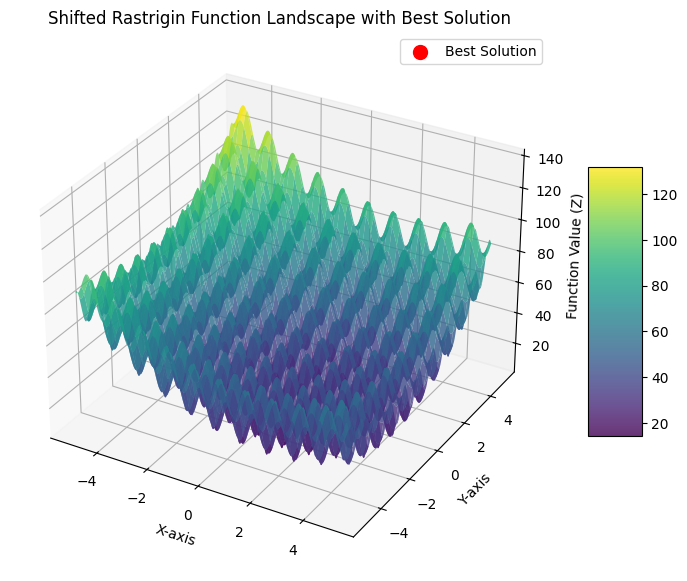

Iteration 1/100: Global Best Value = 13.4112
Iteration 2/100: Global Best Value = 13.4112
Iteration 3/100: Global Best Value = 12.0875
Iteration 4/100: Global Best Value = 12.0875
Iteration 5/100: Global Best Value = 11.6456
Iteration 6/100: Global Best Value = 10.6107
Iteration 7/100: Global Best Value = 10.6107
Iteration 8/100: Global Best Value = 10.6107
Iteration 9/100: Global Best Value = 10.6107
Iteration 10/100: Global Best Value = 10.4220
Iteration 11/100: Global Best Value = 10.4220
Iteration 12/100: Global Best Value = 10.4220
Iteration 13/100: Global Best Value = 10.1392
Iteration 14/100: Global Best Value = 10.0356
Iteration 15/100: Global Best Value = 10.0356
Iteration 16/100: Global Best Value = 10.0356
Iteration 17/100: Global Best Value = 10.0356
Iteration 18/100: Global Best Value = 10.0356
Iteration 19/100: Global Best Value = 10.0356
Iteration 20/100: Global Best Value = 10.0026
Iteration 21/100: Global Best Value = 10.0026
Iteration 22/100: Global Best Value = 10.00

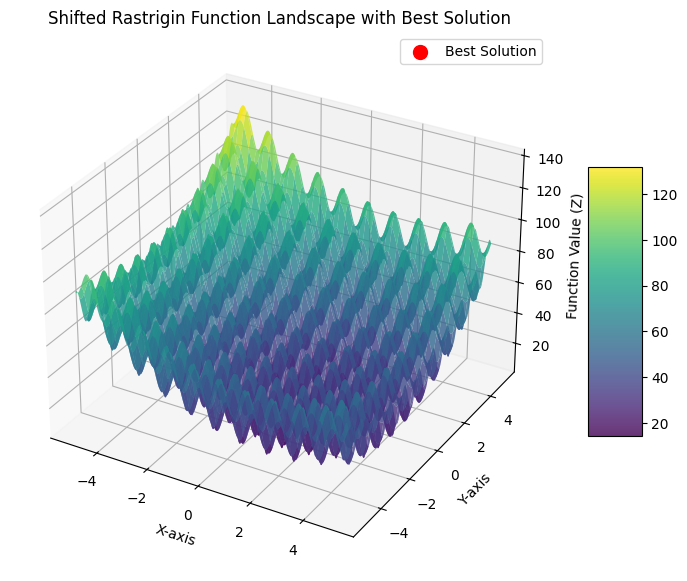

Iteration 1/100: Global Best Value = 22.4605
Iteration 2/100: Global Best Value = 14.5916
Iteration 3/100: Global Best Value = 14.5916
Iteration 4/100: Global Best Value = 14.5916
Iteration 5/100: Global Best Value = 14.5916
Iteration 6/100: Global Best Value = 12.9430
Iteration 7/100: Global Best Value = 10.3274
Iteration 8/100: Global Best Value = 10.3274
Iteration 9/100: Global Best Value = 10.0751
Iteration 10/100: Global Best Value = 10.0115
Iteration 11/100: Global Best Value = 10.0053
Iteration 12/100: Global Best Value = 10.0053
Iteration 13/100: Global Best Value = 10.0053
Iteration 14/100: Global Best Value = 10.0006
Iteration 15/100: Global Best Value = 10.0006
Iteration 16/100: Global Best Value = 10.0006
Iteration 17/100: Global Best Value = 10.0006
Iteration 18/100: Global Best Value = 10.0006
Iteration 19/100: Global Best Value = 10.0006
Iteration 20/100: Global Best Value = 10.0006
Iteration 21/100: Global Best Value = 10.0006
Iteration 22/100: Global Best Value = 10.00

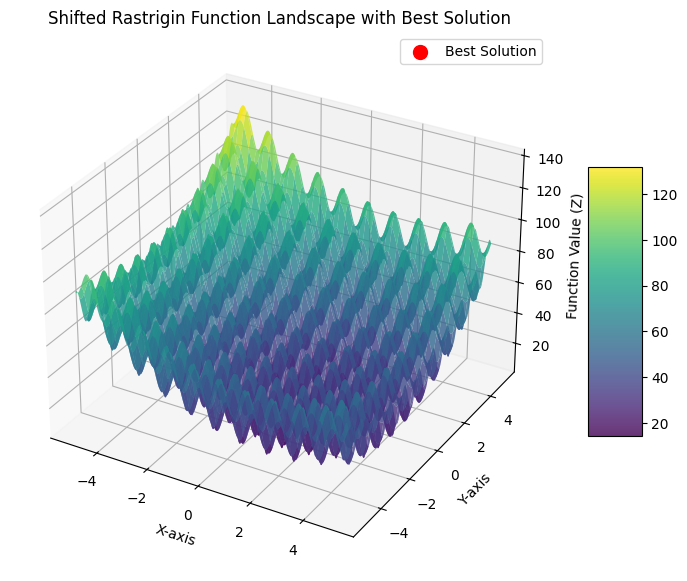

Iteration 1/100: Global Best Value = 17.9993
Iteration 2/100: Global Best Value = 15.0482
Iteration 3/100: Global Best Value = 15.0482
Iteration 4/100: Global Best Value = 10.5271
Iteration 5/100: Global Best Value = 10.5271
Iteration 6/100: Global Best Value = 10.5271
Iteration 7/100: Global Best Value = 10.3698
Iteration 8/100: Global Best Value = 10.3698
Iteration 9/100: Global Best Value = 10.3698
Iteration 10/100: Global Best Value = 10.3698
Iteration 11/100: Global Best Value = 10.3698
Iteration 12/100: Global Best Value = 10.3698
Iteration 13/100: Global Best Value = 10.3698
Iteration 14/100: Global Best Value = 10.3698
Iteration 15/100: Global Best Value = 10.3698
Iteration 16/100: Global Best Value = 10.3353
Iteration 17/100: Global Best Value = 10.0094
Iteration 18/100: Global Best Value = 10.0094
Iteration 19/100: Global Best Value = 10.0094
Iteration 20/100: Global Best Value = 10.0094
Iteration 21/100: Global Best Value = 10.0094
Iteration 22/100: Global Best Value = 10.00

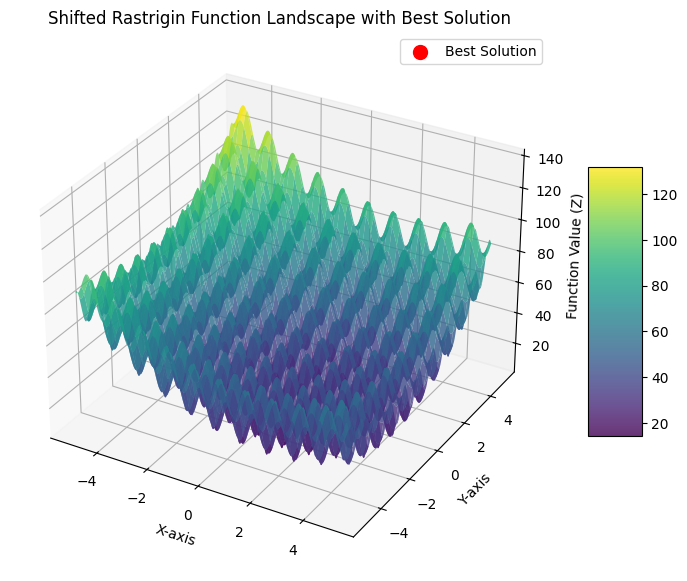

Iteration 1/100: Global Best Value = 17.4692
Iteration 2/100: Global Best Value = 14.4193
Iteration 3/100: Global Best Value = 12.9697
Iteration 4/100: Global Best Value = 12.9697
Iteration 5/100: Global Best Value = 12.1357
Iteration 6/100: Global Best Value = 11.6862
Iteration 7/100: Global Best Value = 10.9956
Iteration 8/100: Global Best Value = 10.9956
Iteration 9/100: Global Best Value = 10.9956
Iteration 10/100: Global Best Value = 10.8751
Iteration 11/100: Global Best Value = 10.8751
Iteration 12/100: Global Best Value = 10.8751
Iteration 13/100: Global Best Value = 10.8751
Iteration 14/100: Global Best Value = 10.8751
Iteration 15/100: Global Best Value = 10.8751
Iteration 16/100: Global Best Value = 10.2690
Iteration 17/100: Global Best Value = 10.2690
Iteration 18/100: Global Best Value = 10.2690
Iteration 19/100: Global Best Value = 10.2690
Iteration 20/100: Global Best Value = 10.2243
Iteration 21/100: Global Best Value = 10.2243
Iteration 22/100: Global Best Value = 10.15

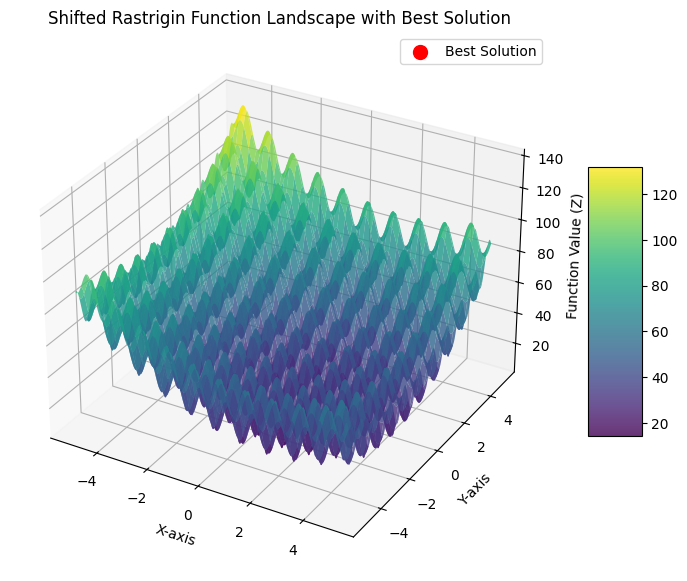

Iteration 1/100: Global Best Value = 18.2922
Iteration 2/100: Global Best Value = 18.2922
Iteration 3/100: Global Best Value = 14.8027
Iteration 4/100: Global Best Value = 14.8027
Iteration 5/100: Global Best Value = 14.5247
Iteration 6/100: Global Best Value = 13.5998
Iteration 7/100: Global Best Value = 10.9909
Iteration 8/100: Global Best Value = 10.9909
Iteration 9/100: Global Best Value = 10.9909
Iteration 10/100: Global Best Value = 10.9909
Iteration 11/100: Global Best Value = 10.2644
Iteration 12/100: Global Best Value = 10.1230
Iteration 13/100: Global Best Value = 10.0374
Iteration 14/100: Global Best Value = 10.0283
Iteration 15/100: Global Best Value = 10.0058
Iteration 16/100: Global Best Value = 10.0045
Iteration 17/100: Global Best Value = 10.0022
Iteration 18/100: Global Best Value = 10.0022
Iteration 19/100: Global Best Value = 10.0022
Iteration 20/100: Global Best Value = 10.0022
Iteration 21/100: Global Best Value = 10.0010
Iteration 22/100: Global Best Value = 10.00

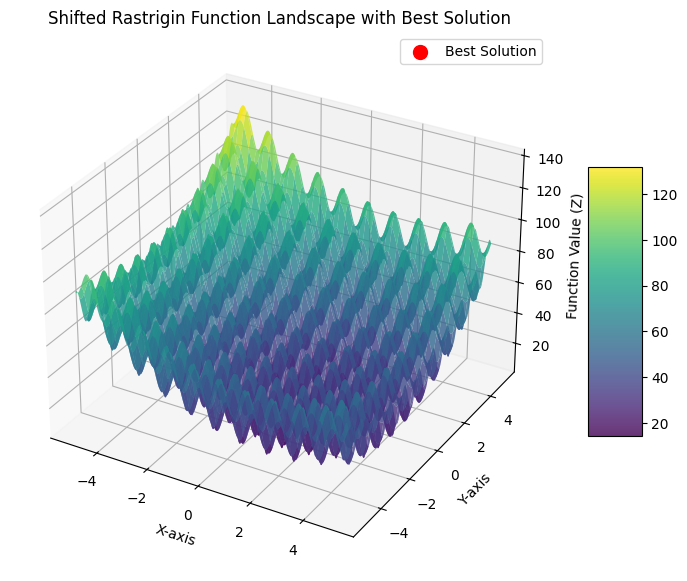

Iteration 1/100: Global Best Value = 18.9902
Iteration 2/100: Global Best Value = 18.9902
Iteration 3/100: Global Best Value = 17.0585
Iteration 4/100: Global Best Value = 14.9204
Iteration 5/100: Global Best Value = 11.5358
Iteration 6/100: Global Best Value = 11.5358
Iteration 7/100: Global Best Value = 11.5358
Iteration 8/100: Global Best Value = 11.5358
Iteration 9/100: Global Best Value = 11.5358
Iteration 10/100: Global Best Value = 10.8575
Iteration 11/100: Global Best Value = 10.8575
Iteration 12/100: Global Best Value = 10.8575
Iteration 13/100: Global Best Value = 10.3845
Iteration 14/100: Global Best Value = 10.3845
Iteration 15/100: Global Best Value = 10.3845
Iteration 16/100: Global Best Value = 10.2937
Iteration 17/100: Global Best Value = 10.1587
Iteration 18/100: Global Best Value = 10.1232
Iteration 19/100: Global Best Value = 10.1232
Iteration 20/100: Global Best Value = 10.0205
Iteration 21/100: Global Best Value = 10.0043
Iteration 22/100: Global Best Value = 10.00

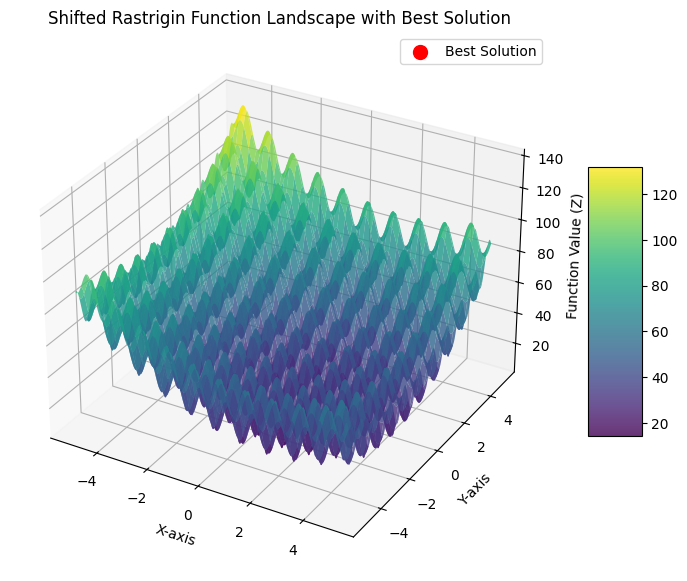

In [24]:
# Run Particle Swarm Optimization on Rastrigin function for D = 2
best_solutions = []
for i in range(0, 15):
    pso_solution = run_pso_rastrigin(2)
    best_solutions.append(pso_solution)

In [25]:
# Get Average, Min, Max of Best values for D = 2
best_values = [solution['best_value'] for solution in best_solutions]

average = np.average(best_values)
min = np.min(best_values)
max = np.max(best_values)
standard_deviation = np.std(best_values)

print("Average: ", average)
print("Min: ", min)
print("Max: ", max)
print("Standard Deviation", standard_deviation)

Average:  10.000000000001071
Min:  10.0
Max:  10.00000000001014
Standard Deviation 2.49536730532939e-12


In [26]:
# Run Particle Swarm Optimization on Rastrigin function for D = 10
best_solutions = []
for i in range(0, 15):
    pso_solution = run_pso_rastrigin(10)
    best_solutions.append(pso_solution)

Iteration 1/100: Global Best Value = 119.7123
Iteration 2/100: Global Best Value = 119.7123
Iteration 3/100: Global Best Value = 119.7123
Iteration 4/100: Global Best Value = 105.3994
Iteration 5/100: Global Best Value = 104.8184
Iteration 6/100: Global Best Value = 104.8184
Iteration 7/100: Global Best Value = 104.8184
Iteration 8/100: Global Best Value = 104.8184
Iteration 9/100: Global Best Value = 104.8184
Iteration 10/100: Global Best Value = 90.4904
Iteration 11/100: Global Best Value = 89.5834
Iteration 12/100: Global Best Value = 89.5834
Iteration 13/100: Global Best Value = 89.5834
Iteration 14/100: Global Best Value = 89.5834
Iteration 15/100: Global Best Value = 74.3491
Iteration 16/100: Global Best Value = 74.3491
Iteration 17/100: Global Best Value = 74.3491
Iteration 18/100: Global Best Value = 53.6384
Iteration 19/100: Global Best Value = 53.6384
Iteration 20/100: Global Best Value = 53.6384
Iteration 21/100: Global Best Value = 53.6384
Iteration 22/100: Global Best Valu

In [27]:
# Get Average, Min, Max of Best values for D = 10
best_values = [solution['best_value'] for solution in best_solutions]

average = np.average(best_values)
min = np.min(best_values)
max = np.max(best_values)
standard_deviation = np.std(best_values)

print("Average: ", average)
print("Min: ", min)
print("Max: ", max)
print("Standard Deviation", standard_deviation)

Average:  31.69158892224726
Min:  16.253935010285517
Max:  45.394163365176695
Standard Deviation 8.420240004730614
